In [1]:
import numpy as np
import time
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import torch.optim as optim
import matplotlib.pyplot as plt
import sys, os

project_root = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
sys.path.append(project_root)

from Resources.Model import Model_v25
from Resources.Game import *


### Initializing shared game stats
##### Only once st the start

In [2]:
stats = torch.Tensor([0, 0, 0, 0]) # batch index, white wins, black wins, draws
torch.save(stats, '/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v25/stats')

##### Initialize Model

In [3]:
model = Model_v25()
model_saves = os.listdir('../Monte Carlo/Model Saves MC v25')
if len(model_saves) > 0:
    newest_model = max(int(i[6:-8]) for i in model_saves)
    latest_batch_index = newest_model
    model.load_state_dict(torch.load('../Monte Carlo/Model Saves MC v25/model_{}_batches'.format(newest_model)))
criterion = nn.MSELoss()

# error_hist =  []
# latest_batch_index = 0

error_hist = torch.load('./error_hist MC v25')

batches:  tensor(1, dtype=torch.int32)
batches:  tensor(2, dtype=torch.int32)
batches:  tensor(3, dtype=torch.int32)
batches:  tensor(4, dtype=torch.int32)
batches:  tensor(5, dtype=torch.int32)
batches:  tensor(6, dtype=torch.int32)
batches:  tensor(7, dtype=torch.int32)
batches:  tensor(9, dtype=torch.int32)
batches:  tensor(10, dtype=torch.int32)


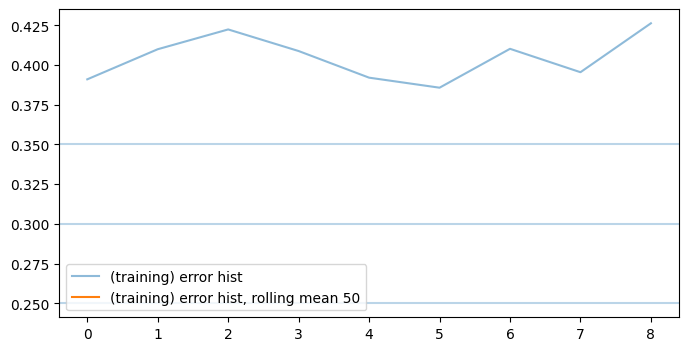

batches:  tensor(11, dtype=torch.int32)
batches:  tensor(12, dtype=torch.int32)
batches:  tensor(14, dtype=torch.int32)
batches:  tensor(15, dtype=torch.int32)
batches:  tensor(16, dtype=torch.int32)
batches:  tensor(17, dtype=torch.int32)
batches:  tensor(19, dtype=torch.int32)
batches:  tensor(20, dtype=torch.int32)


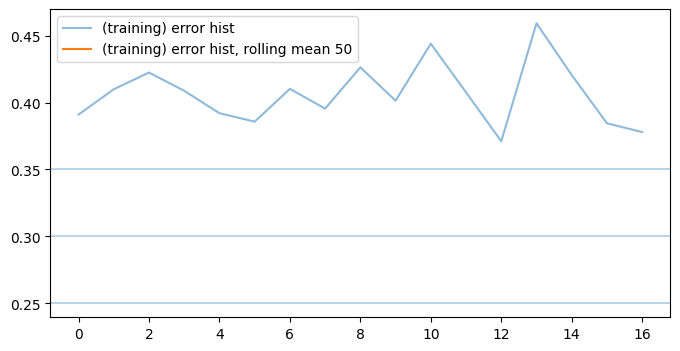

batches:  tensor(21, dtype=torch.int32)
batches:  tensor(22, dtype=torch.int32)
batches:  tensor(24, dtype=torch.int32)
batches:  tensor(25, dtype=torch.int32)
batches:  tensor(26, dtype=torch.int32)
batches:  tensor(27, dtype=torch.int32)
batches:  tensor(28, dtype=torch.int32)
batches:  tensor(29, dtype=torch.int32)
batches:  tensor(30, dtype=torch.int32)


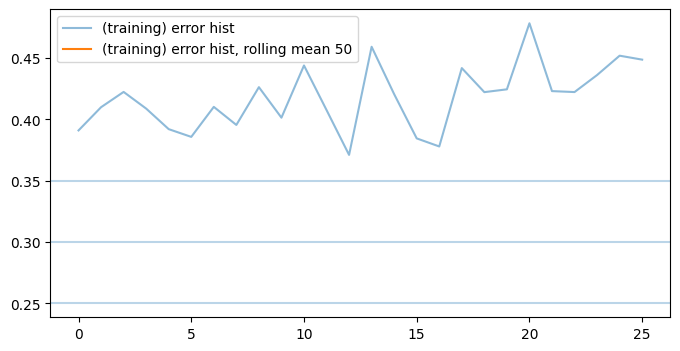

batches:  tensor(31, dtype=torch.int32)
batches:  tensor(32, dtype=torch.int32)
batches:  tensor(33, dtype=torch.int32)
batches:  tensor(34, dtype=torch.int32)
batches:  tensor(35, dtype=torch.int32)
batches:  tensor(36, dtype=torch.int32)
batches:  tensor(37, dtype=torch.int32)
batches:  tensor(38, dtype=torch.int32)
batches:  tensor(39, dtype=torch.int32)
batches:  tensor(40, dtype=torch.int32)


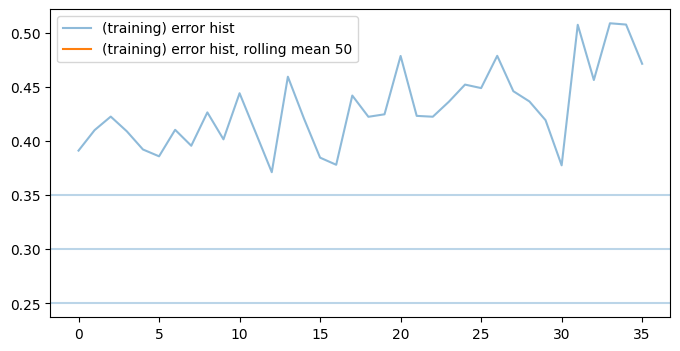

batches:  tensor(41, dtype=torch.int32)
batches:  tensor(42, dtype=torch.int32)
batches:  tensor(43, dtype=torch.int32)
batches:  tensor(44, dtype=torch.int32)
batches:  tensor(45, dtype=torch.int32)
batches:  tensor(46, dtype=torch.int32)
batches:  tensor(47, dtype=torch.int32)
batches:  tensor(48, dtype=torch.int32)
batches:  tensor(49, dtype=torch.int32)
batches:  tensor(50, dtype=torch.int32)


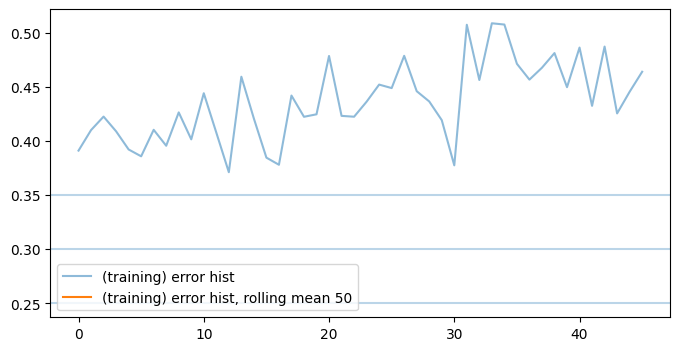

batches:  tensor(51, dtype=torch.int32)
batches:  tensor(52, dtype=torch.int32)
batches:  tensor(53, dtype=torch.int32)
batches:  tensor(54, dtype=torch.int32)
batches:  tensor(55, dtype=torch.int32)
batches:  tensor(56, dtype=torch.int32)
batches:  tensor(57, dtype=torch.int32)
batches:  tensor(58, dtype=torch.int32)
batches:  tensor(59, dtype=torch.int32)
batches:  tensor(60, dtype=torch.int32)


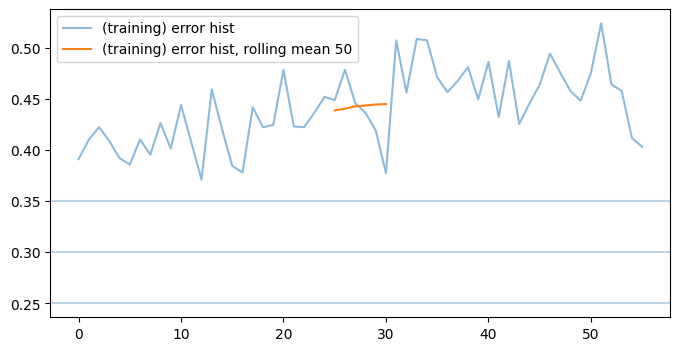

batches:  tensor(61, dtype=torch.int32)
batches:  tensor(62, dtype=torch.int32)
batches:  tensor(63, dtype=torch.int32)
batches:  tensor(64, dtype=torch.int32)
batches:  tensor(65, dtype=torch.int32)
batches:  tensor(66, dtype=torch.int32)
batches:  tensor(67, dtype=torch.int32)
batches:  tensor(68, dtype=torch.int32)
batches:  tensor(69, dtype=torch.int32)
batches:  tensor(70, dtype=torch.int32)


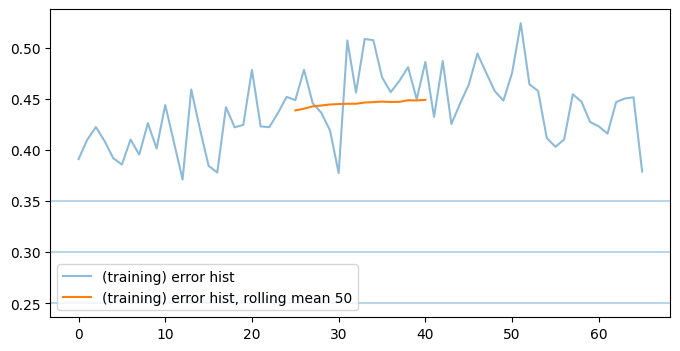

batches:  tensor(71, dtype=torch.int32)
batches:  tensor(72, dtype=torch.int32)
batches:  tensor(73, dtype=torch.int32)
batches:  tensor(74, dtype=torch.int32)
batches:  tensor(75, dtype=torch.int32)
batches:  tensor(76, dtype=torch.int32)
batches:  tensor(77, dtype=torch.int32)
batches:  tensor(78, dtype=torch.int32)
batches:  tensor(79, dtype=torch.int32)
batches:  tensor(80, dtype=torch.int32)


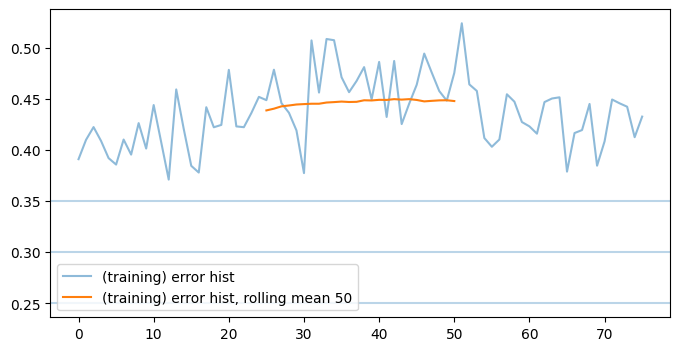

batches:  tensor(81, dtype=torch.int32)
batches:  tensor(82, dtype=torch.int32)
batches:  tensor(83, dtype=torch.int32)
batches:  tensor(84, dtype=torch.int32)
batches:  tensor(85, dtype=torch.int32)
batches:  tensor(86, dtype=torch.int32)
batches:  tensor(87, dtype=torch.int32)
batches:  tensor(88, dtype=torch.int32)
batches:  tensor(89, dtype=torch.int32)
batches:  tensor(90, dtype=torch.int32)


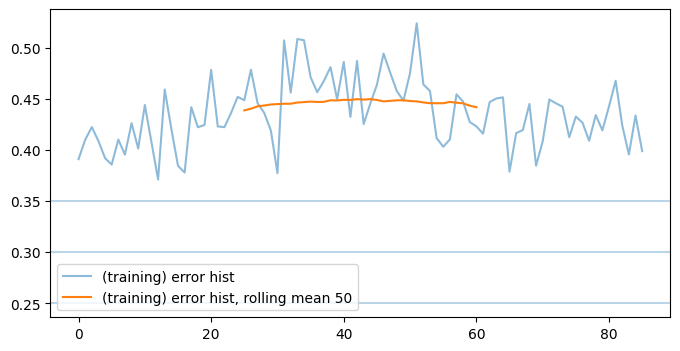

batches:  tensor(91, dtype=torch.int32)
batches:  tensor(92, dtype=torch.int32)
batches:  tensor(93, dtype=torch.int32)
batches:  tensor(94, dtype=torch.int32)
batches:  tensor(95, dtype=torch.int32)
batches:  tensor(96, dtype=torch.int32)
batches:  tensor(97, dtype=torch.int32)
batches:  tensor(98, dtype=torch.int32)
batches:  tensor(99, dtype=torch.int32)
batches:  tensor(100, dtype=torch.int32)


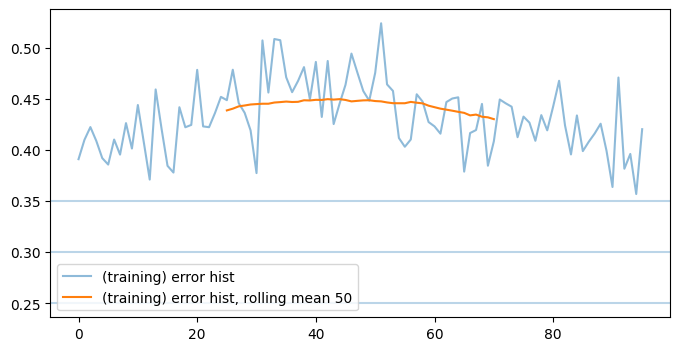

batches:  tensor(101, dtype=torch.int32)
batches:  tensor(102, dtype=torch.int32)
batches:  tensor(103, dtype=torch.int32)
batches:  tensor(104, dtype=torch.int32)
batches:  tensor(105, dtype=torch.int32)
batches:  tensor(106, dtype=torch.int32)
batches:  tensor(107, dtype=torch.int32)
batches:  tensor(108, dtype=torch.int32)
batches:  tensor(109, dtype=torch.int32)
batches:  tensor(110, dtype=torch.int32)


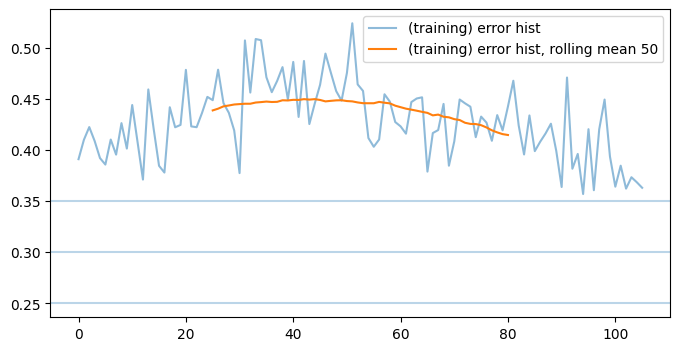

batches:  tensor(111, dtype=torch.int32)
batches:  tensor(112, dtype=torch.int32)
batches:  tensor(113, dtype=torch.int32)
batches:  tensor(114, dtype=torch.int32)
batches:  tensor(115, dtype=torch.int32)
batches:  tensor(116, dtype=torch.int32)
batches:  tensor(117, dtype=torch.int32)
batches:  tensor(118, dtype=torch.int32)
batches:  tensor(119, dtype=torch.int32)
batches:  tensor(120, dtype=torch.int32)


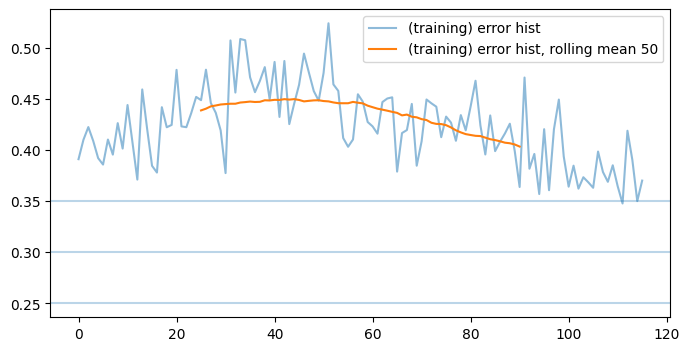

batches:  tensor(121, dtype=torch.int32)
batches:  tensor(122, dtype=torch.int32)
batches:  tensor(123, dtype=torch.int32)
batches:  tensor(124, dtype=torch.int32)
batches:  tensor(125, dtype=torch.int32)
batches:  tensor(126, dtype=torch.int32)
batches:  tensor(127, dtype=torch.int32)
batches:  tensor(128, dtype=torch.int32)
batches:  tensor(130, dtype=torch.int32)


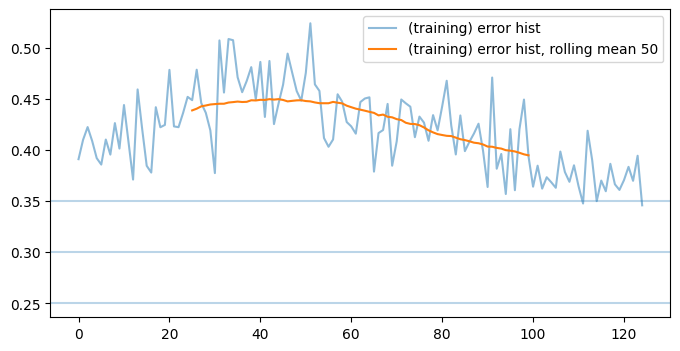

batches:  tensor(131, dtype=torch.int32)
batches:  tensor(132, dtype=torch.int32)
batches:  tensor(133, dtype=torch.int32)
batches:  tensor(134, dtype=torch.int32)
batches:  tensor(135, dtype=torch.int32)
batches:  tensor(136, dtype=torch.int32)
batches:  tensor(137, dtype=torch.int32)
batches:  tensor(138, dtype=torch.int32)
batches:  tensor(140, dtype=torch.int32)


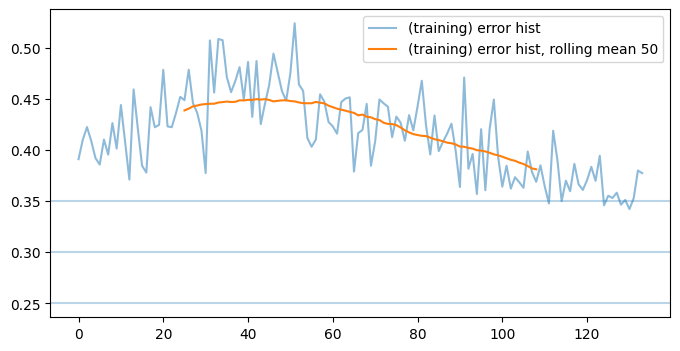

batches:  tensor(141, dtype=torch.int32)
batches:  tensor(142, dtype=torch.int32)
batches:  tensor(143, dtype=torch.int32)
batches:  tensor(144, dtype=torch.int32)
batches:  tensor(145, dtype=torch.int32)
batches:  tensor(146, dtype=torch.int32)
batches:  tensor(147, dtype=torch.int32)
batches:  tensor(148, dtype=torch.int32)
batches:  tensor(149, dtype=torch.int32)
batches:  tensor(150, dtype=torch.int32)


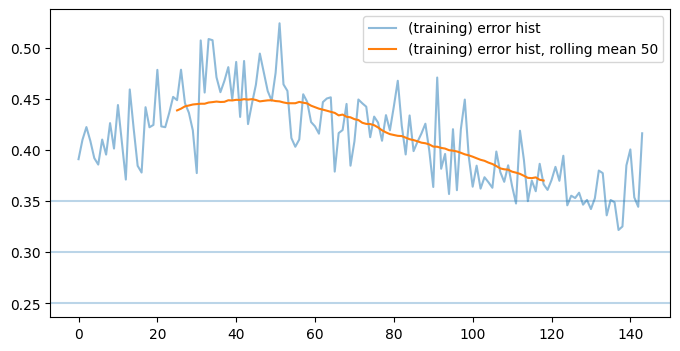

batches:  tensor(151, dtype=torch.int32)
batches:  tensor(152, dtype=torch.int32)
batches:  tensor(153, dtype=torch.int32)
batches:  tensor(154, dtype=torch.int32)
batches:  tensor(155, dtype=torch.int32)
batches:  tensor(156, dtype=torch.int32)
batches:  tensor(157, dtype=torch.int32)
batches:  tensor(158, dtype=torch.int32)
batches:  tensor(159, dtype=torch.int32)
batches:  tensor(160, dtype=torch.int32)


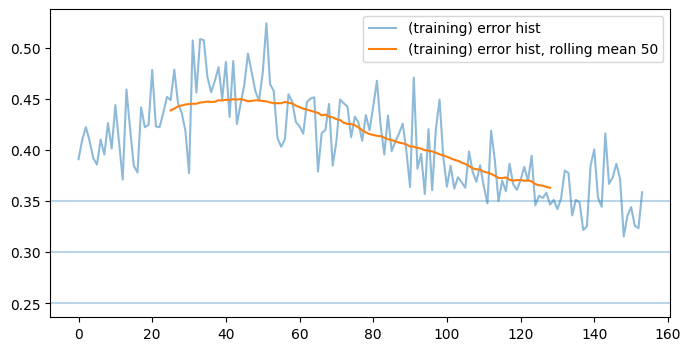

batches:  tensor(161, dtype=torch.int32)
batches:  tensor(162, dtype=torch.int32)
batches:  tensor(163, dtype=torch.int32)
batches:  tensor(164, dtype=torch.int32)
batches:  tensor(165, dtype=torch.int32)
batches:  tensor(166, dtype=torch.int32)
batches:  tensor(167, dtype=torch.int32)
batches:  tensor(168, dtype=torch.int32)
batches:  tensor(169, dtype=torch.int32)
batches:  tensor(170, dtype=torch.int32)


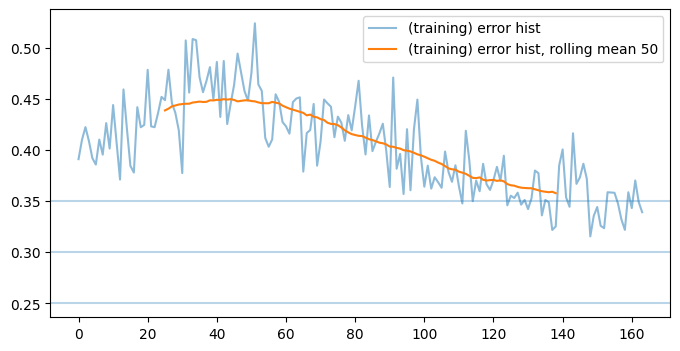

batches:  tensor(171, dtype=torch.int32)
batches:  tensor(172, dtype=torch.int32)
batches:  tensor(173, dtype=torch.int32)
batches:  tensor(174, dtype=torch.int32)
batches:  tensor(175, dtype=torch.int32)
batches:  tensor(176, dtype=torch.int32)
batches:  tensor(177, dtype=torch.int32)
batches:  tensor(178, dtype=torch.int32)
batches:  tensor(179, dtype=torch.int32)
batches:  tensor(180, dtype=torch.int32)


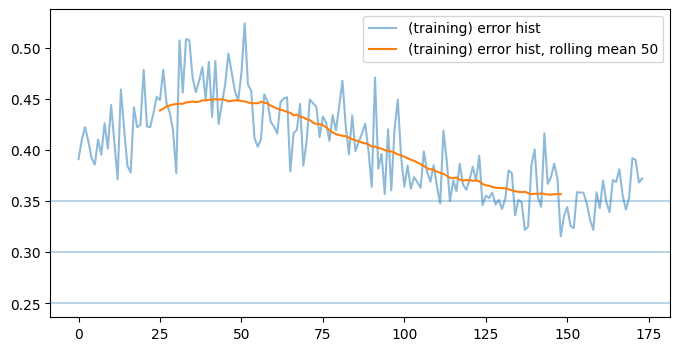

batches:  tensor(181, dtype=torch.int32)
batches:  tensor(182, dtype=torch.int32)
batches:  tensor(183, dtype=torch.int32)
batches:  tensor(184, dtype=torch.int32)
batches:  tensor(185, dtype=torch.int32)
batches:  tensor(186, dtype=torch.int32)
batches:  tensor(187, dtype=torch.int32)
batches:  tensor(188, dtype=torch.int32)
batches:  tensor(189, dtype=torch.int32)
batches:  tensor(190, dtype=torch.int32)


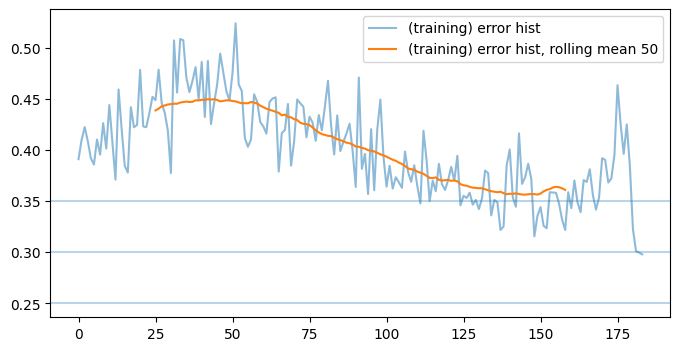

batches:  tensor(191, dtype=torch.int32)
batches:  tensor(192, dtype=torch.int32)
batches:  tensor(193, dtype=torch.int32)
batches:  tensor(194, dtype=torch.int32)
batches:  tensor(195, dtype=torch.int32)
batches:  tensor(196, dtype=torch.int32)
batches:  tensor(197, dtype=torch.int32)
batches:  tensor(198, dtype=torch.int32)
batches:  tensor(199, dtype=torch.int32)
batches:  tensor(200, dtype=torch.int32)


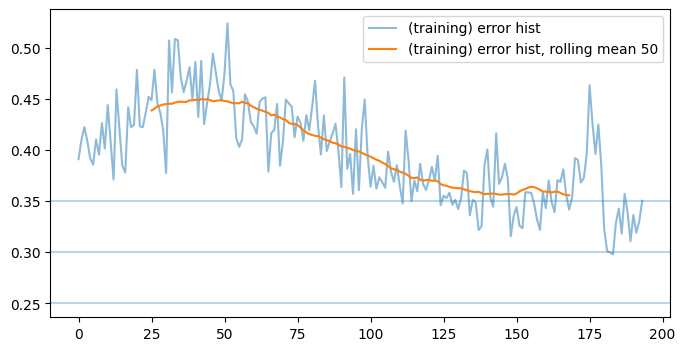

batches:  tensor(201, dtype=torch.int32)
batches:  tensor(202, dtype=torch.int32)
batches:  tensor(203, dtype=torch.int32)
batches:  tensor(204, dtype=torch.int32)
batches:  tensor(205, dtype=torch.int32)
batches:  tensor(206, dtype=torch.int32)
batches:  tensor(207, dtype=torch.int32)
batches:  tensor(208, dtype=torch.int32)
batches:  tensor(209, dtype=torch.int32)
batches:  tensor(210, dtype=torch.int32)


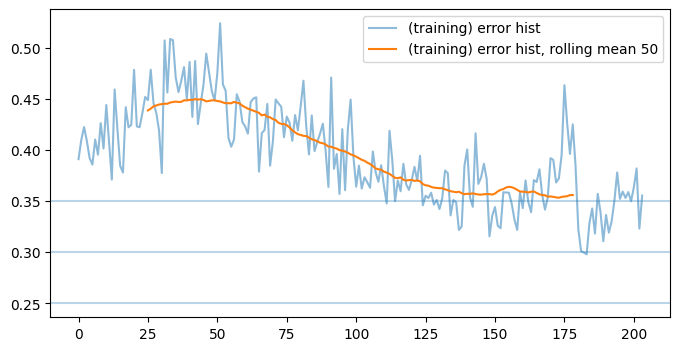

batches:  tensor(211, dtype=torch.int32)
batches:  tensor(212, dtype=torch.int32)
batches:  tensor(213, dtype=torch.int32)
batches:  tensor(214, dtype=torch.int32)
batches:  tensor(215, dtype=torch.int32)
batches:  tensor(216, dtype=torch.int32)
batches:  tensor(217, dtype=torch.int32)
batches:  tensor(218, dtype=torch.int32)
batches:  tensor(219, dtype=torch.int32)
batches:  tensor(220, dtype=torch.int32)


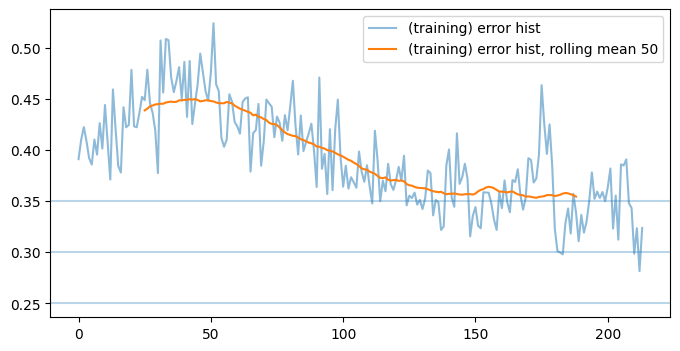

batches:  tensor(221, dtype=torch.int32)
batches:  tensor(222, dtype=torch.int32)
batches:  tensor(223, dtype=torch.int32)
batches:  tensor(224, dtype=torch.int32)
batches:  tensor(225, dtype=torch.int32)
batches:  tensor(226, dtype=torch.int32)
batches:  tensor(227, dtype=torch.int32)
batches:  tensor(228, dtype=torch.int32)
batches:  tensor(229, dtype=torch.int32)
batches:  tensor(230, dtype=torch.int32)


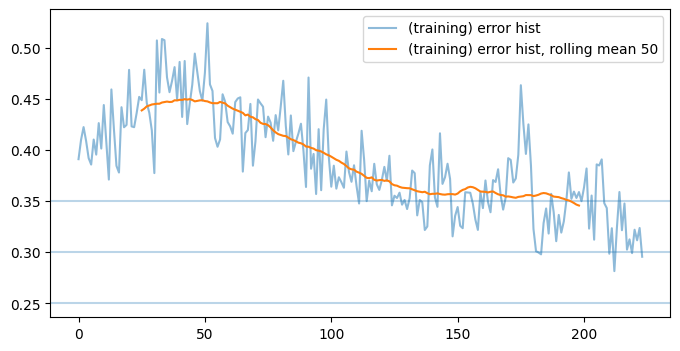

batches:  tensor(231, dtype=torch.int32)
batches:  tensor(232, dtype=torch.int32)
batches:  tensor(233, dtype=torch.int32)
batches:  tensor(234, dtype=torch.int32)
batches:  tensor(235, dtype=torch.int32)
batches:  tensor(236, dtype=torch.int32)
batches:  tensor(237, dtype=torch.int32)
batches:  tensor(238, dtype=torch.int32)
batches:  tensor(239, dtype=torch.int32)
batches:  tensor(240, dtype=torch.int32)


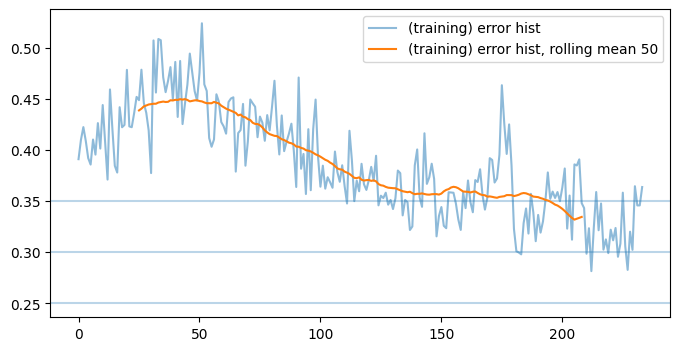

batches:  tensor(241, dtype=torch.int32)
batches:  tensor(242, dtype=torch.int32)
batches:  tensor(243, dtype=torch.int32)
batches:  tensor(244, dtype=torch.int32)
batches:  tensor(245, dtype=torch.int32)
batches:  tensor(246, dtype=torch.int32)
batches:  tensor(247, dtype=torch.int32)
batches:  tensor(248, dtype=torch.int32)
batches:  tensor(249, dtype=torch.int32)
batches:  tensor(250, dtype=torch.int32)


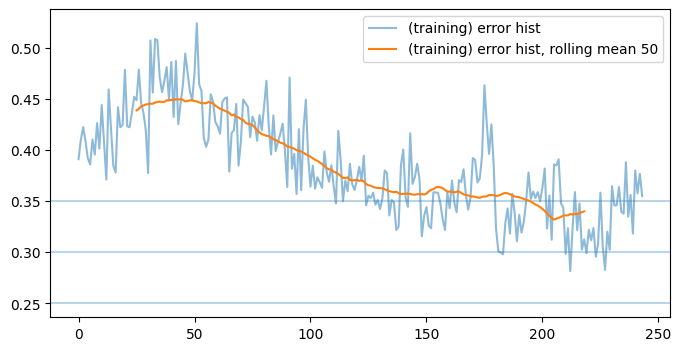

batches:  tensor(251, dtype=torch.int32)
batches:  tensor(252, dtype=torch.int32)
batches:  tensor(253, dtype=torch.int32)
batches:  tensor(254, dtype=torch.int32)
batches:  tensor(255, dtype=torch.int32)
batches:  tensor(256, dtype=torch.int32)
batches:  tensor(257, dtype=torch.int32)
batches:  tensor(258, dtype=torch.int32)
batches:  tensor(259, dtype=torch.int32)
batches:  tensor(260, dtype=torch.int32)


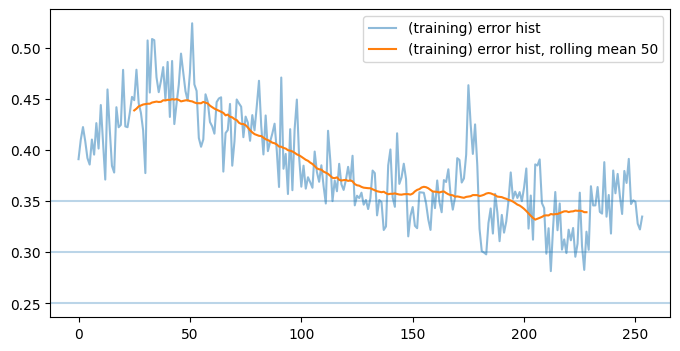

batches:  tensor(261, dtype=torch.int32)
batches:  tensor(262, dtype=torch.int32)
batches:  tensor(263, dtype=torch.int32)
batches:  tensor(264, dtype=torch.int32)
batches:  tensor(265, dtype=torch.int32)
batches:  tensor(266, dtype=torch.int32)
batches:  tensor(267, dtype=torch.int32)
batches:  tensor(268, dtype=torch.int32)
batches:  tensor(269, dtype=torch.int32)
batches:  tensor(270, dtype=torch.int32)


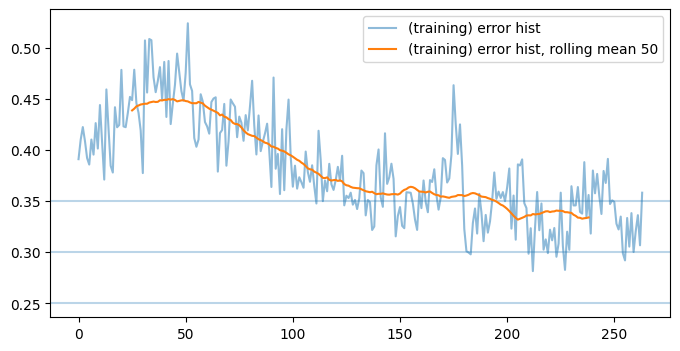

batches:  tensor(271, dtype=torch.int32)
batches:  tensor(272, dtype=torch.int32)
batches:  tensor(273, dtype=torch.int32)
batches:  tensor(274, dtype=torch.int32)
batches:  tensor(275, dtype=torch.int32)
batches:  tensor(276, dtype=torch.int32)
batches:  tensor(277, dtype=torch.int32)
batches:  tensor(278, dtype=torch.int32)
batches:  tensor(279, dtype=torch.int32)
batches:  tensor(280, dtype=torch.int32)


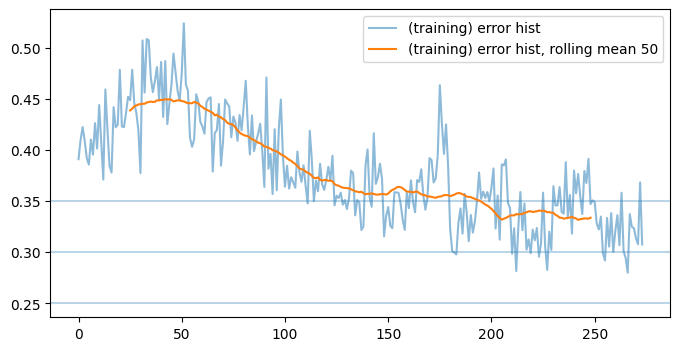

batches:  tensor(281, dtype=torch.int32)
batches:  tensor(282, dtype=torch.int32)
batches:  tensor(283, dtype=torch.int32)
batches:  tensor(284, dtype=torch.int32)
batches:  tensor(285, dtype=torch.int32)
batches:  tensor(286, dtype=torch.int32)
batches:  tensor(287, dtype=torch.int32)
batches:  tensor(288, dtype=torch.int32)
batches:  tensor(289, dtype=torch.int32)
batches:  tensor(290, dtype=torch.int32)


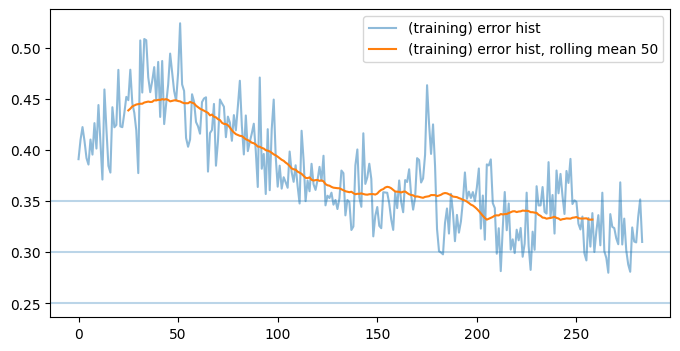

batches:  tensor(291, dtype=torch.int32)
batches:  tensor(292, dtype=torch.int32)
batches:  tensor(293, dtype=torch.int32)
batches:  tensor(294, dtype=torch.int32)
batches:  tensor(295, dtype=torch.int32)
batches:  tensor(296, dtype=torch.int32)
batches:  tensor(297, dtype=torch.int32)
batches:  tensor(298, dtype=torch.int32)
batches:  tensor(299, dtype=torch.int32)
batches:  tensor(300, dtype=torch.int32)


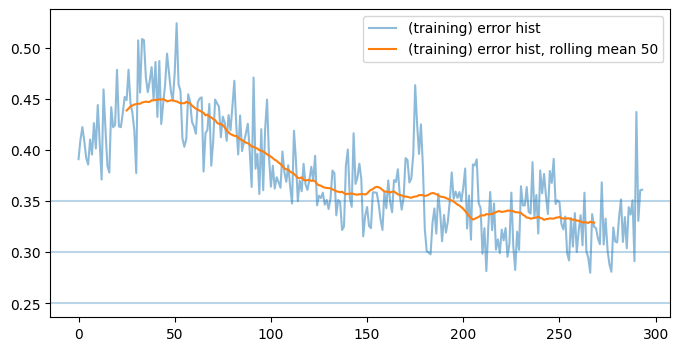

batches:  tensor(301, dtype=torch.int32)
batches:  tensor(302, dtype=torch.int32)
batches:  tensor(303, dtype=torch.int32)
batches:  tensor(304, dtype=torch.int32)
batches:  tensor(305, dtype=torch.int32)
batches:  tensor(306, dtype=torch.int32)
batches:  tensor(307, dtype=torch.int32)
batches:  tensor(308, dtype=torch.int32)
batches:  tensor(309, dtype=torch.int32)
batches:  tensor(310, dtype=torch.int32)


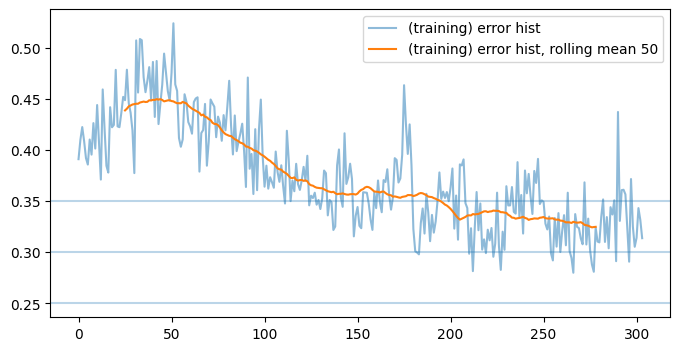

batches:  tensor(311, dtype=torch.int32)
batches:  tensor(312, dtype=torch.int32)
batches:  tensor(313, dtype=torch.int32)
batches:  tensor(314, dtype=torch.int32)
batches:  tensor(315, dtype=torch.int32)
batches:  tensor(316, dtype=torch.int32)
batches:  tensor(317, dtype=torch.int32)
batches:  tensor(318, dtype=torch.int32)
batches:  tensor(319, dtype=torch.int32)
batches:  tensor(320, dtype=torch.int32)


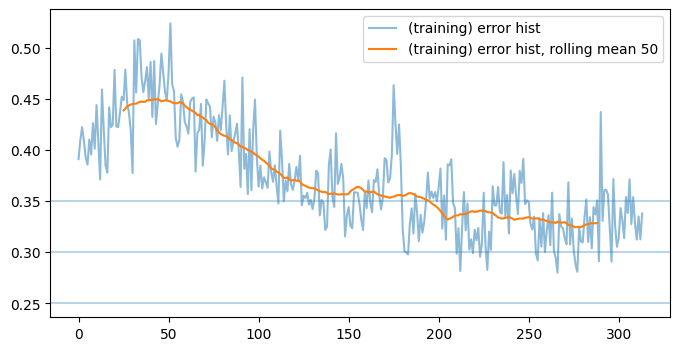

batches:  tensor(321, dtype=torch.int32)
batches:  tensor(322, dtype=torch.int32)
batches:  tensor(323, dtype=torch.int32)
batches:  tensor(324, dtype=torch.int32)
batches:  tensor(325, dtype=torch.int32)
batches:  tensor(326, dtype=torch.int32)
batches:  tensor(327, dtype=torch.int32)
batches:  tensor(328, dtype=torch.int32)
batches:  tensor(329, dtype=torch.int32)
batches:  tensor(330, dtype=torch.int32)


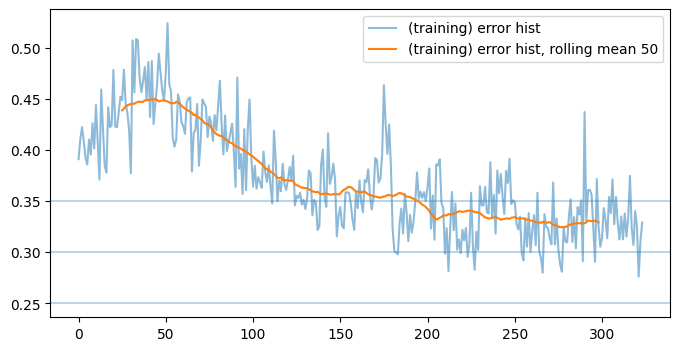

batches:  tensor(331, dtype=torch.int32)
batches:  tensor(332, dtype=torch.int32)
batches:  tensor(333, dtype=torch.int32)
batches:  tensor(334, dtype=torch.int32)
batches:  tensor(335, dtype=torch.int32)
batches:  tensor(336, dtype=torch.int32)
batches:  tensor(337, dtype=torch.int32)
batches:  tensor(338, dtype=torch.int32)
batches:  tensor(339, dtype=torch.int32)
batches:  tensor(340, dtype=torch.int32)


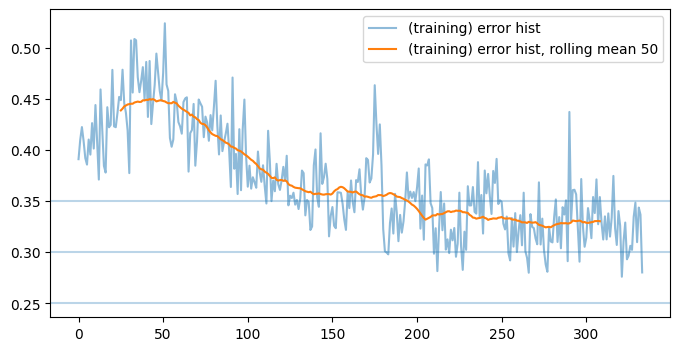

batches:  tensor(341, dtype=torch.int32)
batches:  tensor(342, dtype=torch.int32)
batches:  tensor(343, dtype=torch.int32)
batches:  tensor(344, dtype=torch.int32)
batches:  tensor(345, dtype=torch.int32)
batches:  tensor(346, dtype=torch.int32)
batches:  tensor(347, dtype=torch.int32)
batches:  tensor(348, dtype=torch.int32)
batches:  tensor(349, dtype=torch.int32)
batches:  tensor(350, dtype=torch.int32)


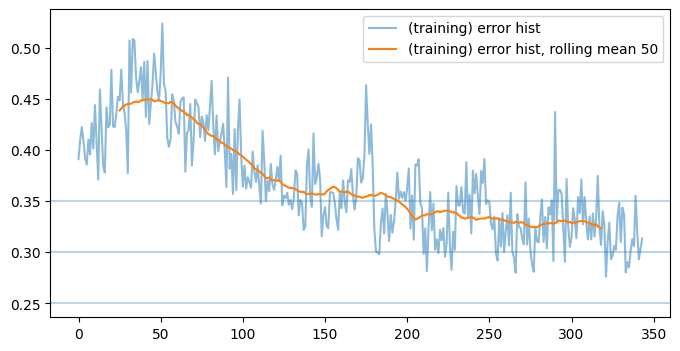

batches:  tensor(351, dtype=torch.int32)
batches:  tensor(352, dtype=torch.int32)
batches:  tensor(353, dtype=torch.int32)
batches:  tensor(354, dtype=torch.int32)
batches:  tensor(355, dtype=torch.int32)
batches:  tensor(356, dtype=torch.int32)
batches:  tensor(357, dtype=torch.int32)
batches:  tensor(358, dtype=torch.int32)
batches:  tensor(359, dtype=torch.int32)
batches:  tensor(360, dtype=torch.int32)


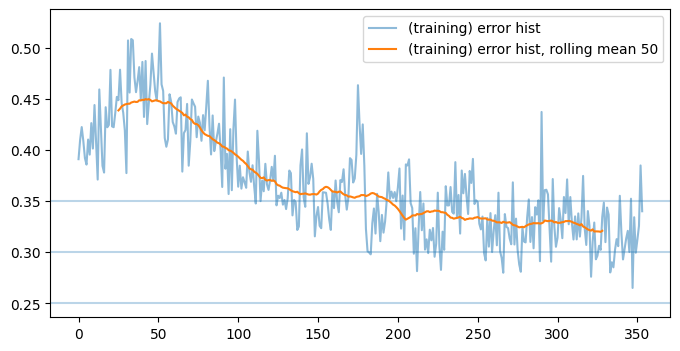

batches:  tensor(361, dtype=torch.int32)
batches:  tensor(362, dtype=torch.int32)
batches:  tensor(363, dtype=torch.int32)
batches:  tensor(364, dtype=torch.int32)
batches:  tensor(365, dtype=torch.int32)
batches:  tensor(366, dtype=torch.int32)
batches:  tensor(367, dtype=torch.int32)
batches:  tensor(368, dtype=torch.int32)
batches:  tensor(369, dtype=torch.int32)
batches:  tensor(370, dtype=torch.int32)


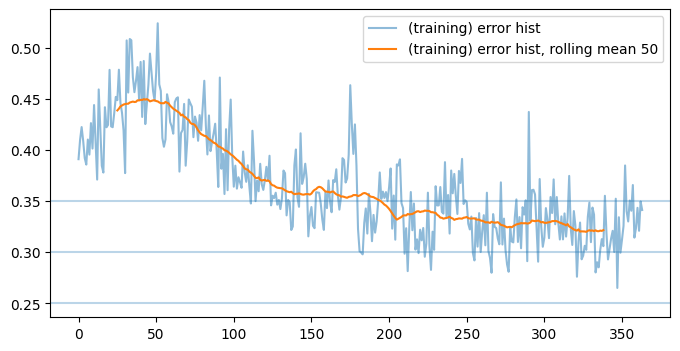

batches:  tensor(371, dtype=torch.int32)
batches:  tensor(372, dtype=torch.int32)
batches:  tensor(373, dtype=torch.int32)
batches:  tensor(374, dtype=torch.int32)
batches:  tensor(375, dtype=torch.int32)
batches:  tensor(376, dtype=torch.int32)
batches:  tensor(377, dtype=torch.int32)
batches:  tensor(378, dtype=torch.int32)
batches:  tensor(379, dtype=torch.int32)
batches:  tensor(380, dtype=torch.int32)


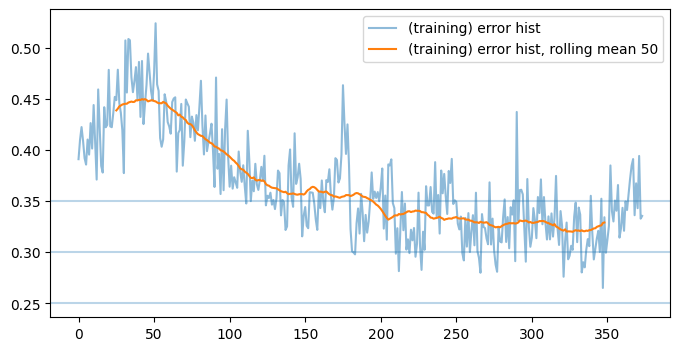

batches:  tensor(381, dtype=torch.int32)
batches:  tensor(382, dtype=torch.int32)
batches:  tensor(383, dtype=torch.int32)
batches:  tensor(384, dtype=torch.int32)
batches:  tensor(385, dtype=torch.int32)
batches:  tensor(386, dtype=torch.int32)
batches:  tensor(387, dtype=torch.int32)
batches:  tensor(388, dtype=torch.int32)
batches:  tensor(389, dtype=torch.int32)
batches:  tensor(390, dtype=torch.int32)


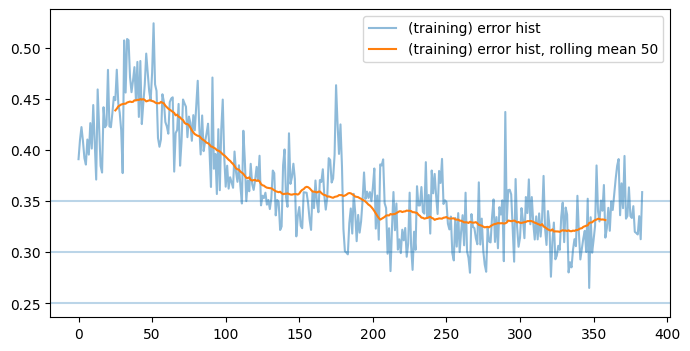

batches:  tensor(391, dtype=torch.int32)
batches:  tensor(392, dtype=torch.int32)
batches:  tensor(393, dtype=torch.int32)
batches:  tensor(394, dtype=torch.int32)
batches:  tensor(395, dtype=torch.int32)
batches:  tensor(396, dtype=torch.int32)
batches:  tensor(397, dtype=torch.int32)
batches:  tensor(398, dtype=torch.int32)
batches:  tensor(399, dtype=torch.int32)
batches:  tensor(400, dtype=torch.int32)


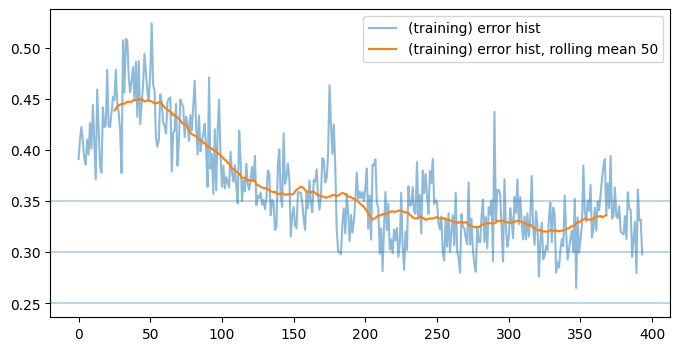

batches:  tensor(401, dtype=torch.int32)
batches:  tensor(402, dtype=torch.int32)
batches:  tensor(403, dtype=torch.int32)
batches:  tensor(404, dtype=torch.int32)
batches:  tensor(405, dtype=torch.int32)
batches:  tensor(406, dtype=torch.int32)
batches:  tensor(407, dtype=torch.int32)
batches:  tensor(408, dtype=torch.int32)
batches:  tensor(409, dtype=torch.int32)
batches:  tensor(410, dtype=torch.int32)


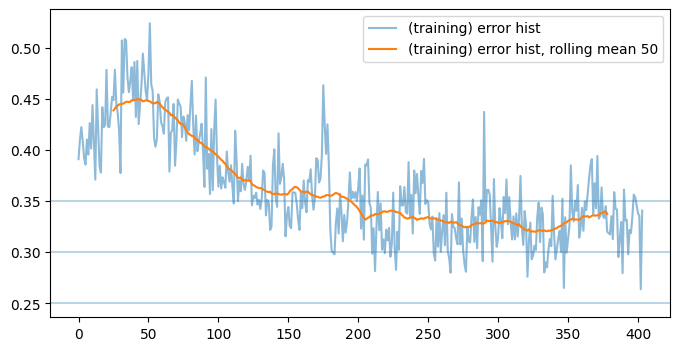

batches:  tensor(411, dtype=torch.int32)
batches:  tensor(412, dtype=torch.int32)
batches:  tensor(413, dtype=torch.int32)
batches:  tensor(414, dtype=torch.int32)
batches:  tensor(415, dtype=torch.int32)
batches:  tensor(416, dtype=torch.int32)
batches:  tensor(417, dtype=torch.int32)
batches:  tensor(418, dtype=torch.int32)
batches:  tensor(420, dtype=torch.int32)


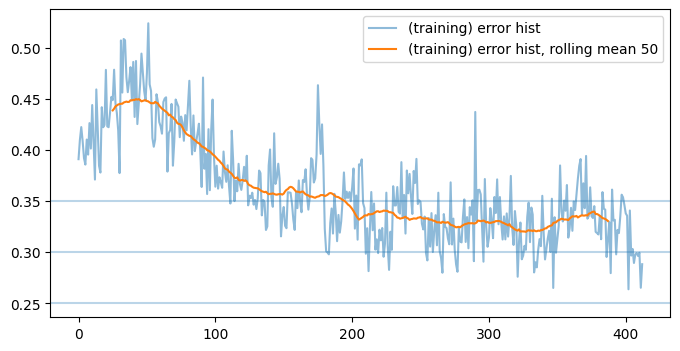

batches:  tensor(421, dtype=torch.int32)
batches:  tensor(422, dtype=torch.int32)
batches:  tensor(423, dtype=torch.int32)
batches:  tensor(425, dtype=torch.int32)
batches:  tensor(426, dtype=torch.int32)
batches:  tensor(427, dtype=torch.int32)
batches:  tensor(428, dtype=torch.int32)
batches:  tensor(430, dtype=torch.int32)


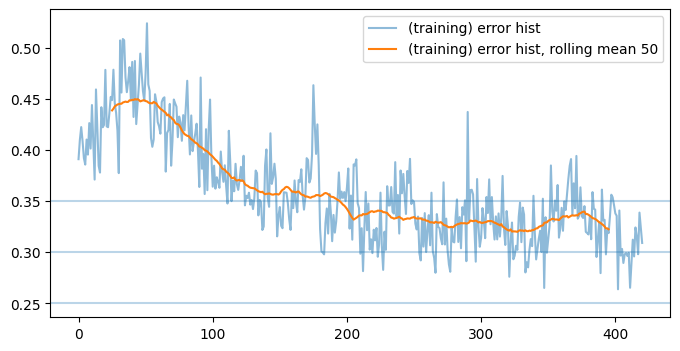

batches:  tensor(431, dtype=torch.int32)
batches:  tensor(432, dtype=torch.int32)
batches:  tensor(433, dtype=torch.int32)
batches:  tensor(434, dtype=torch.int32)
batches:  tensor(435, dtype=torch.int32)
batches:  tensor(436, dtype=torch.int32)
batches:  tensor(437, dtype=torch.int32)
batches:  tensor(438, dtype=torch.int32)
batches:  tensor(439, dtype=torch.int32)
batches:  tensor(440, dtype=torch.int32)


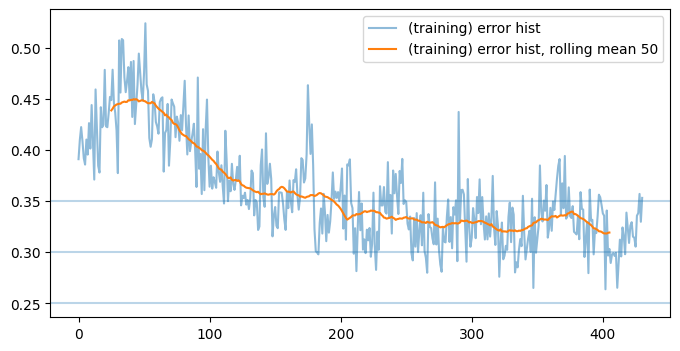

batches:  tensor(441, dtype=torch.int32)
batches:  tensor(442, dtype=torch.int32)
batches:  tensor(443, dtype=torch.int32)
batches:  tensor(444, dtype=torch.int32)
batches:  tensor(445, dtype=torch.int32)
batches:  tensor(446, dtype=torch.int32)
batches:  tensor(447, dtype=torch.int32)
batches:  tensor(448, dtype=torch.int32)
batches:  tensor(449, dtype=torch.int32)
batches:  tensor(451, dtype=torch.int32)
batches:  tensor(452, dtype=torch.int32)
batches:  tensor(453, dtype=torch.int32)
batches:  tensor(454, dtype=torch.int32)
batches:  tensor(456, dtype=torch.int32)
batches:  tensor(457, dtype=torch.int32)
batches:  tensor(458, dtype=torch.int32)
batches:  tensor(459, dtype=torch.int32)
batches:  tensor(461, dtype=torch.int32)
batches:  tensor(462, dtype=torch.int32)
batches:  tensor(463, dtype=torch.int32)
batches:  tensor(464, dtype=torch.int32)
batches:  tensor(466, dtype=torch.int32)
batches:  tensor(467, dtype=torch.int32)
batches:  tensor(468, dtype=torch.int32)
batches:  tensor

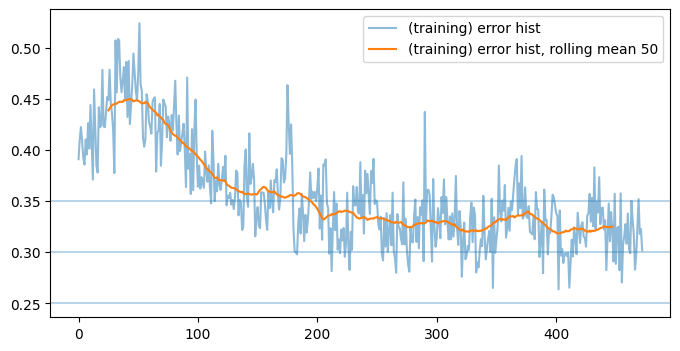

batches:  tensor(491, dtype=torch.int32)
batches:  tensor(492, dtype=torch.int32)
batches:  tensor(493, dtype=torch.int32)
batches:  tensor(494, dtype=torch.int32)
batches:  tensor(496, dtype=torch.int32)
batches:  tensor(497, dtype=torch.int32)
batches:  tensor(498, dtype=torch.int32)
batches:  tensor(499, dtype=torch.int32)
batches:  tensor(500, dtype=torch.int32)


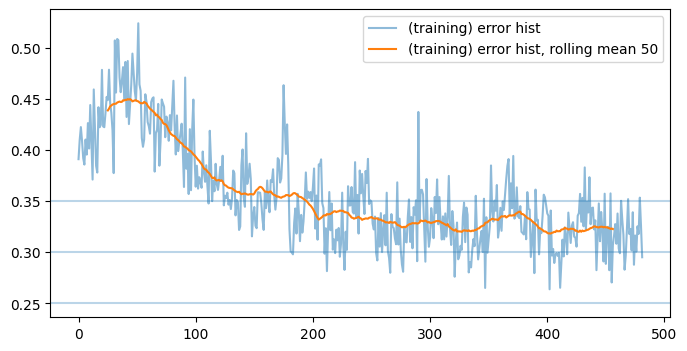

batches:  tensor(501, dtype=torch.int32)
batches:  tensor(502, dtype=torch.int32)
batches:  tensor(503, dtype=torch.int32)
batches:  tensor(504, dtype=torch.int32)
batches:  tensor(505, dtype=torch.int32)
batches:  tensor(506, dtype=torch.int32)
batches:  tensor(507, dtype=torch.int32)
batches:  tensor(508, dtype=torch.int32)
batches:  tensor(509, dtype=torch.int32)
batches:  tensor(510, dtype=torch.int32)


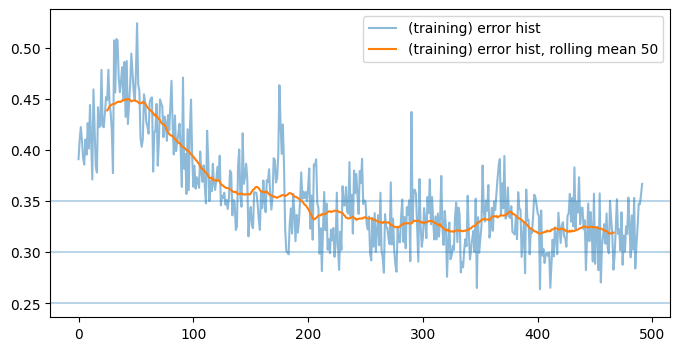

batches:  tensor(511, dtype=torch.int32)
batches:  tensor(512, dtype=torch.int32)
batches:  tensor(513, dtype=torch.int32)
batches:  tensor(514, dtype=torch.int32)
batches:  tensor(515, dtype=torch.int32)
batches:  tensor(516, dtype=torch.int32)
batches:  tensor(517, dtype=torch.int32)
batches:  tensor(518, dtype=torch.int32)
batches:  tensor(519, dtype=torch.int32)
batches:  tensor(520, dtype=torch.int32)


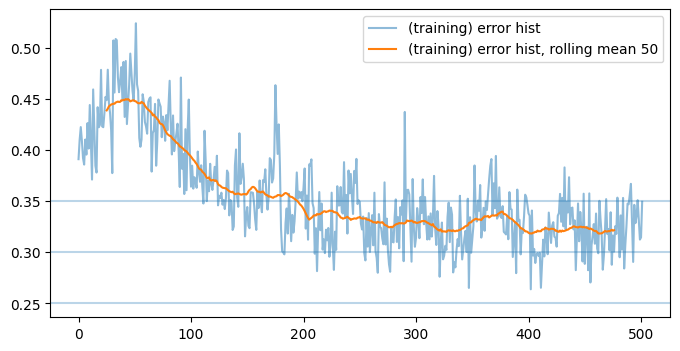

batches:  tensor(521, dtype=torch.int32)
batches:  tensor(522, dtype=torch.int32)
batches:  tensor(523, dtype=torch.int32)
batches:  tensor(524, dtype=torch.int32)
batches:  tensor(525, dtype=torch.int32)
batches:  tensor(526, dtype=torch.int32)
batches:  tensor(527, dtype=torch.int32)
batches:  tensor(528, dtype=torch.int32)
batches:  tensor(529, dtype=torch.int32)
batches:  tensor(530, dtype=torch.int32)


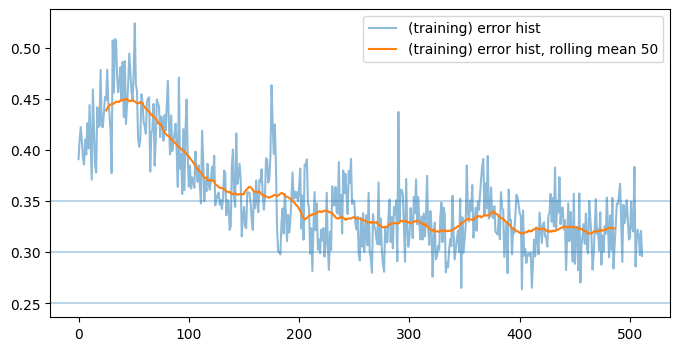

batches:  tensor(531, dtype=torch.int32)
batches:  tensor(532, dtype=torch.int32)
batches:  tensor(533, dtype=torch.int32)
batches:  tensor(534, dtype=torch.int32)
batches:  tensor(535, dtype=torch.int32)
batches:  tensor(536, dtype=torch.int32)
batches:  tensor(537, dtype=torch.int32)
batches:  tensor(538, dtype=torch.int32)
batches:  tensor(539, dtype=torch.int32)
batches:  tensor(540, dtype=torch.int32)


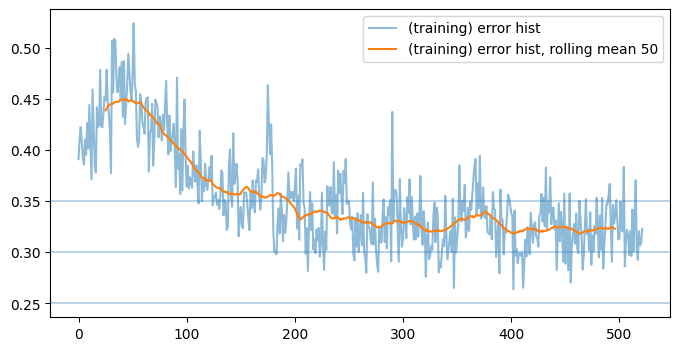

batches:  tensor(541, dtype=torch.int32)
batches:  tensor(542, dtype=torch.int32)
batches:  tensor(543, dtype=torch.int32)
batches:  tensor(544, dtype=torch.int32)
batches:  tensor(545, dtype=torch.int32)
batches:  tensor(546, dtype=torch.int32)
batches:  tensor(547, dtype=torch.int32)
batches:  tensor(548, dtype=torch.int32)
batches:  tensor(549, dtype=torch.int32)
batches:  tensor(550, dtype=torch.int32)


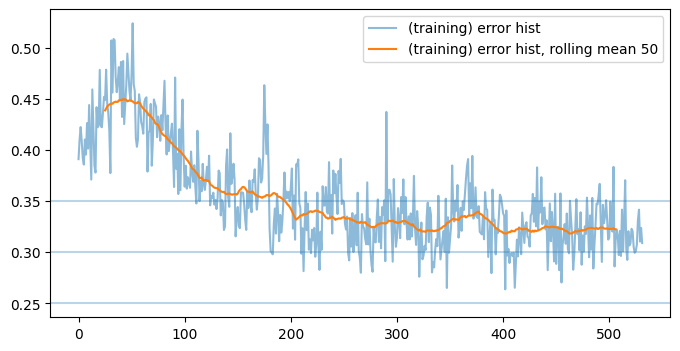

batches:  tensor(551, dtype=torch.int32)
batches:  tensor(552, dtype=torch.int32)
batches:  tensor(553, dtype=torch.int32)
batches:  tensor(554, dtype=torch.int32)
batches:  tensor(555, dtype=torch.int32)
batches:  tensor(556, dtype=torch.int32)
batches:  tensor(557, dtype=torch.int32)
batches:  tensor(558, dtype=torch.int32)
batches:  tensor(559, dtype=torch.int32)
batches:  tensor(560, dtype=torch.int32)


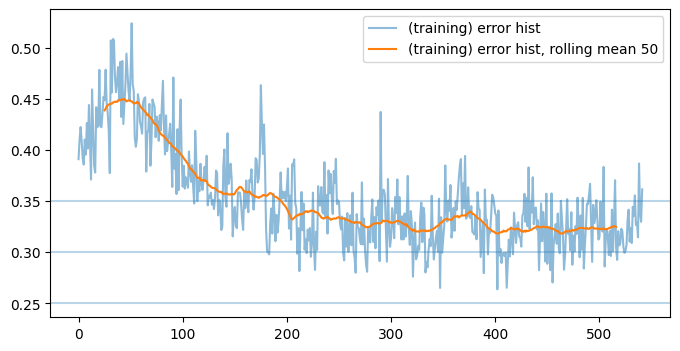

batches:  tensor(561, dtype=torch.int32)
batches:  tensor(562, dtype=torch.int32)
batches:  tensor(563, dtype=torch.int32)
batches:  tensor(564, dtype=torch.int32)
batches:  tensor(565, dtype=torch.int32)
batches:  tensor(566, dtype=torch.int32)
batches:  tensor(567, dtype=torch.int32)
batches:  tensor(568, dtype=torch.int32)
batches:  tensor(569, dtype=torch.int32)
batches:  tensor(570, dtype=torch.int32)


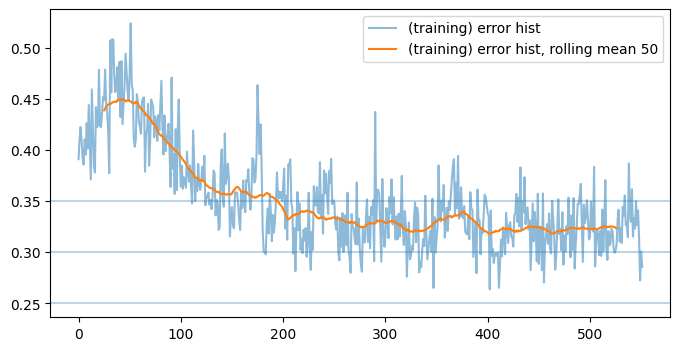

batches:  tensor(571, dtype=torch.int32)
batches:  tensor(572, dtype=torch.int32)
batches:  tensor(573, dtype=torch.int32)
batches:  tensor(574, dtype=torch.int32)
batches:  tensor(575, dtype=torch.int32)
batches:  tensor(576, dtype=torch.int32)
batches:  tensor(577, dtype=torch.int32)
batches:  tensor(578, dtype=torch.int32)
batches:  tensor(579, dtype=torch.int32)
batches:  tensor(580, dtype=torch.int32)


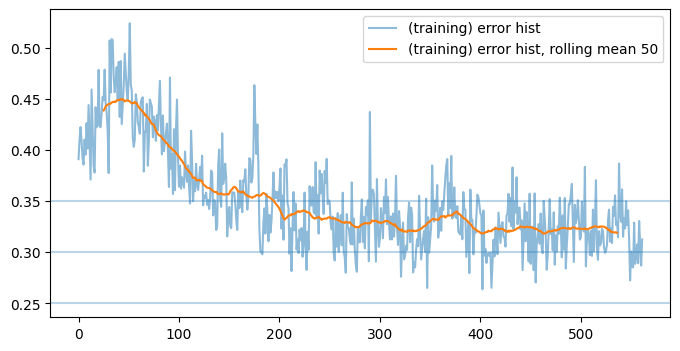

batches:  tensor(581, dtype=torch.int32)
batches:  tensor(582, dtype=torch.int32)
batches:  tensor(583, dtype=torch.int32)
batches:  tensor(584, dtype=torch.int32)
batches:  tensor(585, dtype=torch.int32)
batches:  tensor(586, dtype=torch.int32)
batches:  tensor(587, dtype=torch.int32)
batches:  tensor(588, dtype=torch.int32)
batches:  tensor(589, dtype=torch.int32)
batches:  tensor(590, dtype=torch.int32)


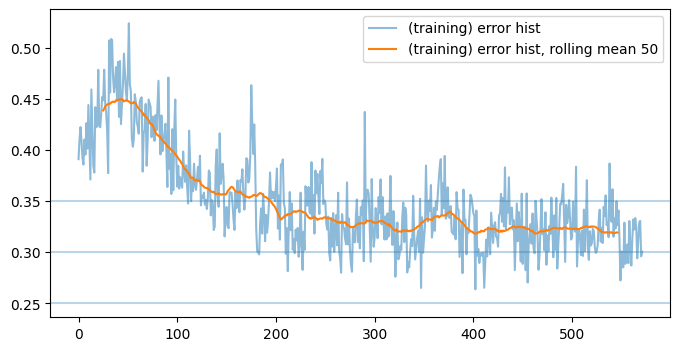

batches:  tensor(591, dtype=torch.int32)
batches:  tensor(592, dtype=torch.int32)
batches:  tensor(593, dtype=torch.int32)
batches:  tensor(594, dtype=torch.int32)
batches:  tensor(595, dtype=torch.int32)
batches:  tensor(596, dtype=torch.int32)
batches:  tensor(597, dtype=torch.int32)
batches:  tensor(598, dtype=torch.int32)
batches:  tensor(599, dtype=torch.int32)
batches:  tensor(600, dtype=torch.int32)


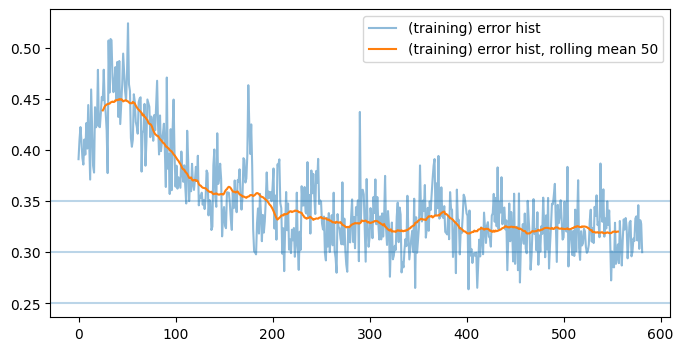

batches:  tensor(601, dtype=torch.int32)
batches:  tensor(602, dtype=torch.int32)
batches:  tensor(603, dtype=torch.int32)
batches:  tensor(604, dtype=torch.int32)
batches:  tensor(605, dtype=torch.int32)
batches:  tensor(606, dtype=torch.int32)
batches:  tensor(607, dtype=torch.int32)
batches:  tensor(608, dtype=torch.int32)
batches:  tensor(609, dtype=torch.int32)
batches:  tensor(610, dtype=torch.int32)


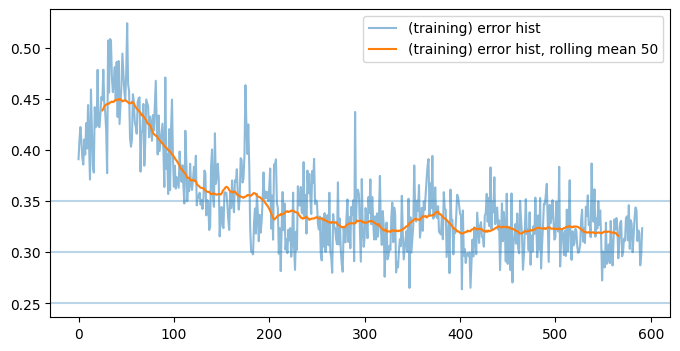

batches:  tensor(611, dtype=torch.int32)
batches:  tensor(612, dtype=torch.int32)
batches:  tensor(613, dtype=torch.int32)
batches:  tensor(614, dtype=torch.int32)
batches:  tensor(615, dtype=torch.int32)
batches:  tensor(616, dtype=torch.int32)
batches:  tensor(617, dtype=torch.int32)
batches:  tensor(618, dtype=torch.int32)
batches:  tensor(619, dtype=torch.int32)
batches:  tensor(620, dtype=torch.int32)


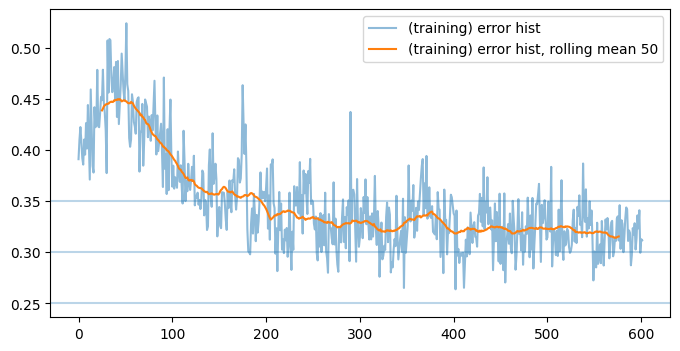

batches:  tensor(621, dtype=torch.int32)
batches:  tensor(622, dtype=torch.int32)
batches:  tensor(623, dtype=torch.int32)
batches:  tensor(624, dtype=torch.int32)
batches:  tensor(625, dtype=torch.int32)
batches:  tensor(626, dtype=torch.int32)
batches:  tensor(627, dtype=torch.int32)
batches:  tensor(628, dtype=torch.int32)
batches:  tensor(629, dtype=torch.int32)
batches:  tensor(630, dtype=torch.int32)


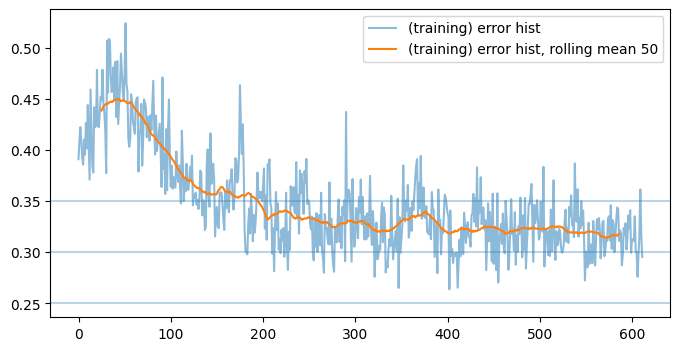

batches:  tensor(631, dtype=torch.int32)
batches:  tensor(632, dtype=torch.int32)
batches:  tensor(633, dtype=torch.int32)
batches:  tensor(634, dtype=torch.int32)
batches:  tensor(635, dtype=torch.int32)
batches:  tensor(636, dtype=torch.int32)
batches:  tensor(637, dtype=torch.int32)
batches:  tensor(638, dtype=torch.int32)
batches:  tensor(639, dtype=torch.int32)
batches:  tensor(640, dtype=torch.int32)


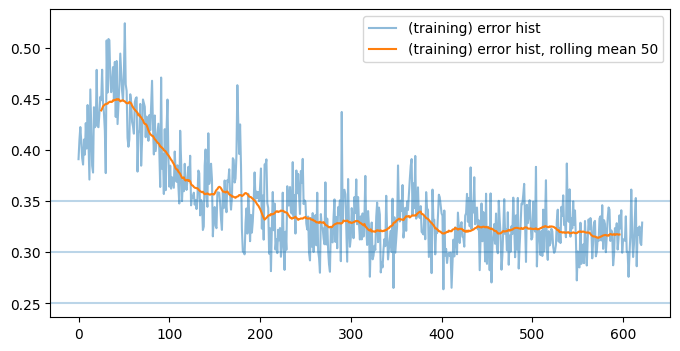

batches:  tensor(641, dtype=torch.int32)
batches:  tensor(642, dtype=torch.int32)
batches:  tensor(643, dtype=torch.int32)
batches:  tensor(644, dtype=torch.int32)
batches:  tensor(645, dtype=torch.int32)
batches:  tensor(646, dtype=torch.int32)
batches:  tensor(647, dtype=torch.int32)
batches:  tensor(648, dtype=torch.int32)
batches:  tensor(649, dtype=torch.int32)
batches:  tensor(650, dtype=torch.int32)


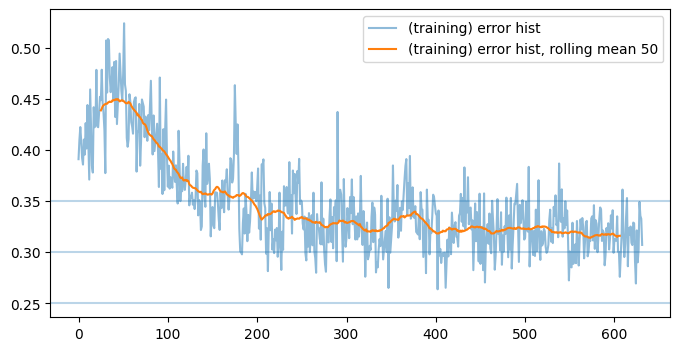

batches:  tensor(651, dtype=torch.int32)
batches:  tensor(652, dtype=torch.int32)
batches:  tensor(653, dtype=torch.int32)
batches:  tensor(654, dtype=torch.int32)
batches:  tensor(655, dtype=torch.int32)
batches:  tensor(656, dtype=torch.int32)
batches:  tensor(657, dtype=torch.int32)
batches:  tensor(658, dtype=torch.int32)
batches:  tensor(659, dtype=torch.int32)
batches:  tensor(660, dtype=torch.int32)


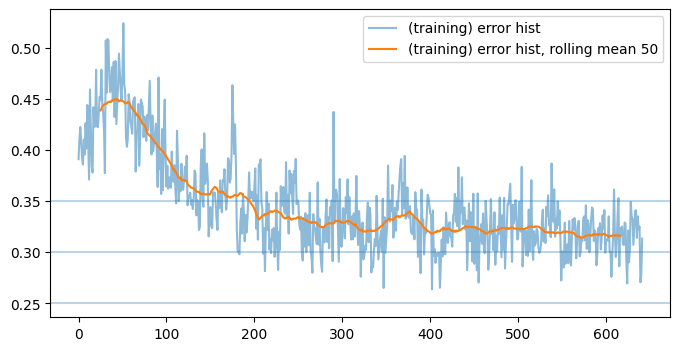

batches:  tensor(661, dtype=torch.int32)
batches:  tensor(662, dtype=torch.int32)
batches:  tensor(663, dtype=torch.int32)
batches:  tensor(664, dtype=torch.int32)
batches:  tensor(665, dtype=torch.int32)
batches:  tensor(666, dtype=torch.int32)
batches:  tensor(667, dtype=torch.int32)
batches:  tensor(668, dtype=torch.int32)
batches:  tensor(669, dtype=torch.int32)
batches:  tensor(670, dtype=torch.int32)


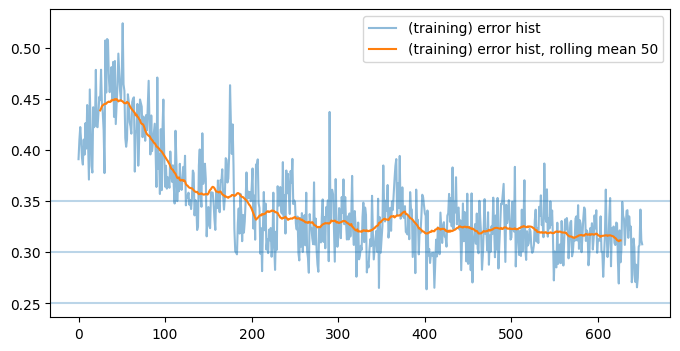

batches:  tensor(671, dtype=torch.int32)
batches:  tensor(672, dtype=torch.int32)
batches:  tensor(673, dtype=torch.int32)
batches:  tensor(674, dtype=torch.int32)
batches:  tensor(675, dtype=torch.int32)
batches:  tensor(676, dtype=torch.int32)
batches:  tensor(677, dtype=torch.int32)
batches:  tensor(678, dtype=torch.int32)
batches:  tensor(679, dtype=torch.int32)
batches:  tensor(680, dtype=torch.int32)


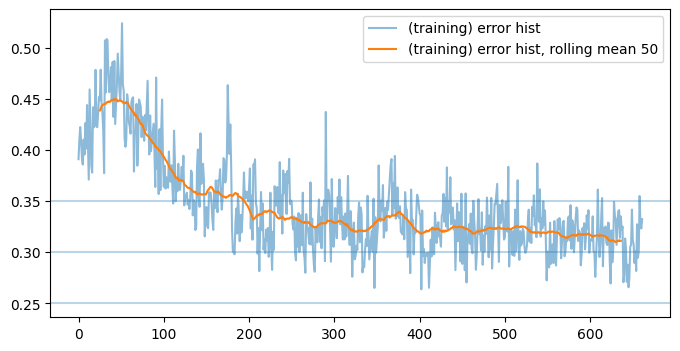

batches:  tensor(681, dtype=torch.int32)
batches:  tensor(682, dtype=torch.int32)
batches:  tensor(683, dtype=torch.int32)
batches:  tensor(684, dtype=torch.int32)
batches:  tensor(685, dtype=torch.int32)
batches:  tensor(686, dtype=torch.int32)
batches:  tensor(687, dtype=torch.int32)
batches:  tensor(688, dtype=torch.int32)
batches:  tensor(689, dtype=torch.int32)
batches:  tensor(690, dtype=torch.int32)


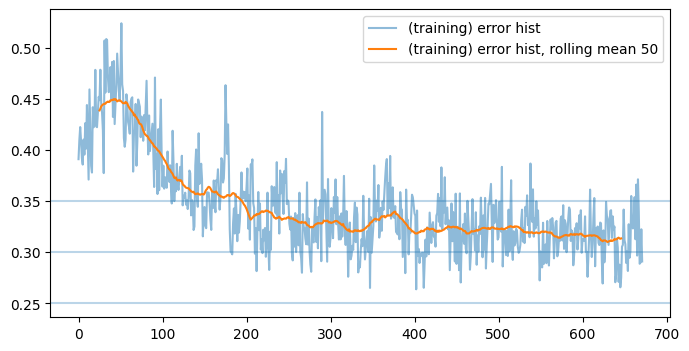

batches:  tensor(691, dtype=torch.int32)
batches:  tensor(692, dtype=torch.int32)
batches:  tensor(693, dtype=torch.int32)
batches:  tensor(694, dtype=torch.int32)
batches:  tensor(695, dtype=torch.int32)
batches:  tensor(696, dtype=torch.int32)
batches:  tensor(697, dtype=torch.int32)
batches:  tensor(698, dtype=torch.int32)
batches:  tensor(699, dtype=torch.int32)
batches:  tensor(700, dtype=torch.int32)


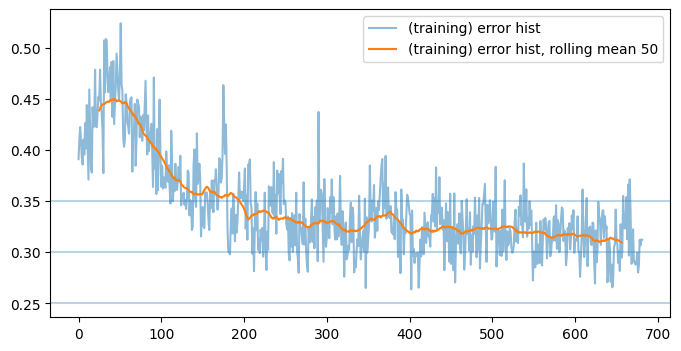

batches:  tensor(701, dtype=torch.int32)
batches:  tensor(702, dtype=torch.int32)
batches:  tensor(703, dtype=torch.int32)
batches:  tensor(704, dtype=torch.int32)
batches:  tensor(705, dtype=torch.int32)
batches:  tensor(706, dtype=torch.int32)
batches:  tensor(707, dtype=torch.int32)
batches:  tensor(708, dtype=torch.int32)
batches:  tensor(709, dtype=torch.int32)
batches:  tensor(710, dtype=torch.int32)


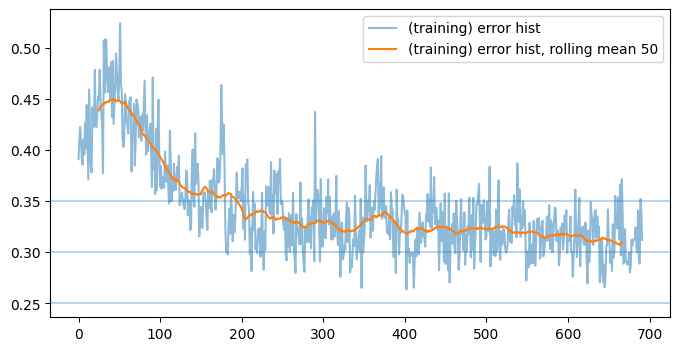

batches:  tensor(711, dtype=torch.int32)
batches:  tensor(712, dtype=torch.int32)
batches:  tensor(713, dtype=torch.int32)
batches:  tensor(714, dtype=torch.int32)
batches:  tensor(715, dtype=torch.int32)
batches:  tensor(716, dtype=torch.int32)
batches:  tensor(717, dtype=torch.int32)
batches:  tensor(718, dtype=torch.int32)
batches:  tensor(719, dtype=torch.int32)
batches:  tensor(720, dtype=torch.int32)


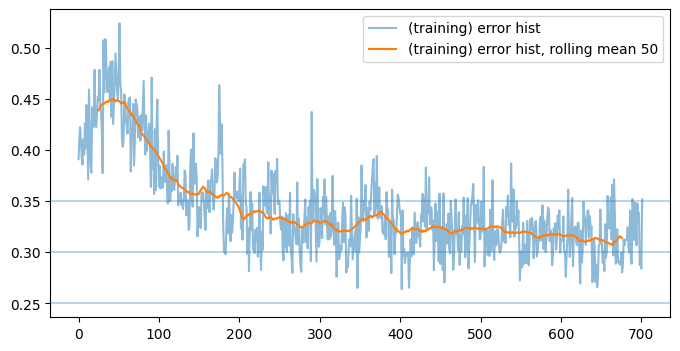

batches:  tensor(721, dtype=torch.int32)
batches:  tensor(722, dtype=torch.int32)
batches:  tensor(723, dtype=torch.int32)
batches:  tensor(724, dtype=torch.int32)
batches:  tensor(725, dtype=torch.int32)
batches:  tensor(726, dtype=torch.int32)
batches:  tensor(727, dtype=torch.int32)
batches:  tensor(728, dtype=torch.int32)
batches:  tensor(729, dtype=torch.int32)
batches:  tensor(730, dtype=torch.int32)


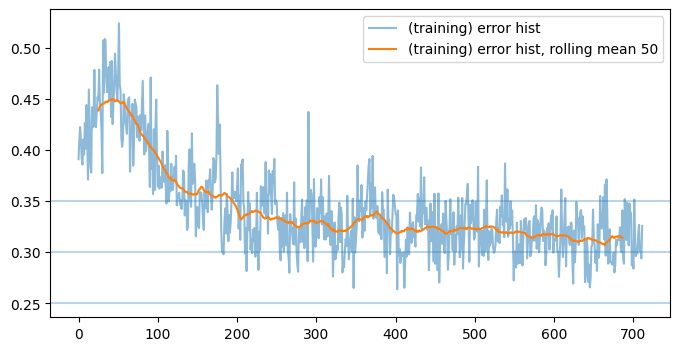

batches:  tensor(731, dtype=torch.int32)
batches:  tensor(732, dtype=torch.int32)
batches:  tensor(733, dtype=torch.int32)
batches:  tensor(734, dtype=torch.int32)
batches:  tensor(735, dtype=torch.int32)
batches:  tensor(736, dtype=torch.int32)
batches:  tensor(737, dtype=torch.int32)
batches:  tensor(738, dtype=torch.int32)
batches:  tensor(739, dtype=torch.int32)
batches:  tensor(740, dtype=torch.int32)


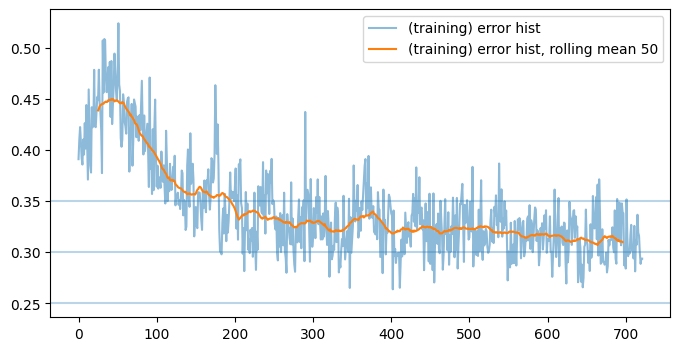

batches:  tensor(741, dtype=torch.int32)
batches:  tensor(742, dtype=torch.int32)
batches:  tensor(743, dtype=torch.int32)
batches:  tensor(744, dtype=torch.int32)
batches:  tensor(745, dtype=torch.int32)
batches:  tensor(746, dtype=torch.int32)
batches:  tensor(747, dtype=torch.int32)
batches:  tensor(748, dtype=torch.int32)
batches:  tensor(749, dtype=torch.int32)
batches:  tensor(750, dtype=torch.int32)


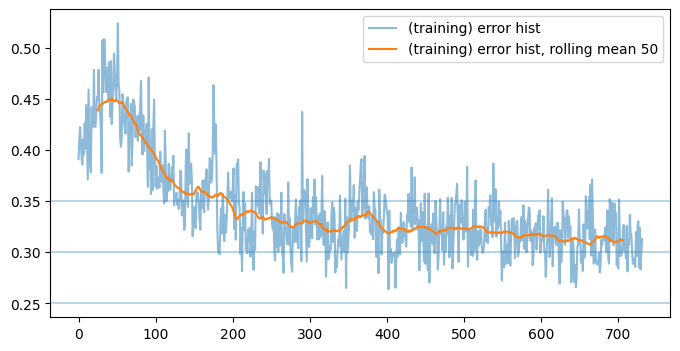

batches:  tensor(751, dtype=torch.int32)
batches:  tensor(752, dtype=torch.int32)
batches:  tensor(753, dtype=torch.int32)
batches:  tensor(754, dtype=torch.int32)
batches:  tensor(755, dtype=torch.int32)
batches:  tensor(756, dtype=torch.int32)
batches:  tensor(757, dtype=torch.int32)
batches:  tensor(758, dtype=torch.int32)
batches:  tensor(759, dtype=torch.int32)
batches:  tensor(760, dtype=torch.int32)


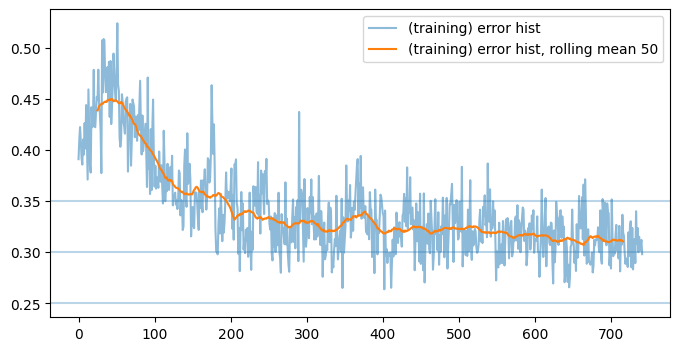

batches:  tensor(761, dtype=torch.int32)
batches:  tensor(762, dtype=torch.int32)
batches:  tensor(763, dtype=torch.int32)
batches:  tensor(764, dtype=torch.int32)
batches:  tensor(765, dtype=torch.int32)
batches:  tensor(766, dtype=torch.int32)
batches:  tensor(767, dtype=torch.int32)
batches:  tensor(768, dtype=torch.int32)
batches:  tensor(769, dtype=torch.int32)
batches:  tensor(770, dtype=torch.int32)


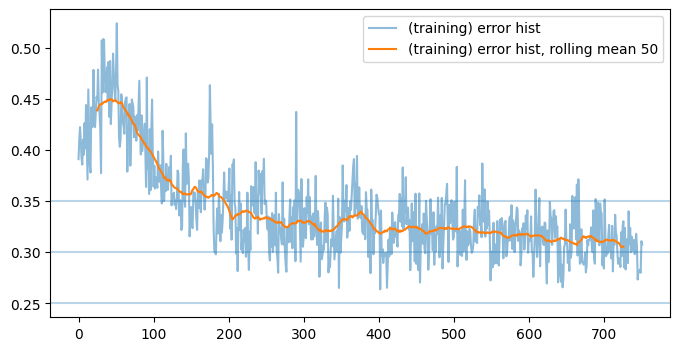

batches:  tensor(771, dtype=torch.int32)
batches:  tensor(772, dtype=torch.int32)
batches:  tensor(773, dtype=torch.int32)
batches:  tensor(774, dtype=torch.int32)
batches:  tensor(775, dtype=torch.int32)
batches:  tensor(776, dtype=torch.int32)
batches:  tensor(777, dtype=torch.int32)
batches:  tensor(778, dtype=torch.int32)
batches:  tensor(779, dtype=torch.int32)
batches:  tensor(780, dtype=torch.int32)


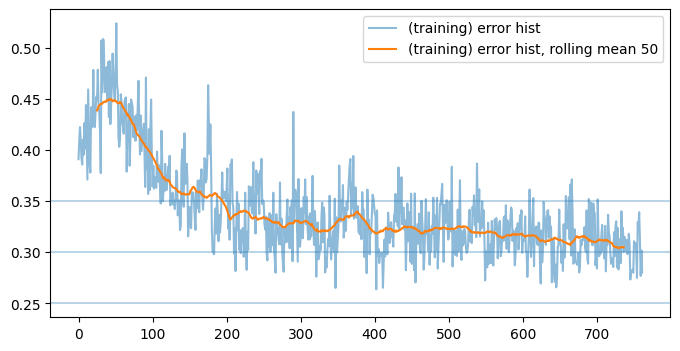

batches:  tensor(781, dtype=torch.int32)
batches:  tensor(782, dtype=torch.int32)
batches:  tensor(783, dtype=torch.int32)
batches:  tensor(784, dtype=torch.int32)
batches:  tensor(785, dtype=torch.int32)
batches:  tensor(786, dtype=torch.int32)
batches:  tensor(787, dtype=torch.int32)
batches:  tensor(788, dtype=torch.int32)
batches:  tensor(789, dtype=torch.int32)
batches:  tensor(790, dtype=torch.int32)


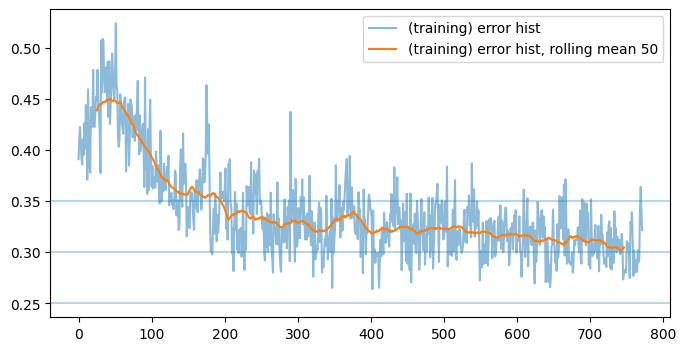

batches:  tensor(791, dtype=torch.int32)
batches:  tensor(792, dtype=torch.int32)
batches:  tensor(793, dtype=torch.int32)
batches:  tensor(794, dtype=torch.int32)
batches:  tensor(795, dtype=torch.int32)
batches:  tensor(796, dtype=torch.int32)
batches:  tensor(797, dtype=torch.int32)
batches:  tensor(798, dtype=torch.int32)
batches:  tensor(799, dtype=torch.int32)
batches:  tensor(800, dtype=torch.int32)


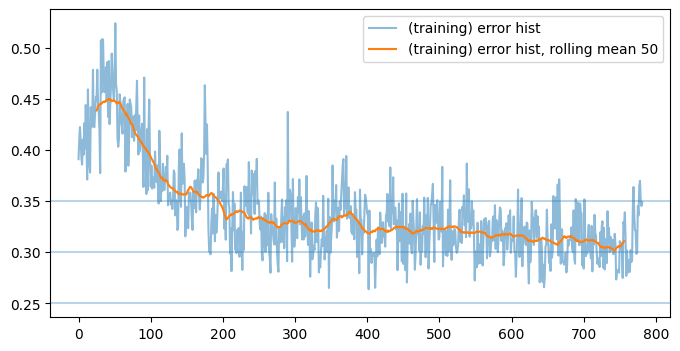

batches:  tensor(801, dtype=torch.int32)
batches:  tensor(802, dtype=torch.int32)
batches:  tensor(803, dtype=torch.int32)
batches:  tensor(804, dtype=torch.int32)
batches:  tensor(805, dtype=torch.int32)
batches:  tensor(806, dtype=torch.int32)
batches:  tensor(807, dtype=torch.int32)
batches:  tensor(808, dtype=torch.int32)
batches:  tensor(809, dtype=torch.int32)
batches:  tensor(810, dtype=torch.int32)


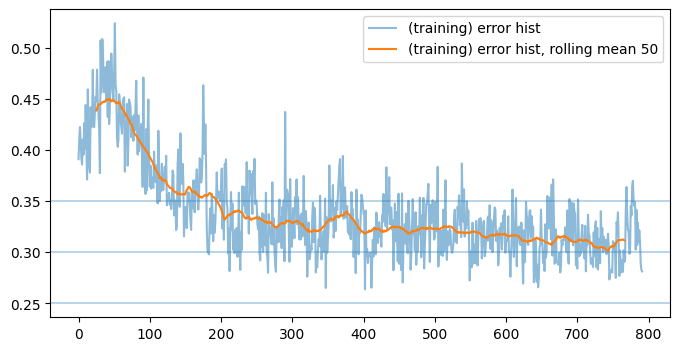

batches:  tensor(811, dtype=torch.int32)
batches:  tensor(812, dtype=torch.int32)
batches:  tensor(813, dtype=torch.int32)
batches:  tensor(814, dtype=torch.int32)
batches:  tensor(815, dtype=torch.int32)
batches:  tensor(816, dtype=torch.int32)
batches:  tensor(817, dtype=torch.int32)
batches:  tensor(818, dtype=torch.int32)
batches:  tensor(819, dtype=torch.int32)
batches:  tensor(820, dtype=torch.int32)


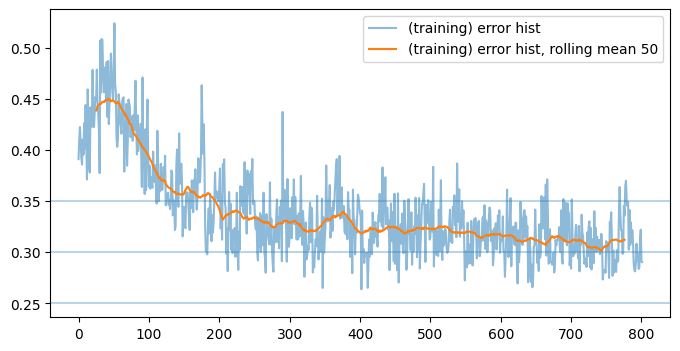

batches:  tensor(821, dtype=torch.int32)
batches:  tensor(822, dtype=torch.int32)
batches:  tensor(823, dtype=torch.int32)
batches:  tensor(824, dtype=torch.int32)
batches:  tensor(825, dtype=torch.int32)
batches:  tensor(826, dtype=torch.int32)
batches:  tensor(827, dtype=torch.int32)
batches:  tensor(828, dtype=torch.int32)
batches:  tensor(829, dtype=torch.int32)
batches:  tensor(830, dtype=torch.int32)


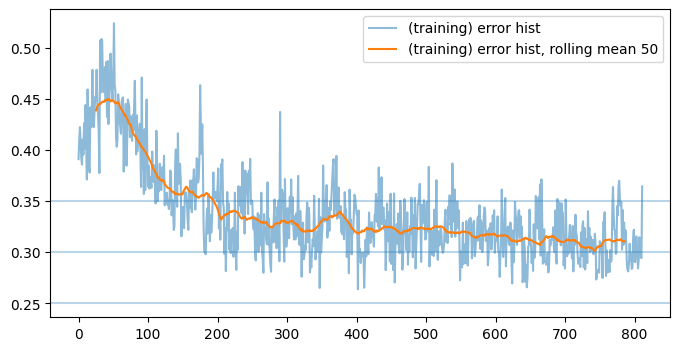

batches:  tensor(831, dtype=torch.int32)
batches:  tensor(832, dtype=torch.int32)
batches:  tensor(833, dtype=torch.int32)
batches:  tensor(834, dtype=torch.int32)
batches:  tensor(835, dtype=torch.int32)
batches:  tensor(836, dtype=torch.int32)
batches:  tensor(837, dtype=torch.int32)
batches:  tensor(838, dtype=torch.int32)
batches:  tensor(839, dtype=torch.int32)
batches:  tensor(840, dtype=torch.int32)


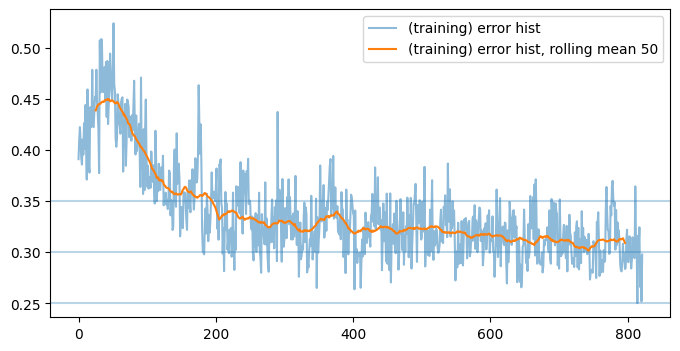

batches:  tensor(841, dtype=torch.int32)
batches:  tensor(842, dtype=torch.int32)
batches:  tensor(843, dtype=torch.int32)
batches:  tensor(844, dtype=torch.int32)
batches:  tensor(845, dtype=torch.int32)
batches:  tensor(846, dtype=torch.int32)
batches:  tensor(847, dtype=torch.int32)
batches:  tensor(848, dtype=torch.int32)
batches:  tensor(849, dtype=torch.int32)
batches:  tensor(850, dtype=torch.int32)


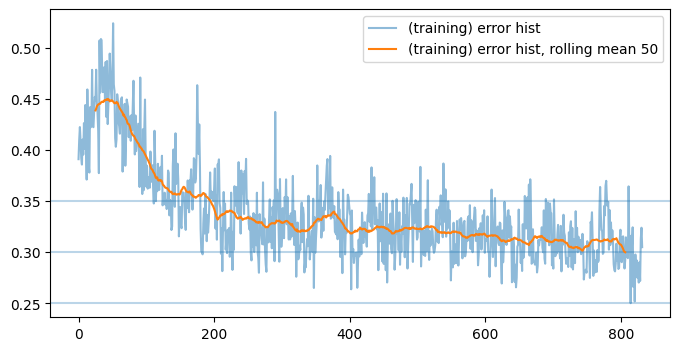

batches:  tensor(851, dtype=torch.int32)
batches:  tensor(852, dtype=torch.int32)
batches:  tensor(853, dtype=torch.int32)
batches:  tensor(854, dtype=torch.int32)
batches:  tensor(855, dtype=torch.int32)
batches:  tensor(856, dtype=torch.int32)
batches:  tensor(857, dtype=torch.int32)
batches:  tensor(858, dtype=torch.int32)
batches:  tensor(859, dtype=torch.int32)
batches:  tensor(860, dtype=torch.int32)


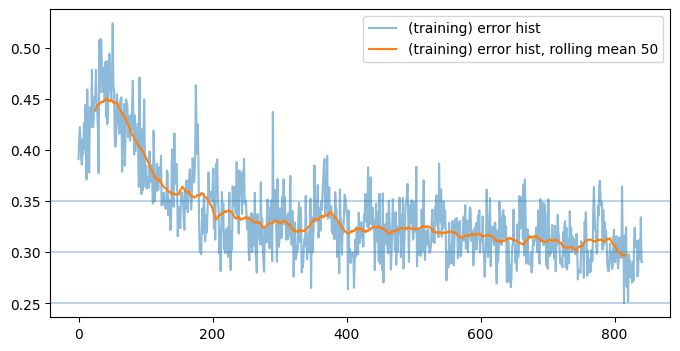

batches:  tensor(861, dtype=torch.int32)
batches:  tensor(862, dtype=torch.int32)
batches:  tensor(863, dtype=torch.int32)
batches:  tensor(864, dtype=torch.int32)
batches:  tensor(865, dtype=torch.int32)
batches:  tensor(866, dtype=torch.int32)
batches:  tensor(867, dtype=torch.int32)
batches:  tensor(868, dtype=torch.int32)
batches:  tensor(869, dtype=torch.int32)
batches:  tensor(870, dtype=torch.int32)


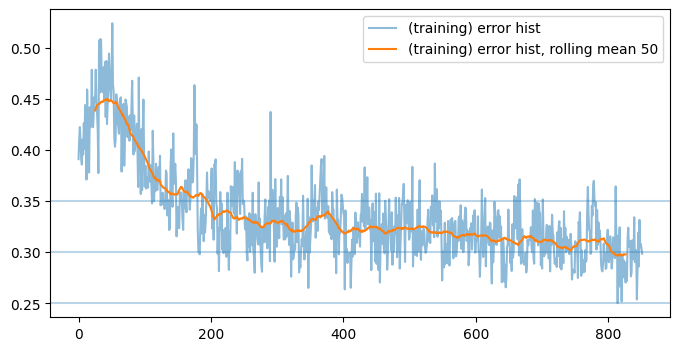

batches:  tensor(871, dtype=torch.int32)
batches:  tensor(872, dtype=torch.int32)
batches:  tensor(873, dtype=torch.int32)
batches:  tensor(874, dtype=torch.int32)
batches:  tensor(875, dtype=torch.int32)
batches:  tensor(876, dtype=torch.int32)
batches:  tensor(877, dtype=torch.int32)
batches:  tensor(878, dtype=torch.int32)
batches:  tensor(879, dtype=torch.int32)
batches:  tensor(880, dtype=torch.int32)


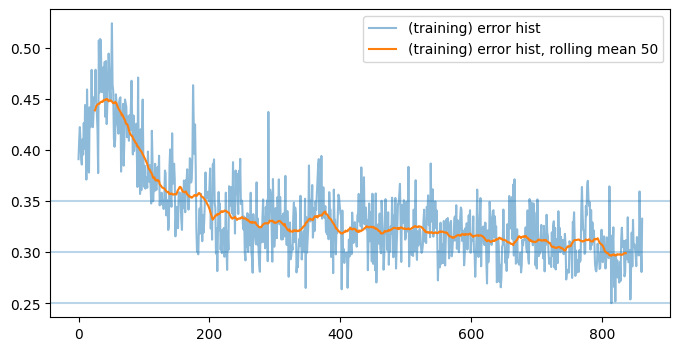

batches:  tensor(881, dtype=torch.int32)
batches:  tensor(882, dtype=torch.int32)
batches:  tensor(883, dtype=torch.int32)
batches:  tensor(884, dtype=torch.int32)
batches:  tensor(885, dtype=torch.int32)
batches:  tensor(886, dtype=torch.int32)
batches:  tensor(887, dtype=torch.int32)
batches:  tensor(888, dtype=torch.int32)
batches:  tensor(889, dtype=torch.int32)
batches:  tensor(890, dtype=torch.int32)


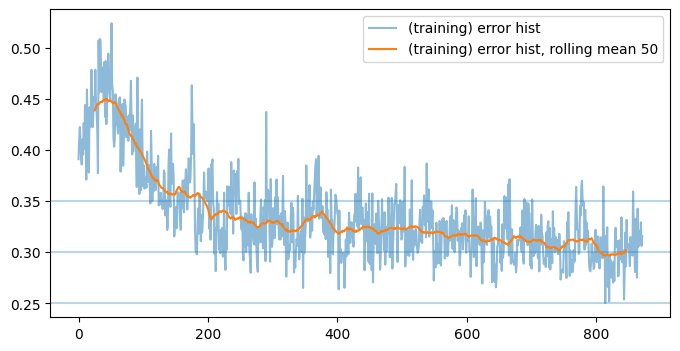

batches:  tensor(891, dtype=torch.int32)
batches:  tensor(892, dtype=torch.int32)
batches:  tensor(893, dtype=torch.int32)
batches:  tensor(894, dtype=torch.int32)
batches:  tensor(895, dtype=torch.int32)
batches:  tensor(896, dtype=torch.int32)
batches:  tensor(897, dtype=torch.int32)
batches:  tensor(898, dtype=torch.int32)
batches:  tensor(899, dtype=torch.int32)
batches:  tensor(900, dtype=torch.int32)


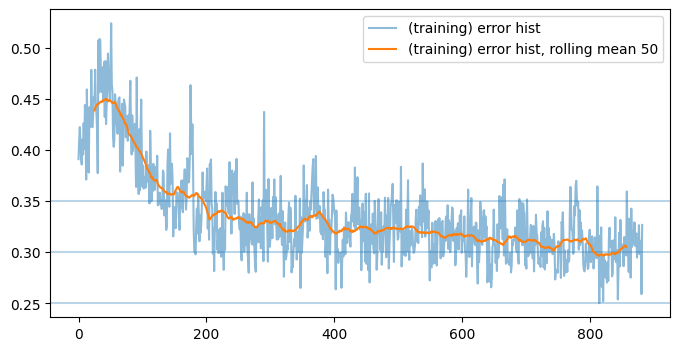

batches:  tensor(901, dtype=torch.int32)
batches:  tensor(902, dtype=torch.int32)
batches:  tensor(903, dtype=torch.int32)
batches:  tensor(904, dtype=torch.int32)
batches:  tensor(905, dtype=torch.int32)
batches:  tensor(906, dtype=torch.int32)
batches:  tensor(907, dtype=torch.int32)
batches:  tensor(908, dtype=torch.int32)
batches:  tensor(909, dtype=torch.int32)
batches:  tensor(910, dtype=torch.int32)


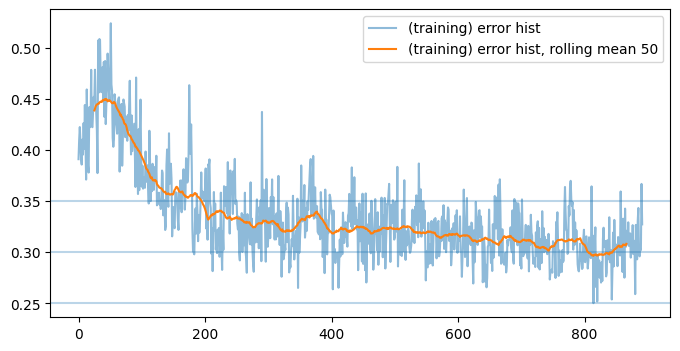

batches:  tensor(911, dtype=torch.int32)
batches:  tensor(912, dtype=torch.int32)
batches:  tensor(913, dtype=torch.int32)
batches:  tensor(914, dtype=torch.int32)
batches:  tensor(915, dtype=torch.int32)
batches:  tensor(916, dtype=torch.int32)
batches:  tensor(917, dtype=torch.int32)
batches:  tensor(918, dtype=torch.int32)
batches:  tensor(919, dtype=torch.int32)
batches:  tensor(920, dtype=torch.int32)


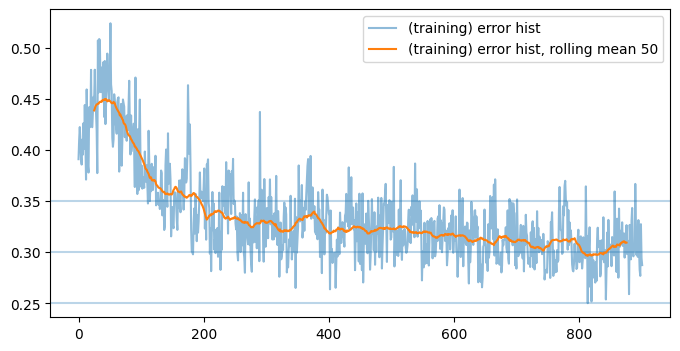

batches:  tensor(921, dtype=torch.int32)
batches:  tensor(922, dtype=torch.int32)
batches:  tensor(923, dtype=torch.int32)
batches:  tensor(924, dtype=torch.int32)
batches:  tensor(925, dtype=torch.int32)
batches:  tensor(926, dtype=torch.int32)
batches:  tensor(927, dtype=torch.int32)
batches:  tensor(928, dtype=torch.int32)
batches:  tensor(929, dtype=torch.int32)
batches:  tensor(930, dtype=torch.int32)


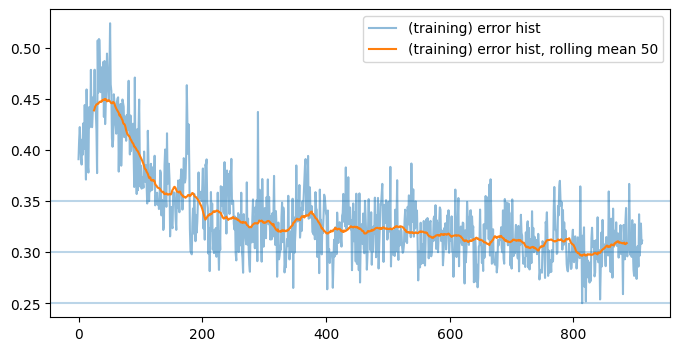

batches:  tensor(931, dtype=torch.int32)
batches:  tensor(932, dtype=torch.int32)
batches:  tensor(933, dtype=torch.int32)
batches:  tensor(934, dtype=torch.int32)
batches:  tensor(935, dtype=torch.int32)
batches:  tensor(936, dtype=torch.int32)
batches:  tensor(937, dtype=torch.int32)
batches:  tensor(938, dtype=torch.int32)
batches:  tensor(939, dtype=torch.int32)
batches:  tensor(940, dtype=torch.int32)


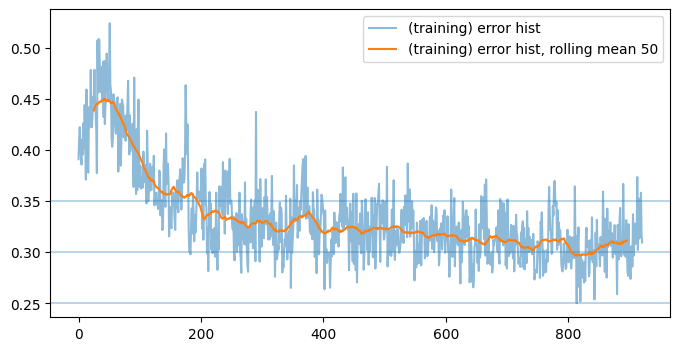

batches:  tensor(941, dtype=torch.int32)
batches:  tensor(942, dtype=torch.int32)
batches:  tensor(943, dtype=torch.int32)
batches:  tensor(944, dtype=torch.int32)
batches:  tensor(945, dtype=torch.int32)
batches:  tensor(946, dtype=torch.int32)
batches:  tensor(947, dtype=torch.int32)
batches:  tensor(948, dtype=torch.int32)
batches:  tensor(949, dtype=torch.int32)
batches:  tensor(950, dtype=torch.int32)


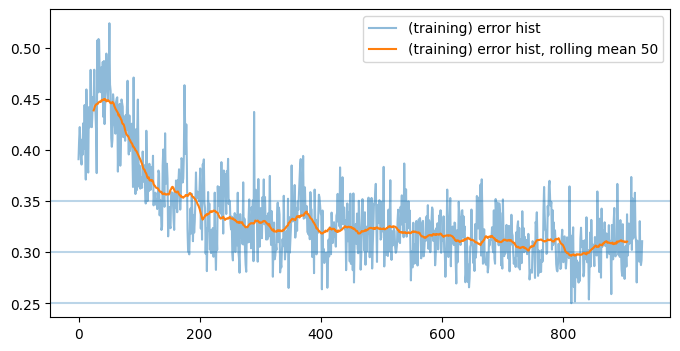

batches:  tensor(951, dtype=torch.int32)
batches:  tensor(952, dtype=torch.int32)
batches:  tensor(953, dtype=torch.int32)
batches:  tensor(954, dtype=torch.int32)
batches:  tensor(955, dtype=torch.int32)
batches:  tensor(956, dtype=torch.int32)
batches:  tensor(957, dtype=torch.int32)
batches:  tensor(958, dtype=torch.int32)
batches:  tensor(959, dtype=torch.int32)
batches:  tensor(960, dtype=torch.int32)


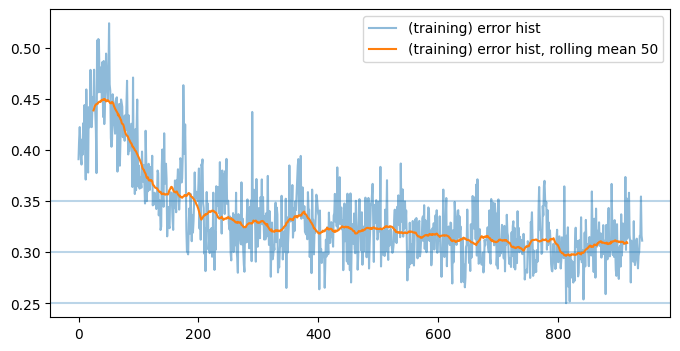

batches:  tensor(961, dtype=torch.int32)
batches:  tensor(962, dtype=torch.int32)
batches:  tensor(963, dtype=torch.int32)
batches:  tensor(964, dtype=torch.int32)
batches:  tensor(965, dtype=torch.int32)
batches:  tensor(966, dtype=torch.int32)
batches:  tensor(967, dtype=torch.int32)
batches:  tensor(968, dtype=torch.int32)
batches:  tensor(969, dtype=torch.int32)
batches:  tensor(970, dtype=torch.int32)


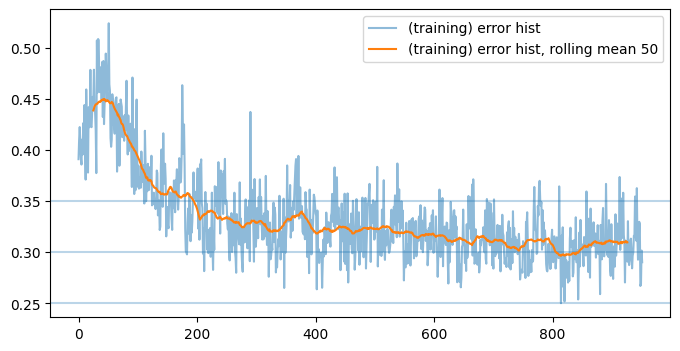

batches:  tensor(971, dtype=torch.int32)
batches:  tensor(972, dtype=torch.int32)
batches:  tensor(973, dtype=torch.int32)
batches:  tensor(974, dtype=torch.int32)
batches:  tensor(975, dtype=torch.int32)
batches:  tensor(976, dtype=torch.int32)
batches:  tensor(977, dtype=torch.int32)
batches:  tensor(978, dtype=torch.int32)
batches:  tensor(979, dtype=torch.int32)
batches:  tensor(980, dtype=torch.int32)


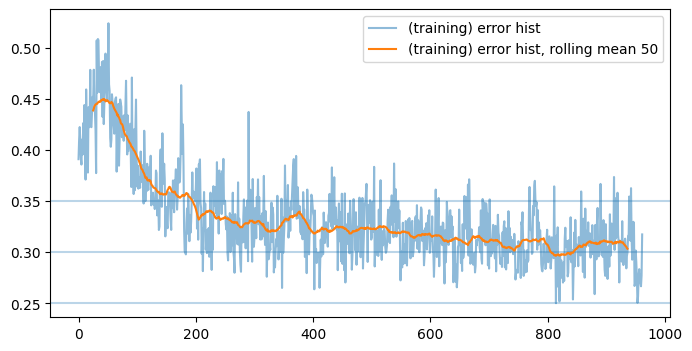

batches:  tensor(981, dtype=torch.int32)
batches:  tensor(982, dtype=torch.int32)
batches:  tensor(983, dtype=torch.int32)
batches:  tensor(984, dtype=torch.int32)
batches:  tensor(985, dtype=torch.int32)
batches:  tensor(986, dtype=torch.int32)
batches:  tensor(987, dtype=torch.int32)
batches:  tensor(988, dtype=torch.int32)
batches:  tensor(989, dtype=torch.int32)
batches:  tensor(990, dtype=torch.int32)


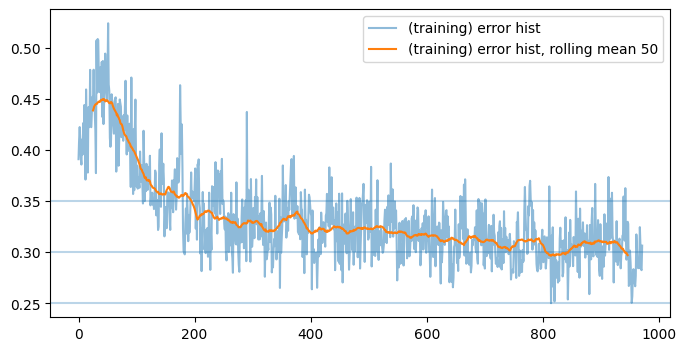

batches:  tensor(991, dtype=torch.int32)
batches:  tensor(992, dtype=torch.int32)
batches:  tensor(993, dtype=torch.int32)
batches:  tensor(994, dtype=torch.int32)
batches:  tensor(995, dtype=torch.int32)
batches:  tensor(996, dtype=torch.int32)
batches:  tensor(997, dtype=torch.int32)
batches:  tensor(998, dtype=torch.int32)
batches:  tensor(999, dtype=torch.int32)
batches:  tensor(1000, dtype=torch.int32)


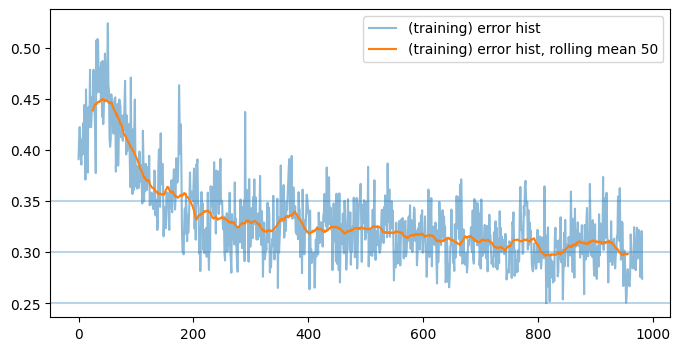

batches:  tensor(1001, dtype=torch.int32)
batches:  tensor(1002, dtype=torch.int32)
batches:  tensor(1003, dtype=torch.int32)
batches:  tensor(1004, dtype=torch.int32)
batches:  tensor(1005, dtype=torch.int32)
batches:  tensor(1006, dtype=torch.int32)
batches:  tensor(1007, dtype=torch.int32)
batches:  tensor(1008, dtype=torch.int32)
batches:  tensor(1009, dtype=torch.int32)
batches:  tensor(1010, dtype=torch.int32)


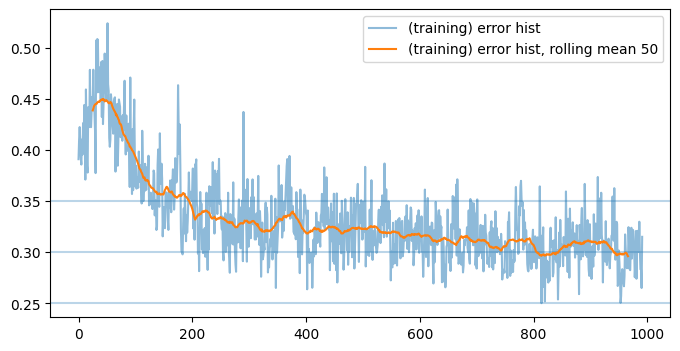

batches:  tensor(1011, dtype=torch.int32)
batches:  tensor(1012, dtype=torch.int32)
batches:  tensor(1013, dtype=torch.int32)
batches:  tensor(1014, dtype=torch.int32)
batches:  tensor(1015, dtype=torch.int32)
batches:  tensor(1016, dtype=torch.int32)
batches:  tensor(1017, dtype=torch.int32)
batches:  tensor(1018, dtype=torch.int32)
batches:  tensor(1019, dtype=torch.int32)
batches:  tensor(1020, dtype=torch.int32)


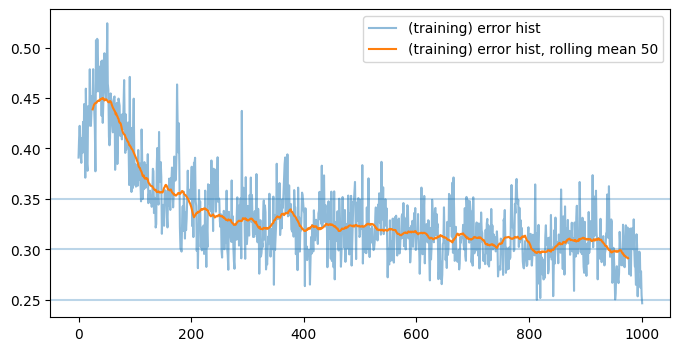

batches:  tensor(1021, dtype=torch.int32)
batches:  tensor(1022, dtype=torch.int32)
batches:  tensor(1023, dtype=torch.int32)
batches:  tensor(1024, dtype=torch.int32)
batches:  tensor(1025, dtype=torch.int32)
batches:  tensor(1026, dtype=torch.int32)
batches:  tensor(1027, dtype=torch.int32)
batches:  tensor(1028, dtype=torch.int32)
batches:  tensor(1029, dtype=torch.int32)
batches:  tensor(1030, dtype=torch.int32)


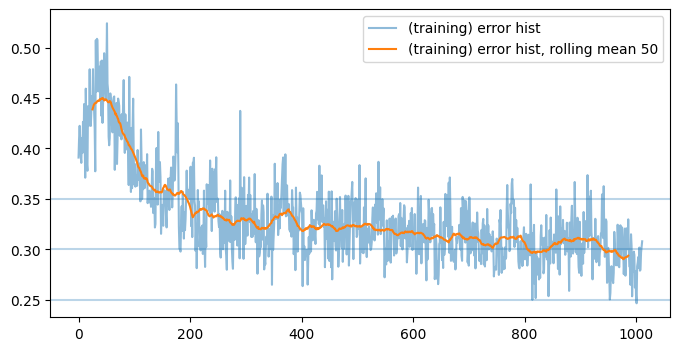

batches:  tensor(1031, dtype=torch.int32)
batches:  tensor(1032, dtype=torch.int32)
batches:  tensor(1033, dtype=torch.int32)
batches:  tensor(1034, dtype=torch.int32)
batches:  tensor(1035, dtype=torch.int32)
batches:  tensor(1036, dtype=torch.int32)
batches:  tensor(1037, dtype=torch.int32)
batches:  tensor(1038, dtype=torch.int32)
batches:  tensor(1039, dtype=torch.int32)
batches:  tensor(1040, dtype=torch.int32)


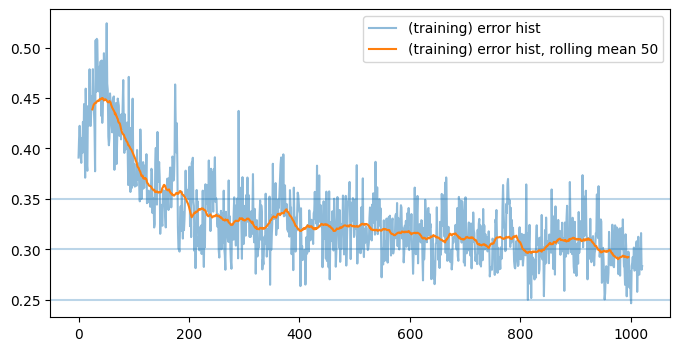

batches:  tensor(1041, dtype=torch.int32)
batches:  tensor(1042, dtype=torch.int32)
batches:  tensor(1043, dtype=torch.int32)
batches:  tensor(1044, dtype=torch.int32)
batches:  tensor(1045, dtype=torch.int32)
batches:  tensor(1046, dtype=torch.int32)
batches:  tensor(1047, dtype=torch.int32)
batches:  tensor(1048, dtype=torch.int32)
batches:  tensor(1049, dtype=torch.int32)
batches:  tensor(1050, dtype=torch.int32)


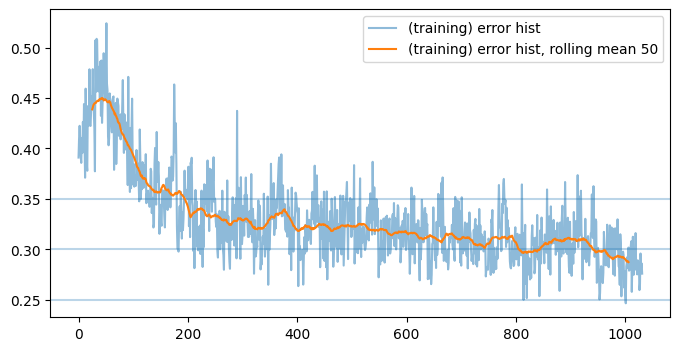

batches:  tensor(1051, dtype=torch.int32)
batches:  tensor(1053, dtype=torch.int32)
batches:  tensor(1054, dtype=torch.int32)
batches:  tensor(1055, dtype=torch.int32)
batches:  tensor(1056, dtype=torch.int32)
batches:  tensor(1058, dtype=torch.int32)
batches:  tensor(1059, dtype=torch.int32)
batches:  tensor(1060, dtype=torch.int32)


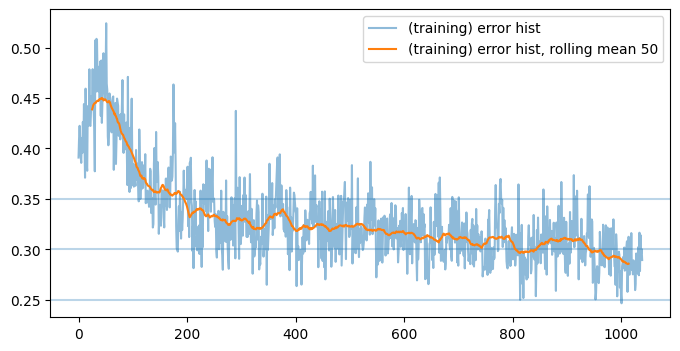

batches:  tensor(1061, dtype=torch.int32)
batches:  tensor(1063, dtype=torch.int32)
batches:  tensor(1064, dtype=torch.int32)
batches:  tensor(1065, dtype=torch.int32)
batches:  tensor(1066, dtype=torch.int32)
batches:  tensor(1067, dtype=torch.int32)
batches:  tensor(1068, dtype=torch.int32)
batches:  tensor(1069, dtype=torch.int32)
batches:  tensor(1070, dtype=torch.int32)


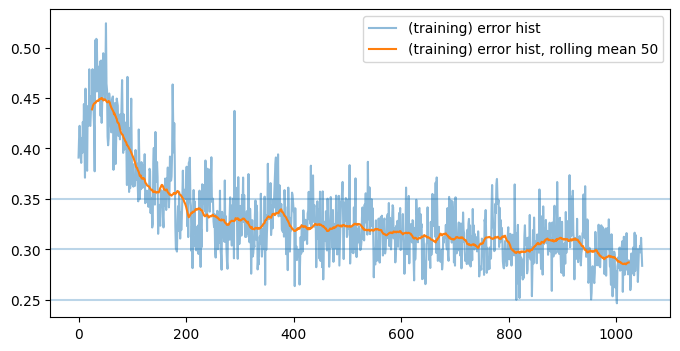

batches:  tensor(1071, dtype=torch.int32)
batches:  tensor(1072, dtype=torch.int32)
batches:  tensor(1073, dtype=torch.int32)
batches:  tensor(1074, dtype=torch.int32)
batches:  tensor(1075, dtype=torch.int32)
batches:  tensor(1076, dtype=torch.int32)
batches:  tensor(1077, dtype=torch.int32)
batches:  tensor(1078, dtype=torch.int32)
batches:  tensor(1079, dtype=torch.int32)
batches:  tensor(1080, dtype=torch.int32)


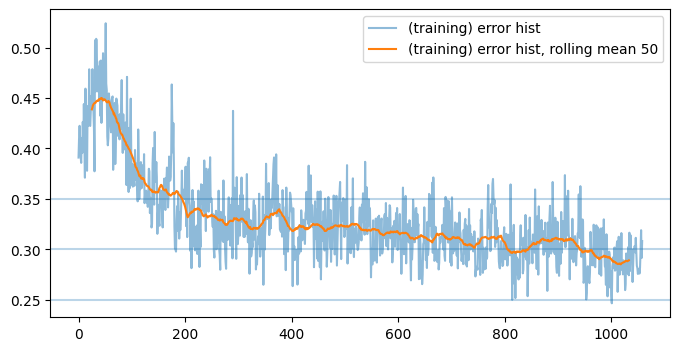

batches:  tensor(1081, dtype=torch.int32)
batches:  tensor(1082, dtype=torch.int32)
batches:  tensor(1083, dtype=torch.int32)
batches:  tensor(1084, dtype=torch.int32)
batches:  tensor(1085, dtype=torch.int32)
batches:  tensor(1086, dtype=torch.int32)
batches:  tensor(1087, dtype=torch.int32)
batches:  tensor(1088, dtype=torch.int32)
batches:  tensor(1089, dtype=torch.int32)
batches:  tensor(1090, dtype=torch.int32)


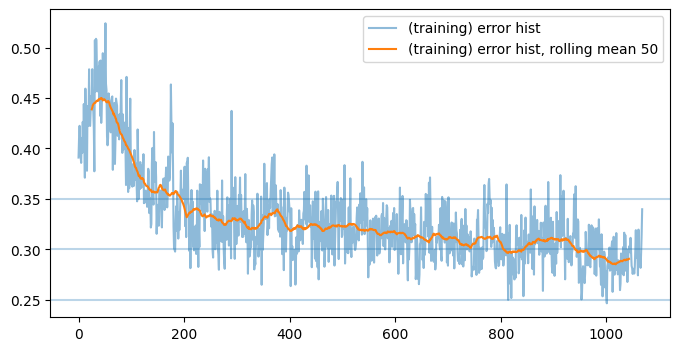

batches:  tensor(1091, dtype=torch.int32)
batches:  tensor(1092, dtype=torch.int32)
batches:  tensor(1093, dtype=torch.int32)
batches:  tensor(1094, dtype=torch.int32)
batches:  tensor(1095, dtype=torch.int32)
batches:  tensor(1096, dtype=torch.int32)
batches:  tensor(1097, dtype=torch.int32)
batches:  tensor(1098, dtype=torch.int32)
batches:  tensor(1099, dtype=torch.int32)
batches:  tensor(1100, dtype=torch.int32)


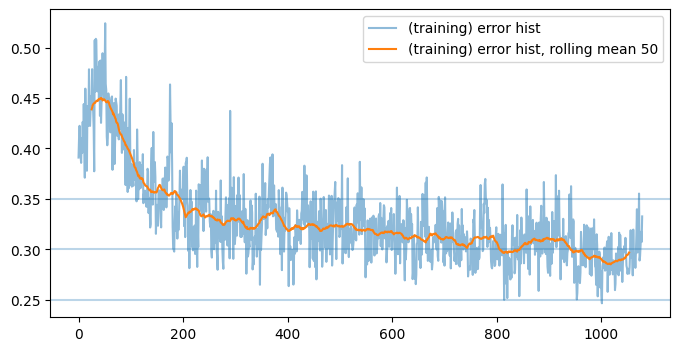

batches:  tensor(1101, dtype=torch.int32)
batches:  tensor(1102, dtype=torch.int32)
batches:  tensor(1103, dtype=torch.int32)
batches:  tensor(1104, dtype=torch.int32)
batches:  tensor(1105, dtype=torch.int32)
batches:  tensor(1106, dtype=torch.int32)
batches:  tensor(1107, dtype=torch.int32)
batches:  tensor(1108, dtype=torch.int32)
batches:  tensor(1109, dtype=torch.int32)
batches:  tensor(1110, dtype=torch.int32)


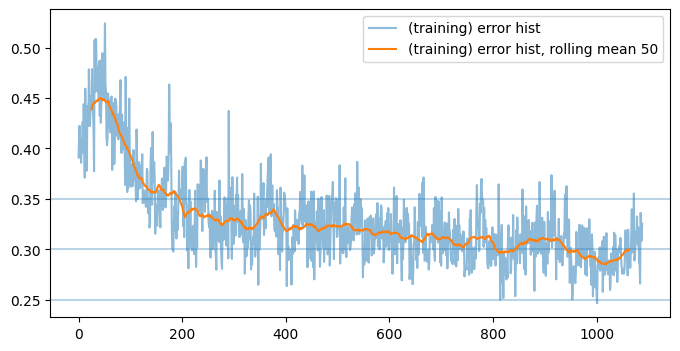

batches:  tensor(1111, dtype=torch.int32)
batches:  tensor(1112, dtype=torch.int32)
batches:  tensor(1113, dtype=torch.int32)
batches:  tensor(1114, dtype=torch.int32)
batches:  tensor(1115, dtype=torch.int32)
batches:  tensor(1116, dtype=torch.int32)
batches:  tensor(1117, dtype=torch.int32)
batches:  tensor(1118, dtype=torch.int32)
batches:  tensor(1119, dtype=torch.int32)
batches:  tensor(1120, dtype=torch.int32)


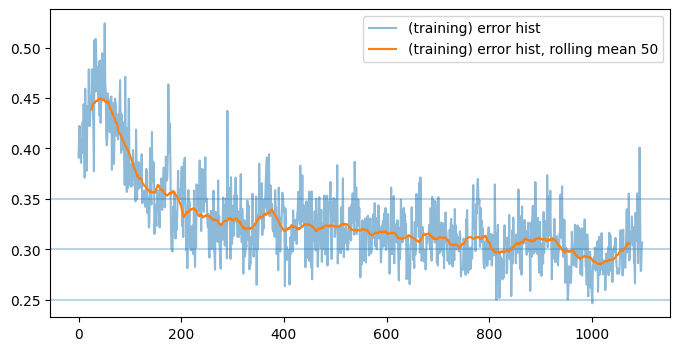

batches:  tensor(1121, dtype=torch.int32)
batches:  tensor(1122, dtype=torch.int32)
batches:  tensor(1123, dtype=torch.int32)
batches:  tensor(1124, dtype=torch.int32)
batches:  tensor(1125, dtype=torch.int32)
batches:  tensor(1126, dtype=torch.int32)
batches:  tensor(1127, dtype=torch.int32)
batches:  tensor(1128, dtype=torch.int32)
batches:  tensor(1129, dtype=torch.int32)
batches:  tensor(1130, dtype=torch.int32)


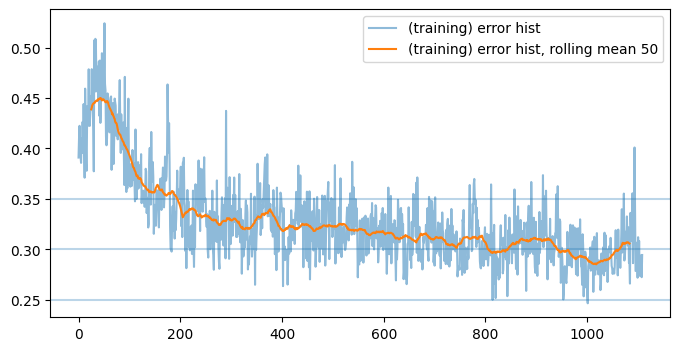

batches:  tensor(1131, dtype=torch.int32)
batches:  tensor(1132, dtype=torch.int32)
batches:  tensor(1133, dtype=torch.int32)
batches:  tensor(1134, dtype=torch.int32)
batches:  tensor(1135, dtype=torch.int32)
batches:  tensor(1136, dtype=torch.int32)
batches:  tensor(1137, dtype=torch.int32)
batches:  tensor(1138, dtype=torch.int32)
batches:  tensor(1139, dtype=torch.int32)
batches:  tensor(1140, dtype=torch.int32)


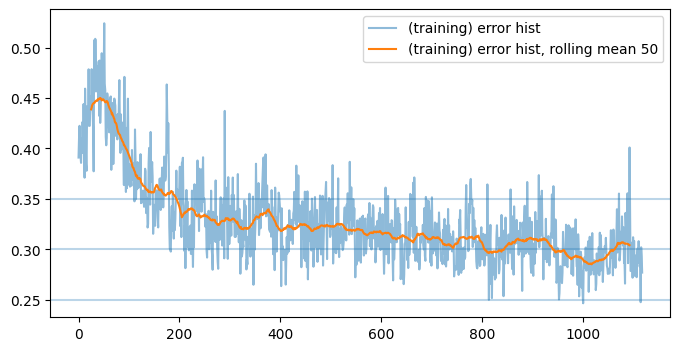

batches:  tensor(1141, dtype=torch.int32)
batches:  tensor(1142, dtype=torch.int32)
batches:  tensor(1143, dtype=torch.int32)
batches:  tensor(1144, dtype=torch.int32)
batches:  tensor(1145, dtype=torch.int32)
batches:  tensor(1146, dtype=torch.int32)
batches:  tensor(1147, dtype=torch.int32)
batches:  tensor(1148, dtype=torch.int32)
batches:  tensor(1149, dtype=torch.int32)
batches:  tensor(1150, dtype=torch.int32)


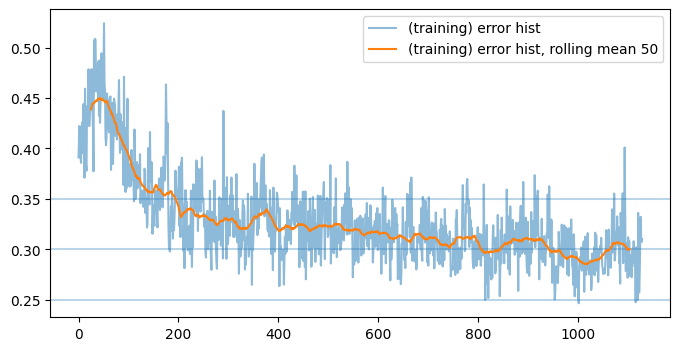

batches:  tensor(1151, dtype=torch.int32)
batches:  tensor(1152, dtype=torch.int32)
batches:  tensor(1153, dtype=torch.int32)
batches:  tensor(1154, dtype=torch.int32)
batches:  tensor(1155, dtype=torch.int32)
batches:  tensor(1156, dtype=torch.int32)
batches:  tensor(1157, dtype=torch.int32)
batches:  tensor(1158, dtype=torch.int32)
batches:  tensor(1159, dtype=torch.int32)
batches:  tensor(1160, dtype=torch.int32)


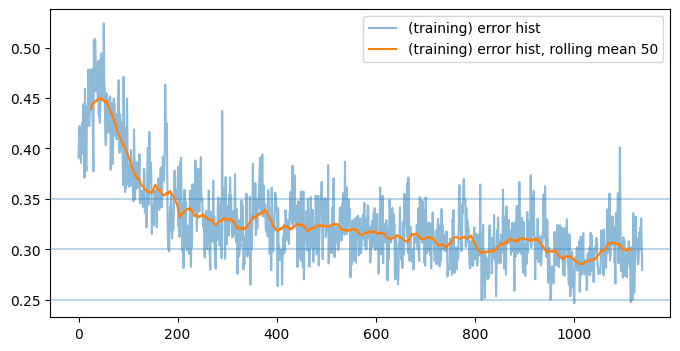

batches:  tensor(1161, dtype=torch.int32)
batches:  tensor(1162, dtype=torch.int32)
batches:  tensor(1163, dtype=torch.int32)
batches:  tensor(1164, dtype=torch.int32)
batches:  tensor(1165, dtype=torch.int32)
batches:  tensor(1166, dtype=torch.int32)
batches:  tensor(1167, dtype=torch.int32)
batches:  tensor(1168, dtype=torch.int32)
batches:  tensor(1169, dtype=torch.int32)
batches:  tensor(1170, dtype=torch.int32)


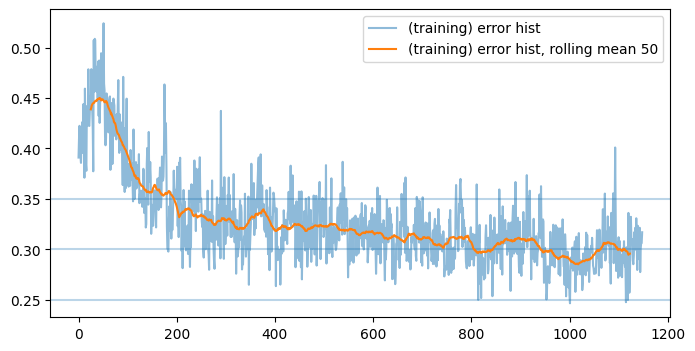

batches:  tensor(1171, dtype=torch.int32)
batches:  tensor(1172, dtype=torch.int32)
batches:  tensor(1173, dtype=torch.int32)
batches:  tensor(1174, dtype=torch.int32)
batches:  tensor(1175, dtype=torch.int32)
batches:  tensor(1176, dtype=torch.int32)
batches:  tensor(1177, dtype=torch.int32)
batches:  tensor(1178, dtype=torch.int32)
batches:  tensor(1179, dtype=torch.int32)
batches:  tensor(1180, dtype=torch.int32)


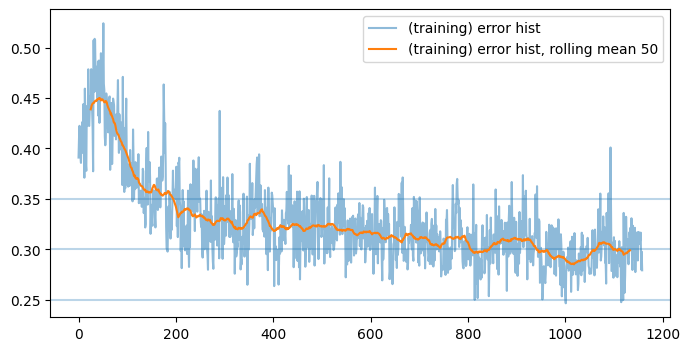

batches:  tensor(1181, dtype=torch.int32)
batches:  tensor(1182, dtype=torch.int32)
batches:  tensor(1183, dtype=torch.int32)
batches:  tensor(1184, dtype=torch.int32)
batches:  tensor(1185, dtype=torch.int32)
batches:  tensor(1186, dtype=torch.int32)
batches:  tensor(1187, dtype=torch.int32)
batches:  tensor(1188, dtype=torch.int32)
batches:  tensor(1189, dtype=torch.int32)
batches:  tensor(1190, dtype=torch.int32)


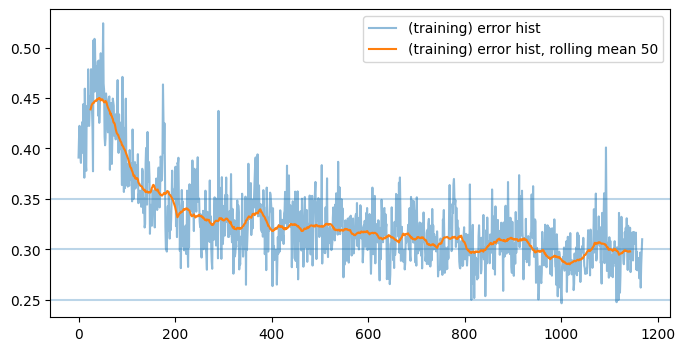

batches:  tensor(1191, dtype=torch.int32)
batches:  tensor(1192, dtype=torch.int32)
batches:  tensor(1193, dtype=torch.int32)
batches:  tensor(1194, dtype=torch.int32)
batches:  tensor(1195, dtype=torch.int32)
batches:  tensor(1196, dtype=torch.int32)
batches:  tensor(1197, dtype=torch.int32)
batches:  tensor(1198, dtype=torch.int32)
batches:  tensor(1199, dtype=torch.int32)
batches:  tensor(1200, dtype=torch.int32)


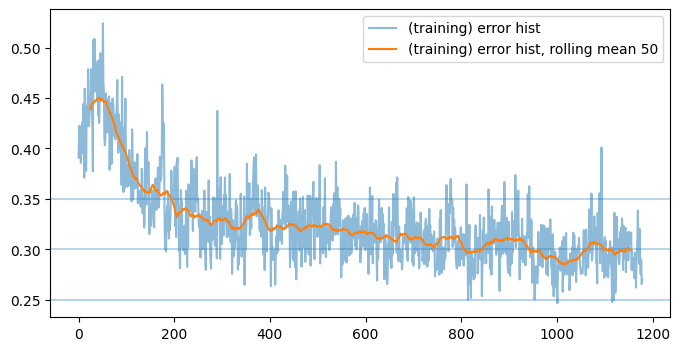

batches:  tensor(1201, dtype=torch.int32)
batches:  tensor(1202, dtype=torch.int32)
batches:  tensor(1203, dtype=torch.int32)
batches:  tensor(1204, dtype=torch.int32)
batches:  tensor(1205, dtype=torch.int32)
batches:  tensor(1206, dtype=torch.int32)
batches:  tensor(1207, dtype=torch.int32)
batches:  tensor(1208, dtype=torch.int32)
batches:  tensor(1209, dtype=torch.int32)
batches:  tensor(1210, dtype=torch.int32)


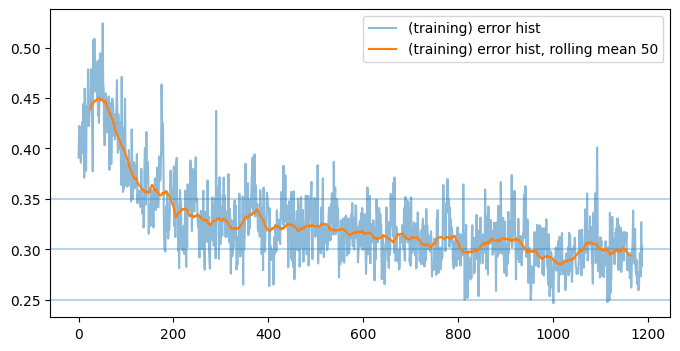

batches:  tensor(1211, dtype=torch.int32)
batches:  tensor(1212, dtype=torch.int32)
batches:  tensor(1213, dtype=torch.int32)
batches:  tensor(1214, dtype=torch.int32)
batches:  tensor(1215, dtype=torch.int32)
batches:  tensor(1216, dtype=torch.int32)
batches:  tensor(1217, dtype=torch.int32)
batches:  tensor(1218, dtype=torch.int32)
batches:  tensor(1219, dtype=torch.int32)
batches:  tensor(1220, dtype=torch.int32)


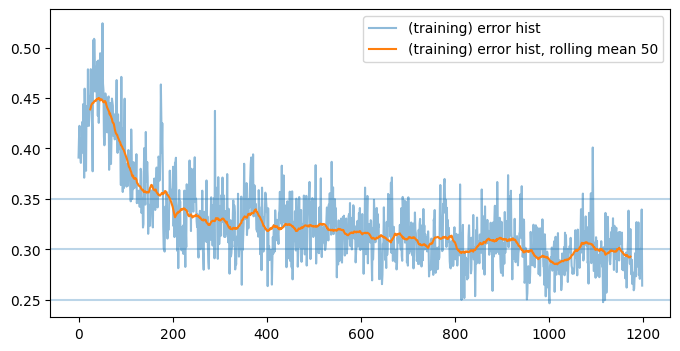

batches:  tensor(1221, dtype=torch.int32)
batches:  tensor(1222, dtype=torch.int32)
batches:  tensor(1223, dtype=torch.int32)
batches:  tensor(1224, dtype=torch.int32)
batches:  tensor(1225, dtype=torch.int32)
batches:  tensor(1226, dtype=torch.int32)
batches:  tensor(1227, dtype=torch.int32)
batches:  tensor(1228, dtype=torch.int32)
batches:  tensor(1229, dtype=torch.int32)
batches:  tensor(1230, dtype=torch.int32)


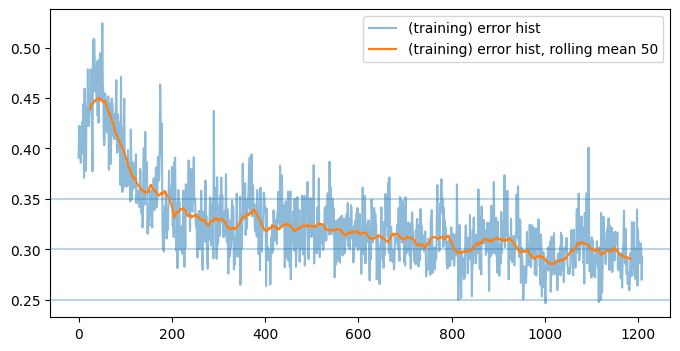

batches:  tensor(1231, dtype=torch.int32)
batches:  tensor(1232, dtype=torch.int32)
batches:  tensor(1233, dtype=torch.int32)
batches:  tensor(1234, dtype=torch.int32)
batches:  tensor(1235, dtype=torch.int32)
batches:  tensor(1236, dtype=torch.int32)
batches:  tensor(1237, dtype=torch.int32)
batches:  tensor(1238, dtype=torch.int32)
batches:  tensor(1239, dtype=torch.int32)
batches:  tensor(1240, dtype=torch.int32)


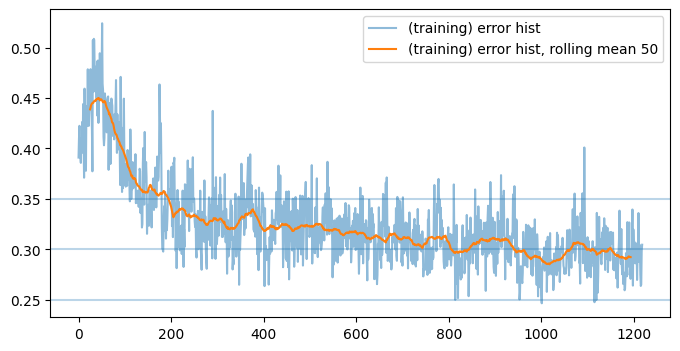

batches:  tensor(1241, dtype=torch.int32)
batches:  tensor(1242, dtype=torch.int32)
batches:  tensor(1243, dtype=torch.int32)
batches:  tensor(1244, dtype=torch.int32)
batches:  tensor(1245, dtype=torch.int32)
batches:  tensor(1246, dtype=torch.int32)
batches:  tensor(1247, dtype=torch.int32)
batches:  tensor(1248, dtype=torch.int32)
batches:  tensor(1249, dtype=torch.int32)
batches:  tensor(1250, dtype=torch.int32)


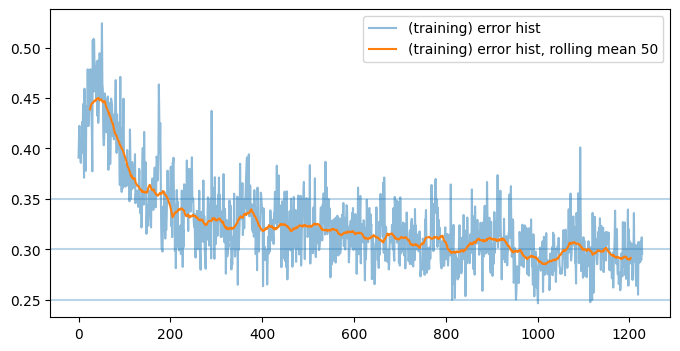

batches:  tensor(1251, dtype=torch.int32)
batches:  tensor(1252, dtype=torch.int32)
batches:  tensor(1253, dtype=torch.int32)
batches:  tensor(1254, dtype=torch.int32)
batches:  tensor(1255, dtype=torch.int32)
batches:  tensor(1256, dtype=torch.int32)
batches:  tensor(1257, dtype=torch.int32)
batches:  tensor(1258, dtype=torch.int32)
batches:  tensor(1259, dtype=torch.int32)
batches:  tensor(1260, dtype=torch.int32)


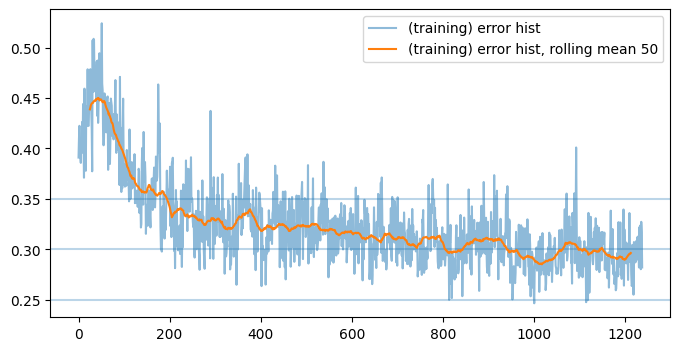

batches:  tensor(1261, dtype=torch.int32)
batches:  tensor(1262, dtype=torch.int32)
batches:  tensor(1263, dtype=torch.int32)
batches:  tensor(1264, dtype=torch.int32)
batches:  tensor(1265, dtype=torch.int32)
batches:  tensor(1266, dtype=torch.int32)
batches:  tensor(1267, dtype=torch.int32)
batches:  tensor(1268, dtype=torch.int32)
batches:  tensor(1269, dtype=torch.int32)
batches:  tensor(1270, dtype=torch.int32)


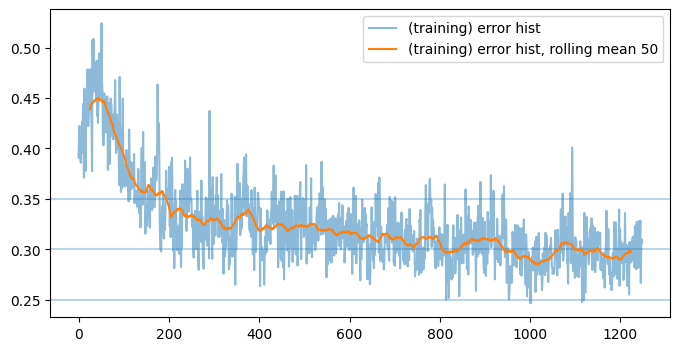

batches:  tensor(1271, dtype=torch.int32)
batches:  tensor(1272, dtype=torch.int32)
batches:  tensor(1273, dtype=torch.int32)
batches:  tensor(1274, dtype=torch.int32)
batches:  tensor(1275, dtype=torch.int32)
batches:  tensor(1276, dtype=torch.int32)
batches:  tensor(1277, dtype=torch.int32)
batches:  tensor(1278, dtype=torch.int32)
batches:  tensor(1279, dtype=torch.int32)
batches:  tensor(1280, dtype=torch.int32)


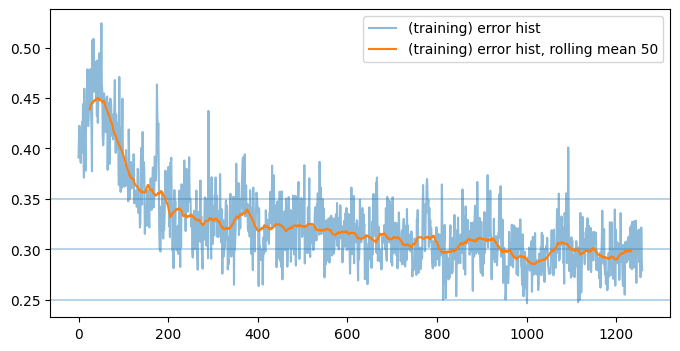

batches:  tensor(1281, dtype=torch.int32)
batches:  tensor(1282, dtype=torch.int32)
batches:  tensor(1283, dtype=torch.int32)
batches:  tensor(1284, dtype=torch.int32)
batches:  tensor(1285, dtype=torch.int32)
batches:  tensor(1286, dtype=torch.int32)
batches:  tensor(1287, dtype=torch.int32)
batches:  tensor(1288, dtype=torch.int32)
batches:  tensor(1289, dtype=torch.int32)
batches:  tensor(1290, dtype=torch.int32)


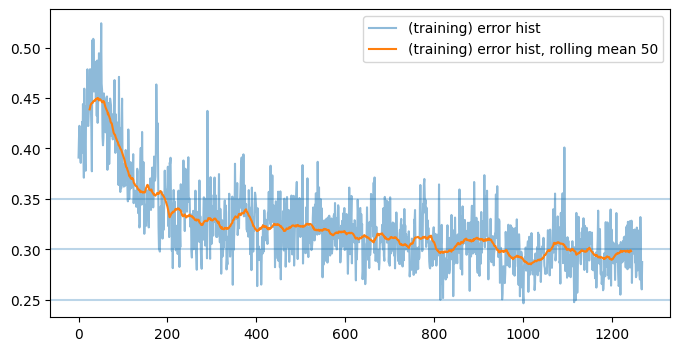

batches:  tensor(1291, dtype=torch.int32)
batches:  tensor(1292, dtype=torch.int32)
batches:  tensor(1293, dtype=torch.int32)
batches:  tensor(1294, dtype=torch.int32)
batches:  tensor(1295, dtype=torch.int32)
batches:  tensor(1296, dtype=torch.int32)
batches:  tensor(1297, dtype=torch.int32)
batches:  tensor(1298, dtype=torch.int32)
batches:  tensor(1299, dtype=torch.int32)
batches:  tensor(1300, dtype=torch.int32)


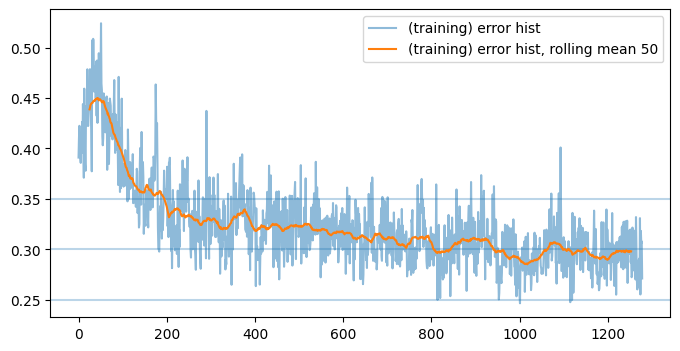

batches:  tensor(1301, dtype=torch.int32)
batches:  tensor(1302, dtype=torch.int32)
batches:  tensor(1303, dtype=torch.int32)
batches:  tensor(1304, dtype=torch.int32)
batches:  tensor(1305, dtype=torch.int32)
batches:  tensor(1306, dtype=torch.int32)
batches:  tensor(1307, dtype=torch.int32)
batches:  tensor(1308, dtype=torch.int32)
batches:  tensor(1309, dtype=torch.int32)
batches:  tensor(1310, dtype=torch.int32)


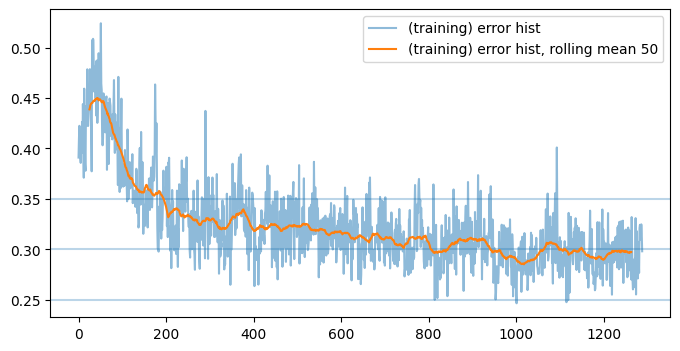

batches:  tensor(1311, dtype=torch.int32)
batches:  tensor(1312, dtype=torch.int32)
batches:  tensor(1313, dtype=torch.int32)
batches:  tensor(1314, dtype=torch.int32)
batches:  tensor(1315, dtype=torch.int32)
batches:  tensor(1316, dtype=torch.int32)
batches:  tensor(1317, dtype=torch.int32)
batches:  tensor(1318, dtype=torch.int32)
batches:  tensor(1319, dtype=torch.int32)
batches:  tensor(1320, dtype=torch.int32)


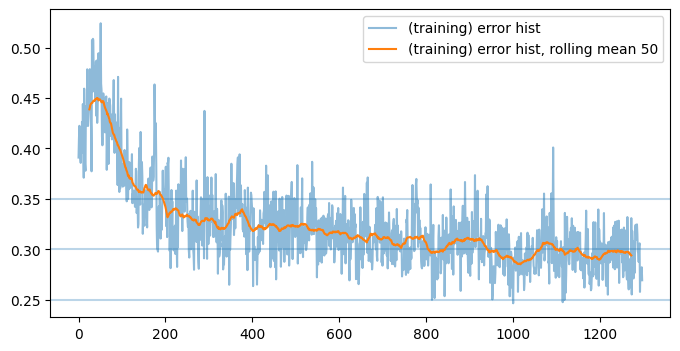

batches:  tensor(1321, dtype=torch.int32)
batches:  tensor(1322, dtype=torch.int32)
batches:  tensor(1323, dtype=torch.int32)
batches:  tensor(1324, dtype=torch.int32)
batches:  tensor(1325, dtype=torch.int32)
batches:  tensor(1326, dtype=torch.int32)
batches:  tensor(1327, dtype=torch.int32)
batches:  tensor(1328, dtype=torch.int32)
batches:  tensor(1329, dtype=torch.int32)
batches:  tensor(1330, dtype=torch.int32)


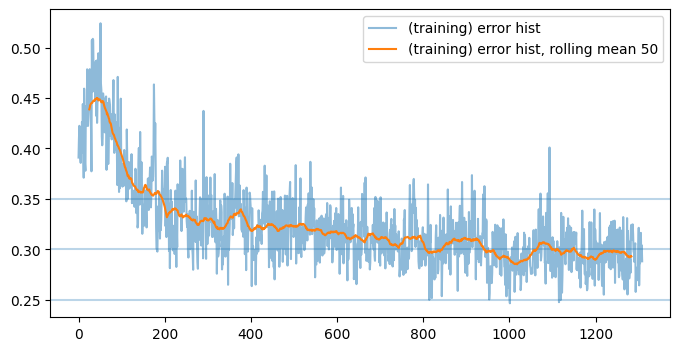

batches:  tensor(1331, dtype=torch.int32)
batches:  tensor(1332, dtype=torch.int32)
batches:  tensor(1333, dtype=torch.int32)
batches:  tensor(1334, dtype=torch.int32)
batches:  tensor(1335, dtype=torch.int32)
batches:  tensor(1336, dtype=torch.int32)
batches:  tensor(1337, dtype=torch.int32)
batches:  tensor(1338, dtype=torch.int32)
batches:  tensor(1339, dtype=torch.int32)
batches:  tensor(1340, dtype=torch.int32)


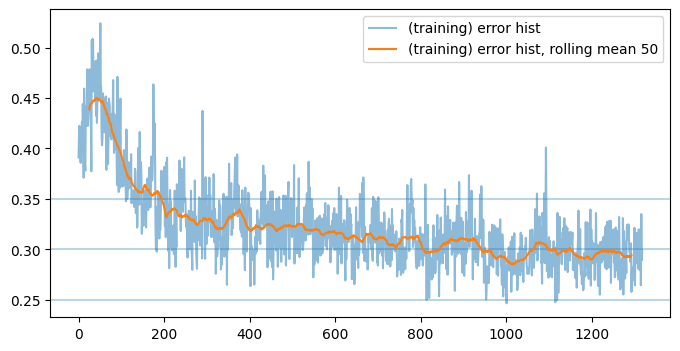

batches:  tensor(1341, dtype=torch.int32)
batches:  tensor(1342, dtype=torch.int32)
batches:  tensor(1343, dtype=torch.int32)
batches:  tensor(1344, dtype=torch.int32)
batches:  tensor(1345, dtype=torch.int32)
batches:  tensor(1346, dtype=torch.int32)
batches:  tensor(1347, dtype=torch.int32)
batches:  tensor(1348, dtype=torch.int32)
batches:  tensor(1349, dtype=torch.int32)
batches:  tensor(1350, dtype=torch.int32)


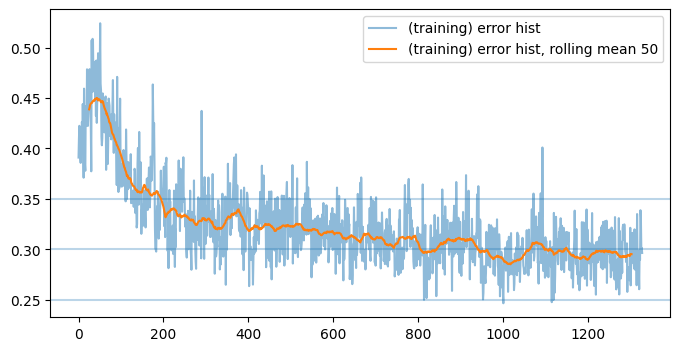

batches:  tensor(1351, dtype=torch.int32)
batches:  tensor(1352, dtype=torch.int32)
batches:  tensor(1353, dtype=torch.int32)
batches:  tensor(1354, dtype=torch.int32)
batches:  tensor(1355, dtype=torch.int32)
batches:  tensor(1356, dtype=torch.int32)
batches:  tensor(1357, dtype=torch.int32)
batches:  tensor(1358, dtype=torch.int32)
batches:  tensor(1359, dtype=torch.int32)
batches:  tensor(1360, dtype=torch.int32)


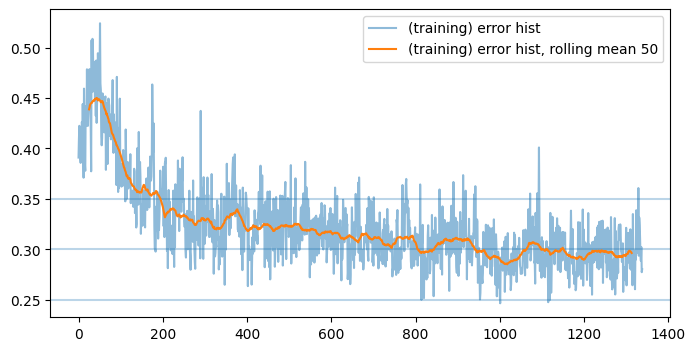

batches:  tensor(1361, dtype=torch.int32)
batches:  tensor(1362, dtype=torch.int32)
batches:  tensor(1363, dtype=torch.int32)
batches:  tensor(1364, dtype=torch.int32)
batches:  tensor(1365, dtype=torch.int32)
batches:  tensor(1366, dtype=torch.int32)
batches:  tensor(1367, dtype=torch.int32)
batches:  tensor(1368, dtype=torch.int32)
batches:  tensor(1369, dtype=torch.int32)
batches:  tensor(1370, dtype=torch.int32)


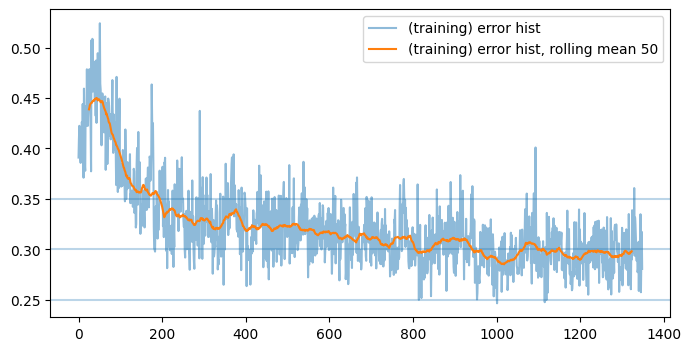

batches:  tensor(1371, dtype=torch.int32)
batches:  tensor(1372, dtype=torch.int32)
batches:  tensor(1373, dtype=torch.int32)
batches:  tensor(1374, dtype=torch.int32)
batches:  tensor(1375, dtype=torch.int32)
batches:  tensor(1376, dtype=torch.int32)
batches:  tensor(1377, dtype=torch.int32)
batches:  tensor(1378, dtype=torch.int32)
batches:  tensor(1379, dtype=torch.int32)
batches:  tensor(1380, dtype=torch.int32)


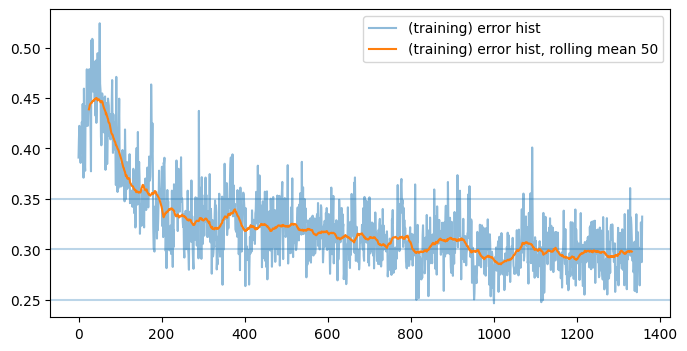

batches:  tensor(1381, dtype=torch.int32)
batches:  tensor(1382, dtype=torch.int32)
batches:  tensor(1383, dtype=torch.int32)
batches:  tensor(1384, dtype=torch.int32)
batches:  tensor(1385, dtype=torch.int32)
batches:  tensor(1386, dtype=torch.int32)
batches:  tensor(1387, dtype=torch.int32)
batches:  tensor(1388, dtype=torch.int32)
batches:  tensor(1389, dtype=torch.int32)
batches:  tensor(1390, dtype=torch.int32)


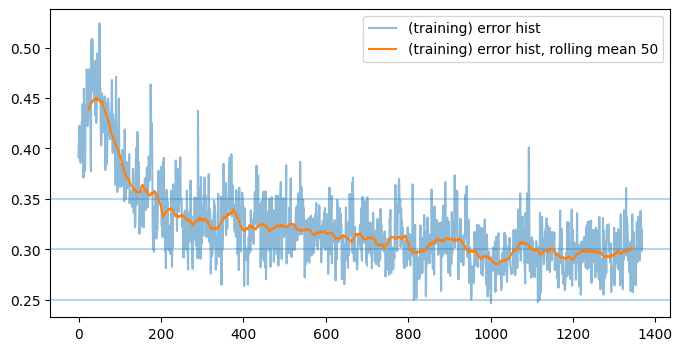

batches:  tensor(1391, dtype=torch.int32)
batches:  tensor(1392, dtype=torch.int32)
batches:  tensor(1393, dtype=torch.int32)
batches:  tensor(1394, dtype=torch.int32)
batches:  tensor(1395, dtype=torch.int32)
batches:  tensor(1396, dtype=torch.int32)
batches:  tensor(1397, dtype=torch.int32)
batches:  tensor(1398, dtype=torch.int32)
batches:  tensor(1399, dtype=torch.int32)
batches:  tensor(1400, dtype=torch.int32)


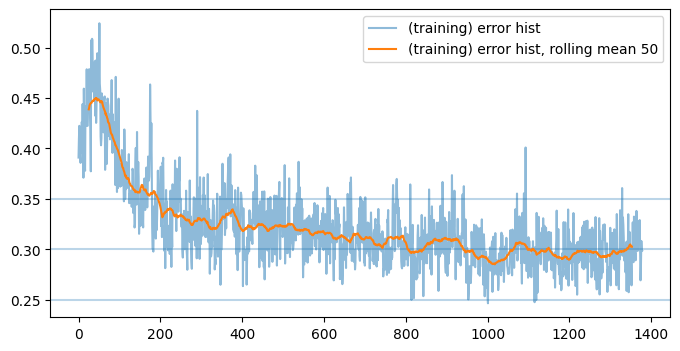

batches:  tensor(1401, dtype=torch.int32)
batches:  tensor(1402, dtype=torch.int32)
batches:  tensor(1403, dtype=torch.int32)
batches:  tensor(1404, dtype=torch.int32)
batches:  tensor(1405, dtype=torch.int32)
batches:  tensor(1406, dtype=torch.int32)
batches:  tensor(1407, dtype=torch.int32)
batches:  tensor(1408, dtype=torch.int32)
batches:  tensor(1409, dtype=torch.int32)
batches:  tensor(1410, dtype=torch.int32)


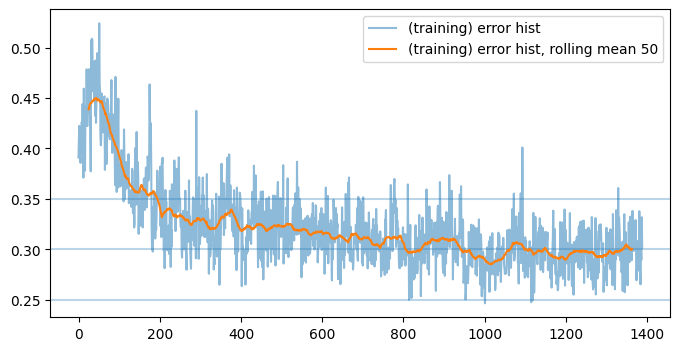

batches:  tensor(1411, dtype=torch.int32)
batches:  tensor(1412, dtype=torch.int32)
batches:  tensor(1413, dtype=torch.int32)
batches:  tensor(1414, dtype=torch.int32)
batches:  tensor(1415, dtype=torch.int32)
batches:  tensor(1416, dtype=torch.int32)
batches:  tensor(1417, dtype=torch.int32)
batches:  tensor(1418, dtype=torch.int32)
batches:  tensor(1419, dtype=torch.int32)
batches:  tensor(1420, dtype=torch.int32)


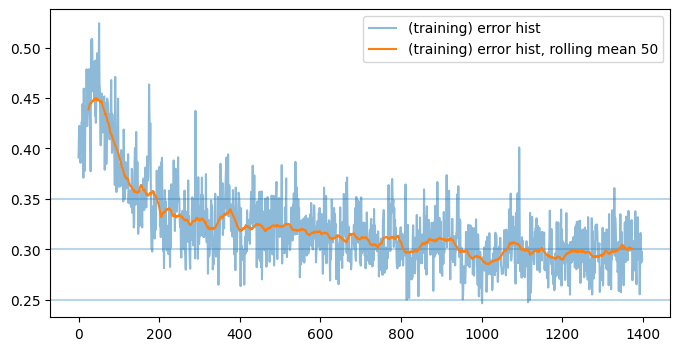

batches:  tensor(1421, dtype=torch.int32)
batches:  tensor(1422, dtype=torch.int32)
batches:  tensor(1423, dtype=torch.int32)
batches:  tensor(1424, dtype=torch.int32)
batches:  tensor(1425, dtype=torch.int32)
batches:  tensor(1426, dtype=torch.int32)
batches:  tensor(1427, dtype=torch.int32)
batches:  tensor(1428, dtype=torch.int32)
batches:  tensor(1429, dtype=torch.int32)
batches:  tensor(1430, dtype=torch.int32)


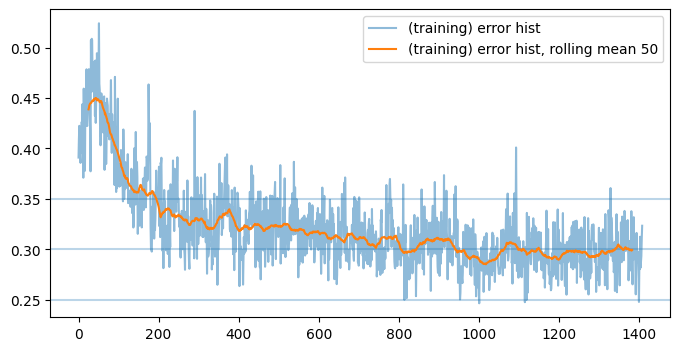

batches:  tensor(1431, dtype=torch.int32)
batches:  tensor(1432, dtype=torch.int32)
batches:  tensor(1433, dtype=torch.int32)
batches:  tensor(1434, dtype=torch.int32)
batches:  tensor(1435, dtype=torch.int32)
batches:  tensor(1436, dtype=torch.int32)
batches:  tensor(1437, dtype=torch.int32)
batches:  tensor(1438, dtype=torch.int32)
batches:  tensor(1439, dtype=torch.int32)
batches:  tensor(1440, dtype=torch.int32)


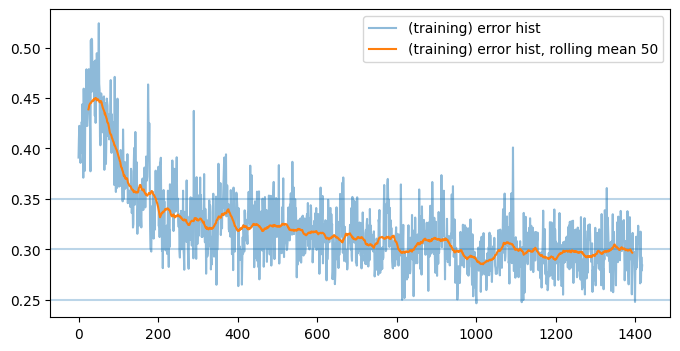

batches:  tensor(1441, dtype=torch.int32)
batches:  tensor(1442, dtype=torch.int32)
batches:  tensor(1443, dtype=torch.int32)
batches:  tensor(1444, dtype=torch.int32)
batches:  tensor(1445, dtype=torch.int32)
batches:  tensor(1446, dtype=torch.int32)
batches:  tensor(1447, dtype=torch.int32)
batches:  tensor(1448, dtype=torch.int32)
batches:  tensor(1449, dtype=torch.int32)
batches:  tensor(1450, dtype=torch.int32)


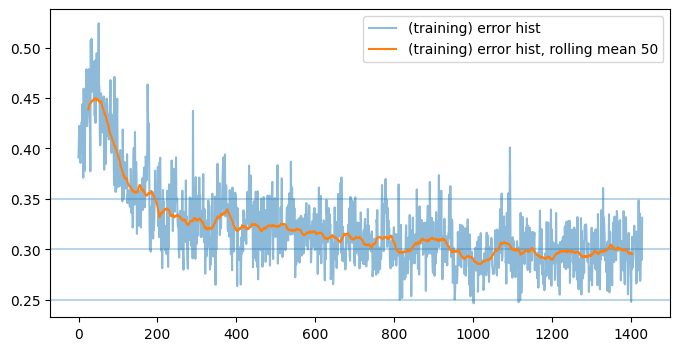

batches:  tensor(1451, dtype=torch.int32)
batches:  tensor(1452, dtype=torch.int32)
batches:  tensor(1453, dtype=torch.int32)
batches:  tensor(1454, dtype=torch.int32)
batches:  tensor(1455, dtype=torch.int32)
batches:  tensor(1456, dtype=torch.int32)
batches:  tensor(1457, dtype=torch.int32)
batches:  tensor(1458, dtype=torch.int32)
batches:  tensor(1459, dtype=torch.int32)
batches:  tensor(1460, dtype=torch.int32)


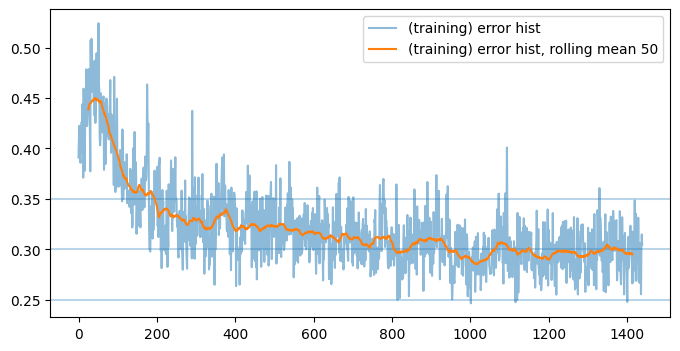

batches:  tensor(1461, dtype=torch.int32)
batches:  tensor(1462, dtype=torch.int32)
batches:  tensor(1463, dtype=torch.int32)
batches:  tensor(1464, dtype=torch.int32)
batches:  tensor(1465, dtype=torch.int32)
batches:  tensor(1466, dtype=torch.int32)
batches:  tensor(1467, dtype=torch.int32)
batches:  tensor(1468, dtype=torch.int32)
batches:  tensor(1469, dtype=torch.int32)
batches:  tensor(1470, dtype=torch.int32)


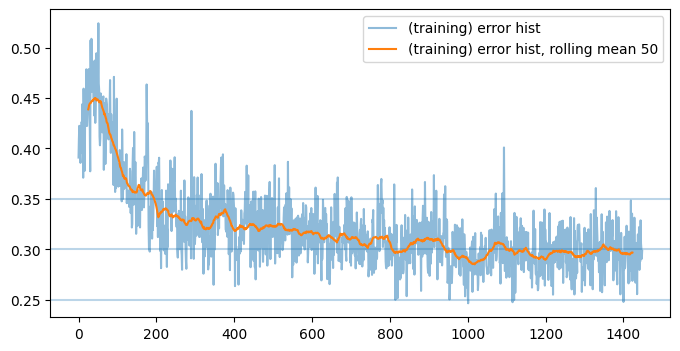

batches:  tensor(1471, dtype=torch.int32)
batches:  tensor(1472, dtype=torch.int32)
batches:  tensor(1473, dtype=torch.int32)
batches:  tensor(1474, dtype=torch.int32)
batches:  tensor(1475, dtype=torch.int32)
batches:  tensor(1476, dtype=torch.int32)
batches:  tensor(1477, dtype=torch.int32)
batches:  tensor(1478, dtype=torch.int32)
batches:  tensor(1479, dtype=torch.int32)
batches:  tensor(1480, dtype=torch.int32)


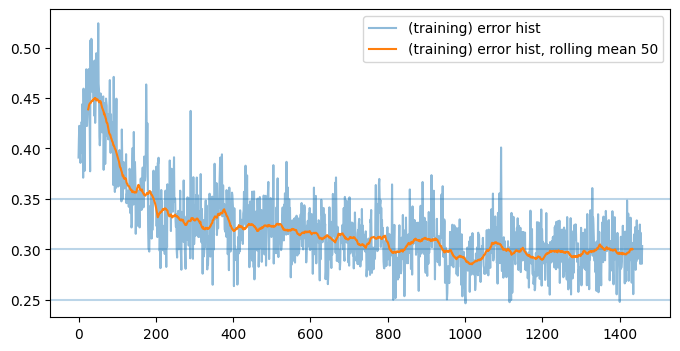

batches:  tensor(1481, dtype=torch.int32)
batches:  tensor(1482, dtype=torch.int32)
batches:  tensor(1483, dtype=torch.int32)
batches:  tensor(1484, dtype=torch.int32)
batches:  tensor(1485, dtype=torch.int32)
batches:  tensor(1486, dtype=torch.int32)
batches:  tensor(1487, dtype=torch.int32)
batches:  tensor(1488, dtype=torch.int32)
batches:  tensor(1489, dtype=torch.int32)
batches:  tensor(1490, dtype=torch.int32)


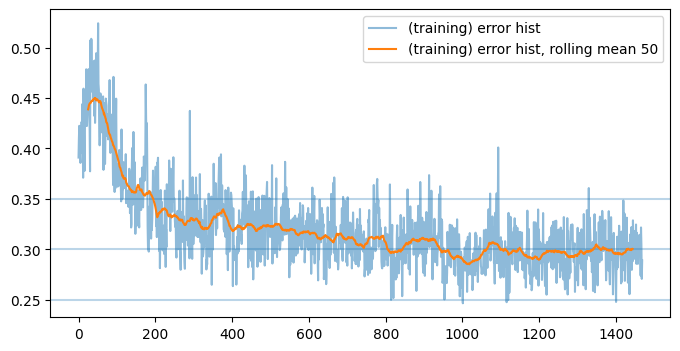

batches:  tensor(1491, dtype=torch.int32)
batches:  tensor(1492, dtype=torch.int32)
batches:  tensor(1493, dtype=torch.int32)
batches:  tensor(1494, dtype=torch.int32)
batches:  tensor(1495, dtype=torch.int32)
batches:  tensor(1496, dtype=torch.int32)
batches:  tensor(1497, dtype=torch.int32)
batches:  tensor(1498, dtype=torch.int32)
batches:  tensor(1499, dtype=torch.int32)
batches:  tensor(1500, dtype=torch.int32)


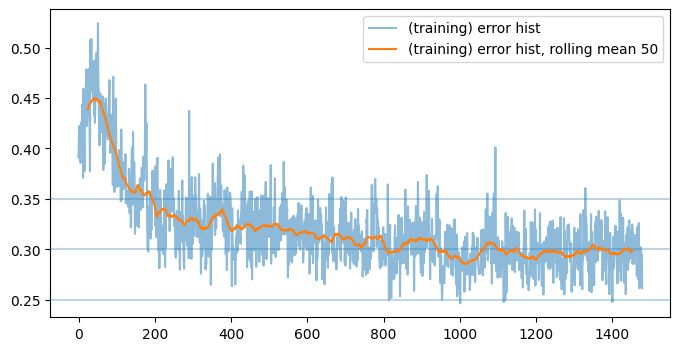

batches:  tensor(1501, dtype=torch.int32)
batches:  tensor(1502, dtype=torch.int32)
batches:  tensor(1503, dtype=torch.int32)
batches:  tensor(1504, dtype=torch.int32)
batches:  tensor(1505, dtype=torch.int32)
batches:  tensor(1506, dtype=torch.int32)
batches:  tensor(1507, dtype=torch.int32)
batches:  tensor(1508, dtype=torch.int32)
batches:  tensor(1509, dtype=torch.int32)
batches:  tensor(1510, dtype=torch.int32)


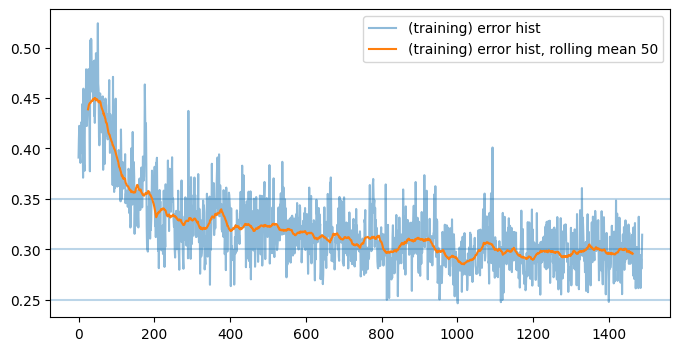

batches:  tensor(1511, dtype=torch.int32)
batches:  tensor(1512, dtype=torch.int32)
batches:  tensor(1513, dtype=torch.int32)
batches:  tensor(1514, dtype=torch.int32)
batches:  tensor(1515, dtype=torch.int32)
batches:  tensor(1516, dtype=torch.int32)
batches:  tensor(1517, dtype=torch.int32)
batches:  tensor(1518, dtype=torch.int32)
batches:  tensor(1519, dtype=torch.int32)
batches:  tensor(1520, dtype=torch.int32)


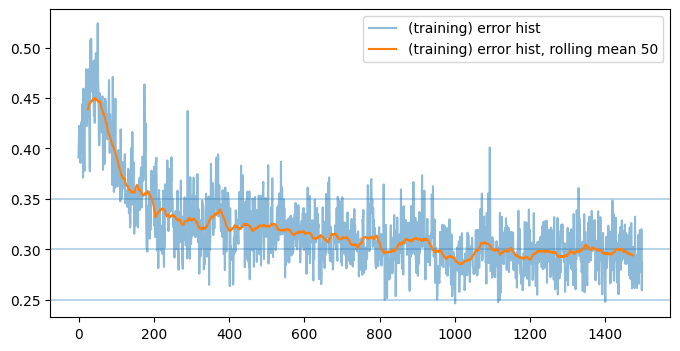

batches:  tensor(1521, dtype=torch.int32)
batches:  tensor(1522, dtype=torch.int32)
batches:  tensor(1523, dtype=torch.int32)
batches:  tensor(1524, dtype=torch.int32)
batches:  tensor(1525, dtype=torch.int32)
batches:  tensor(1526, dtype=torch.int32)
batches:  tensor(1527, dtype=torch.int32)
batches:  tensor(1528, dtype=torch.int32)
batches:  tensor(1529, dtype=torch.int32)
batches:  tensor(1530, dtype=torch.int32)


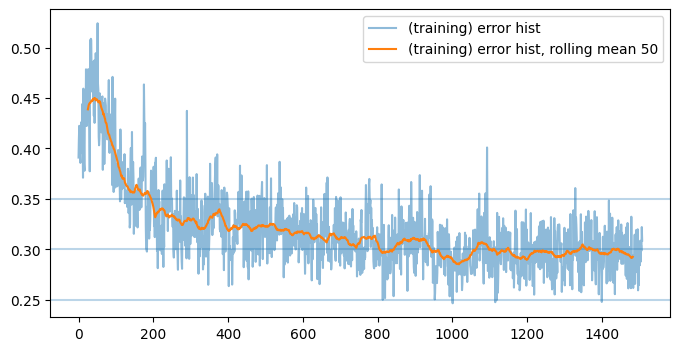

batches:  tensor(1531, dtype=torch.int32)
batches:  tensor(1532, dtype=torch.int32)
batches:  tensor(1533, dtype=torch.int32)
batches:  tensor(1534, dtype=torch.int32)
batches:  tensor(1535, dtype=torch.int32)
batches:  tensor(1536, dtype=torch.int32)
batches:  tensor(1537, dtype=torch.int32)
batches:  tensor(1538, dtype=torch.int32)
batches:  tensor(1539, dtype=torch.int32)
batches:  tensor(1540, dtype=torch.int32)


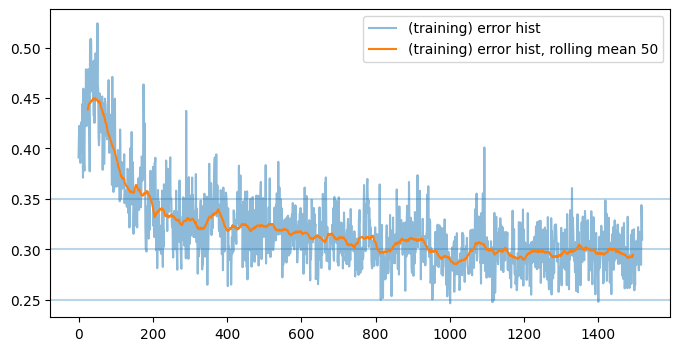

batches:  tensor(1541, dtype=torch.int32)
batches:  tensor(1542, dtype=torch.int32)
batches:  tensor(1543, dtype=torch.int32)
batches:  tensor(1544, dtype=torch.int32)
batches:  tensor(1545, dtype=torch.int32)
batches:  tensor(1546, dtype=torch.int32)
batches:  tensor(1547, dtype=torch.int32)
batches:  tensor(1548, dtype=torch.int32)
batches:  tensor(1549, dtype=torch.int32)
batches:  tensor(1550, dtype=torch.int32)


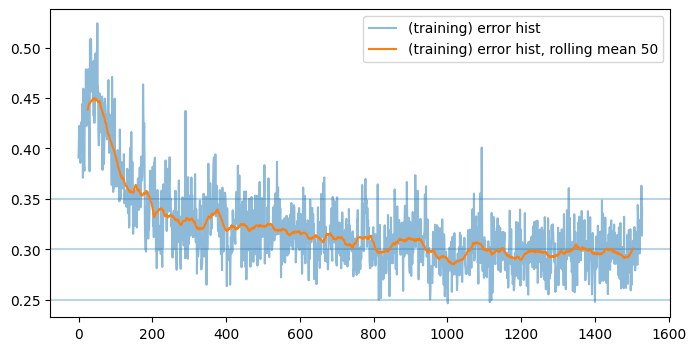

batches:  tensor(1551, dtype=torch.int32)
batches:  tensor(1552, dtype=torch.int32)
batches:  tensor(1553, dtype=torch.int32)
batches:  tensor(1554, dtype=torch.int32)
batches:  tensor(1555, dtype=torch.int32)
batches:  tensor(1556, dtype=torch.int32)
batches:  tensor(1557, dtype=torch.int32)
batches:  tensor(1558, dtype=torch.int32)
batches:  tensor(1559, dtype=torch.int32)
batches:  tensor(1560, dtype=torch.int32)


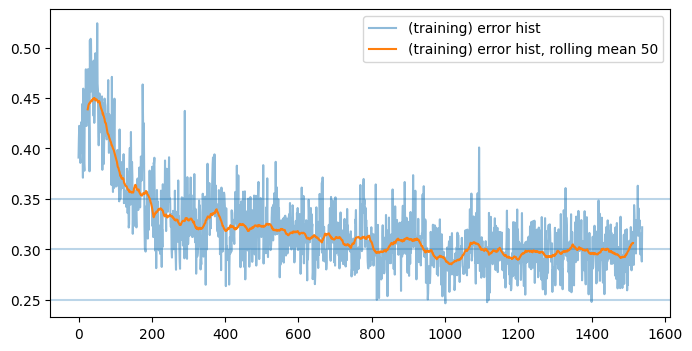

batches:  tensor(1561, dtype=torch.int32)
batches:  tensor(1562, dtype=torch.int32)
batches:  tensor(1563, dtype=torch.int32)
batches:  tensor(1564, dtype=torch.int32)
batches:  tensor(1565, dtype=torch.int32)
batches:  tensor(1566, dtype=torch.int32)
batches:  tensor(1567, dtype=torch.int32)
batches:  tensor(1568, dtype=torch.int32)
batches:  tensor(1569, dtype=torch.int32)
batches:  tensor(1570, dtype=torch.int32)


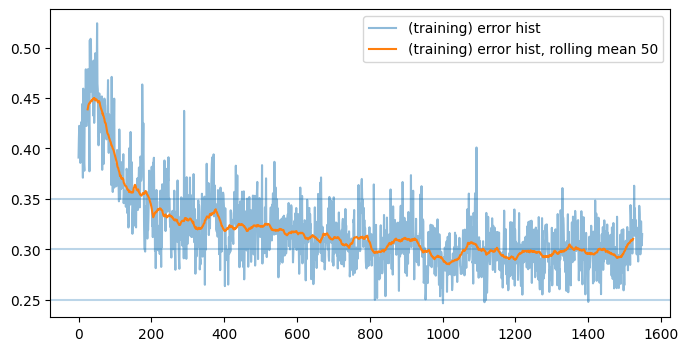

batches:  tensor(1571, dtype=torch.int32)
batches:  tensor(1572, dtype=torch.int32)
batches:  tensor(1573, dtype=torch.int32)
batches:  tensor(1574, dtype=torch.int32)
batches:  tensor(1575, dtype=torch.int32)
batches:  tensor(1576, dtype=torch.int32)
batches:  tensor(1577, dtype=torch.int32)
batches:  tensor(1578, dtype=torch.int32)
batches:  tensor(1579, dtype=torch.int32)
batches:  tensor(1580, dtype=torch.int32)


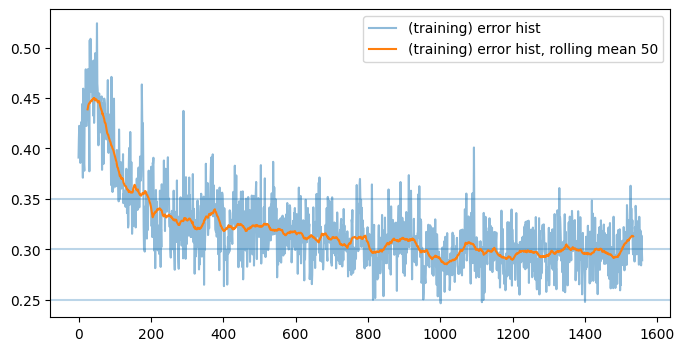

batches:  tensor(1581, dtype=torch.int32)
batches:  tensor(1582, dtype=torch.int32)
batches:  tensor(1583, dtype=torch.int32)
batches:  tensor(1584, dtype=torch.int32)
batches:  tensor(1585, dtype=torch.int32)
batches:  tensor(1586, dtype=torch.int32)
batches:  tensor(1587, dtype=torch.int32)
batches:  tensor(1588, dtype=torch.int32)
batches:  tensor(1589, dtype=torch.int32)
batches:  tensor(1590, dtype=torch.int32)


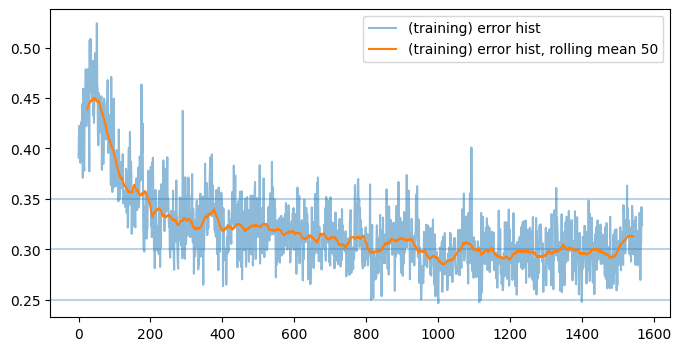

batches:  tensor(1591, dtype=torch.int32)
batches:  tensor(1592, dtype=torch.int32)
batches:  tensor(1593, dtype=torch.int32)
batches:  tensor(1594, dtype=torch.int32)
batches:  tensor(1595, dtype=torch.int32)
batches:  tensor(1596, dtype=torch.int32)
batches:  tensor(1597, dtype=torch.int32)
batches:  tensor(1598, dtype=torch.int32)
batches:  tensor(1599, dtype=torch.int32)
batches:  tensor(1600, dtype=torch.int32)


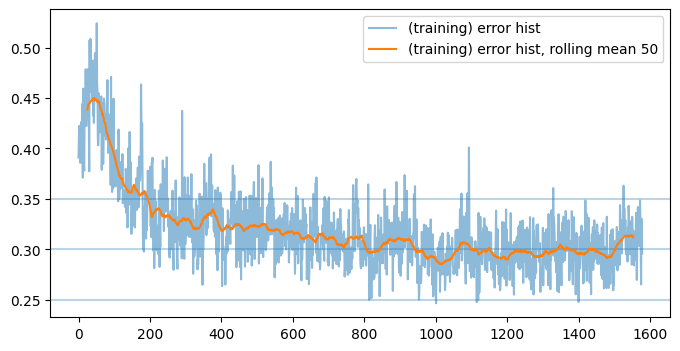

batches:  tensor(1601, dtype=torch.int32)
batches:  tensor(1602, dtype=torch.int32)
batches:  tensor(1603, dtype=torch.int32)
batches:  tensor(1604, dtype=torch.int32)
batches:  tensor(1605, dtype=torch.int32)
batches:  tensor(1606, dtype=torch.int32)
batches:  tensor(1607, dtype=torch.int32)
batches:  tensor(1608, dtype=torch.int32)
batches:  tensor(1609, dtype=torch.int32)
batches:  tensor(1610, dtype=torch.int32)


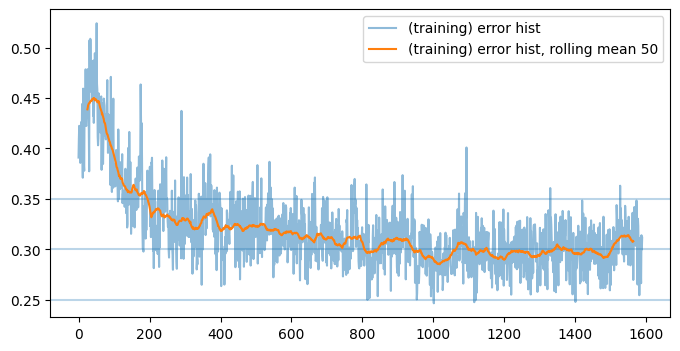

batches:  tensor(1611, dtype=torch.int32)
batches:  tensor(1612, dtype=torch.int32)
batches:  tensor(1613, dtype=torch.int32)
batches:  tensor(1614, dtype=torch.int32)
batches:  tensor(1615, dtype=torch.int32)
batches:  tensor(1616, dtype=torch.int32)
batches:  tensor(1617, dtype=torch.int32)
batches:  tensor(1618, dtype=torch.int32)
batches:  tensor(1619, dtype=torch.int32)
batches:  tensor(1620, dtype=torch.int32)


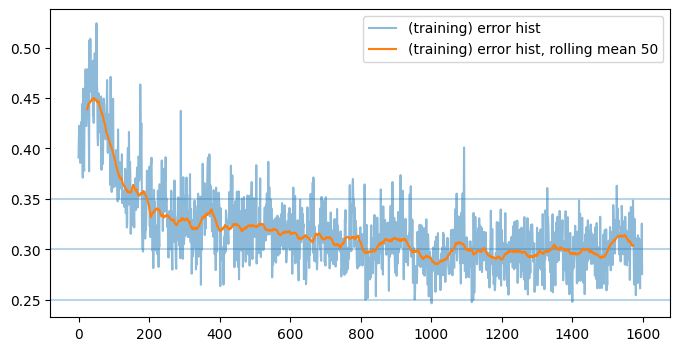

batches:  tensor(1621, dtype=torch.int32)
batches:  tensor(1622, dtype=torch.int32)
batches:  tensor(1623, dtype=torch.int32)
batches:  tensor(1624, dtype=torch.int32)
batches:  tensor(1625, dtype=torch.int32)
batches:  tensor(1626, dtype=torch.int32)
batches:  tensor(1627, dtype=torch.int32)
batches:  tensor(1628, dtype=torch.int32)
batches:  tensor(1629, dtype=torch.int32)
batches:  tensor(1630, dtype=torch.int32)


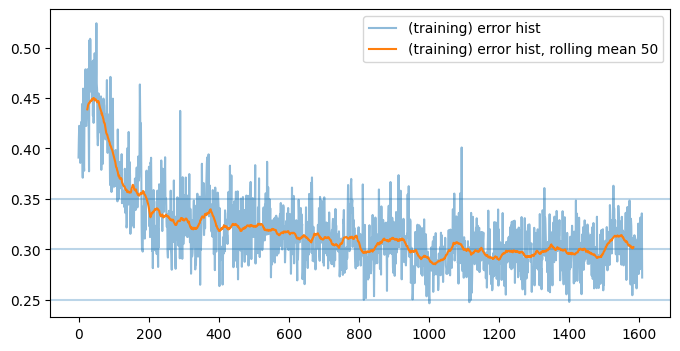

batches:  tensor(1631, dtype=torch.int32)
batches:  tensor(1632, dtype=torch.int32)
batches:  tensor(1633, dtype=torch.int32)
batches:  tensor(1634, dtype=torch.int32)
batches:  tensor(1635, dtype=torch.int32)
batches:  tensor(1636, dtype=torch.int32)
batches:  tensor(1637, dtype=torch.int32)
batches:  tensor(1638, dtype=torch.int32)
batches:  tensor(1639, dtype=torch.int32)
batches:  tensor(1640, dtype=torch.int32)


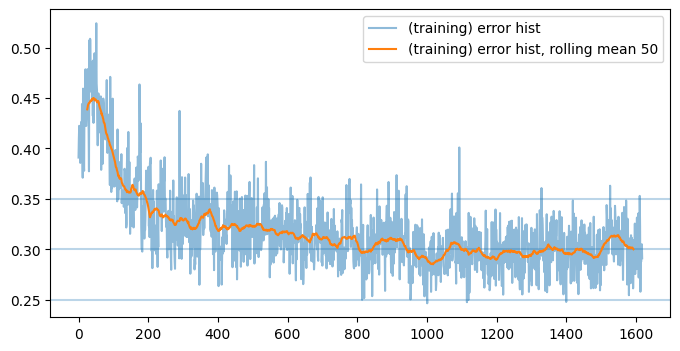

batches:  tensor(1641, dtype=torch.int32)
batches:  tensor(1642, dtype=torch.int32)
batches:  tensor(1643, dtype=torch.int32)
batches:  tensor(1644, dtype=torch.int32)
batches:  tensor(1645, dtype=torch.int32)
batches:  tensor(1646, dtype=torch.int32)
batches:  tensor(1647, dtype=torch.int32)
batches:  tensor(1648, dtype=torch.int32)
batches:  tensor(1649, dtype=torch.int32)
batches:  tensor(1650, dtype=torch.int32)


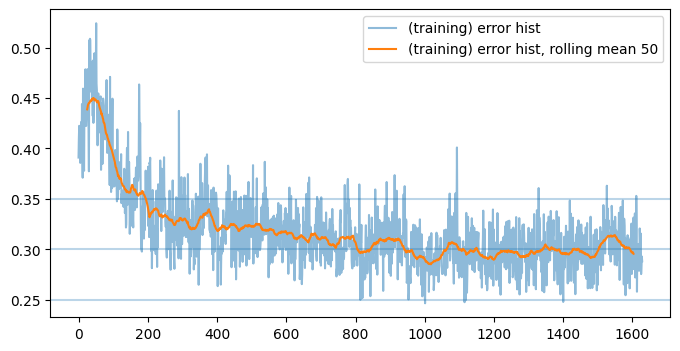

batches:  tensor(1651, dtype=torch.int32)
batches:  tensor(1652, dtype=torch.int32)
batches:  tensor(1653, dtype=torch.int32)
batches:  tensor(1654, dtype=torch.int32)
batches:  tensor(1655, dtype=torch.int32)
batches:  tensor(1656, dtype=torch.int32)
batches:  tensor(1657, dtype=torch.int32)
batches:  tensor(1658, dtype=torch.int32)
batches:  tensor(1659, dtype=torch.int32)
batches:  tensor(1660, dtype=torch.int32)


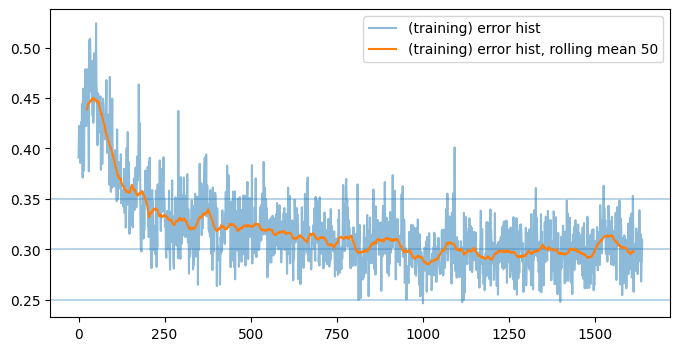

batches:  tensor(1661, dtype=torch.int32)
batches:  tensor(1662, dtype=torch.int32)
batches:  tensor(1663, dtype=torch.int32)
batches:  tensor(1664, dtype=torch.int32)
batches:  tensor(1665, dtype=torch.int32)
batches:  tensor(1666, dtype=torch.int32)
batches:  tensor(1667, dtype=torch.int32)
batches:  tensor(1668, dtype=torch.int32)
batches:  tensor(1669, dtype=torch.int32)
batches:  tensor(1670, dtype=torch.int32)


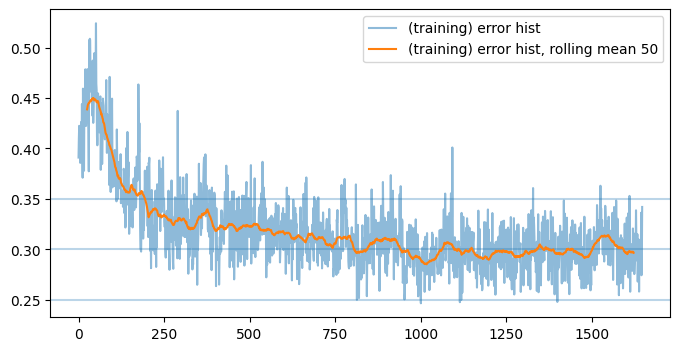

batches:  tensor(1671, dtype=torch.int32)
batches:  tensor(1672, dtype=torch.int32)
batches:  tensor(1673, dtype=torch.int32)
batches:  tensor(1674, dtype=torch.int32)
batches:  tensor(1675, dtype=torch.int32)
batches:  tensor(1676, dtype=torch.int32)
batches:  tensor(1677, dtype=torch.int32)
batches:  tensor(1678, dtype=torch.int32)
batches:  tensor(1679, dtype=torch.int32)
batches:  tensor(1680, dtype=torch.int32)


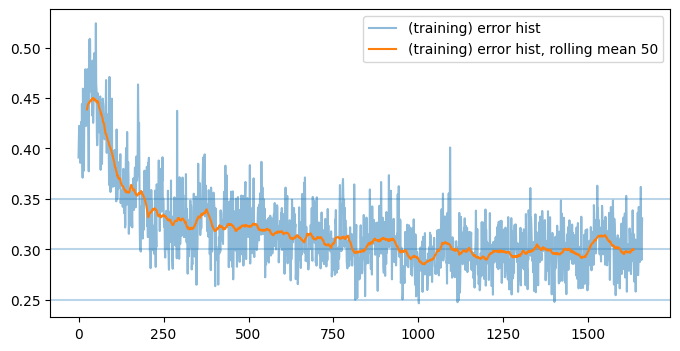

batches:  tensor(1681, dtype=torch.int32)
batches:  tensor(1682, dtype=torch.int32)
batches:  tensor(1683, dtype=torch.int32)
batches:  tensor(1684, dtype=torch.int32)
batches:  tensor(1685, dtype=torch.int32)
batches:  tensor(1686, dtype=torch.int32)
batches:  tensor(1687, dtype=torch.int32)
batches:  tensor(1688, dtype=torch.int32)
batches:  tensor(1689, dtype=torch.int32)
batches:  tensor(1690, dtype=torch.int32)


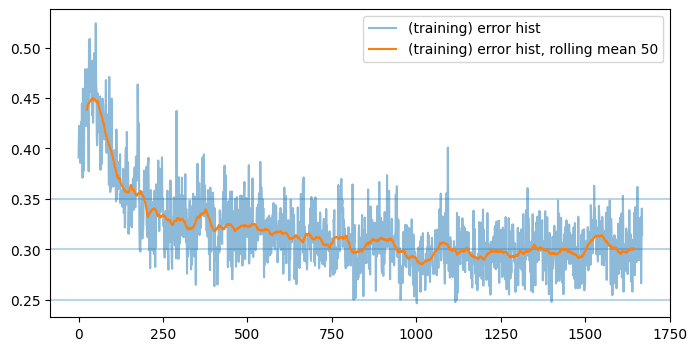

batches:  tensor(1691, dtype=torch.int32)
batches:  tensor(1692, dtype=torch.int32)
batches:  tensor(1693, dtype=torch.int32)
batches:  tensor(1694, dtype=torch.int32)
batches:  tensor(1695, dtype=torch.int32)
batches:  tensor(1696, dtype=torch.int32)
batches:  tensor(1697, dtype=torch.int32)
batches:  tensor(1698, dtype=torch.int32)
batches:  tensor(1699, dtype=torch.int32)
batches:  tensor(1700, dtype=torch.int32)


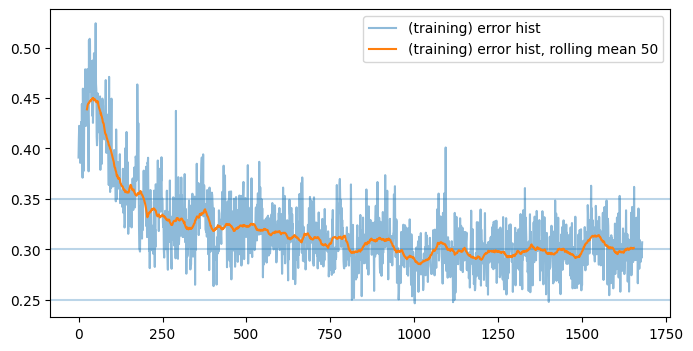

batches:  tensor(1701, dtype=torch.int32)
batches:  tensor(1702, dtype=torch.int32)
batches:  tensor(1703, dtype=torch.int32)
batches:  tensor(1704, dtype=torch.int32)
batches:  tensor(1705, dtype=torch.int32)
batches:  tensor(1706, dtype=torch.int32)
batches:  tensor(1707, dtype=torch.int32)
batches:  tensor(1708, dtype=torch.int32)
batches:  tensor(1709, dtype=torch.int32)
batches:  tensor(1710, dtype=torch.int32)


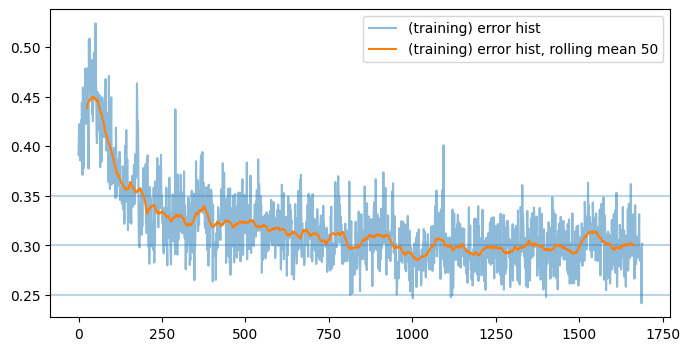

batches:  tensor(1711, dtype=torch.int32)
batches:  tensor(1712, dtype=torch.int32)
batches:  tensor(1713, dtype=torch.int32)
batches:  tensor(1714, dtype=torch.int32)
batches:  tensor(1715, dtype=torch.int32)
batches:  tensor(1716, dtype=torch.int32)
batches:  tensor(1717, dtype=torch.int32)
batches:  tensor(1718, dtype=torch.int32)
batches:  tensor(1719, dtype=torch.int32)
batches:  tensor(1720, dtype=torch.int32)


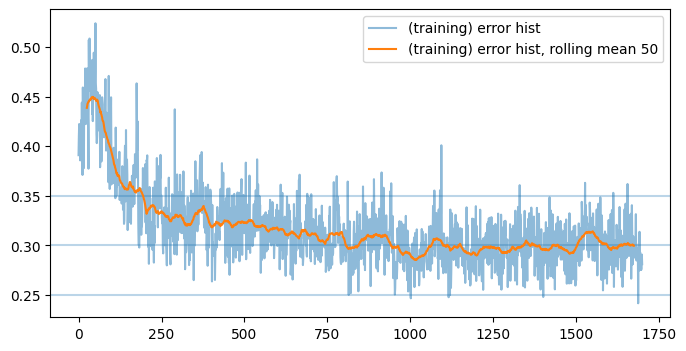

batches:  tensor(1721, dtype=torch.int32)
batches:  tensor(1722, dtype=torch.int32)
batches:  tensor(1723, dtype=torch.int32)
batches:  tensor(1724, dtype=torch.int32)
batches:  tensor(1725, dtype=torch.int32)
batches:  tensor(1726, dtype=torch.int32)
batches:  tensor(1727, dtype=torch.int32)
batches:  tensor(1728, dtype=torch.int32)
batches:  tensor(1729, dtype=torch.int32)
batches:  tensor(1730, dtype=torch.int32)


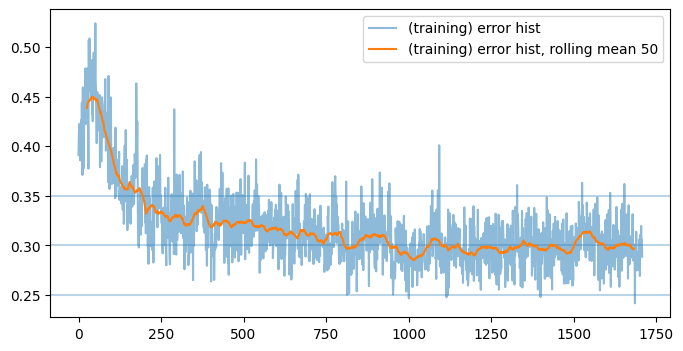

batches:  tensor(1731, dtype=torch.int32)
batches:  tensor(1732, dtype=torch.int32)
batches:  tensor(1733, dtype=torch.int32)
batches:  tensor(1734, dtype=torch.int32)
batches:  tensor(1735, dtype=torch.int32)
batches:  tensor(1736, dtype=torch.int32)
batches:  tensor(1737, dtype=torch.int32)
batches:  tensor(1738, dtype=torch.int32)
batches:  tensor(1739, dtype=torch.int32)
batches:  tensor(1740, dtype=torch.int32)


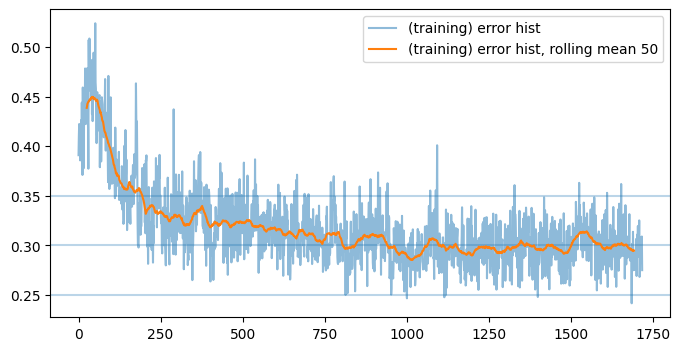

batches:  tensor(1741, dtype=torch.int32)
batches:  tensor(1742, dtype=torch.int32)
batches:  tensor(1743, dtype=torch.int32)
batches:  tensor(1744, dtype=torch.int32)
batches:  tensor(1745, dtype=torch.int32)
batches:  tensor(1746, dtype=torch.int32)
batches:  tensor(1747, dtype=torch.int32)
batches:  tensor(1748, dtype=torch.int32)
batches:  tensor(1749, dtype=torch.int32)
batches:  tensor(1750, dtype=torch.int32)


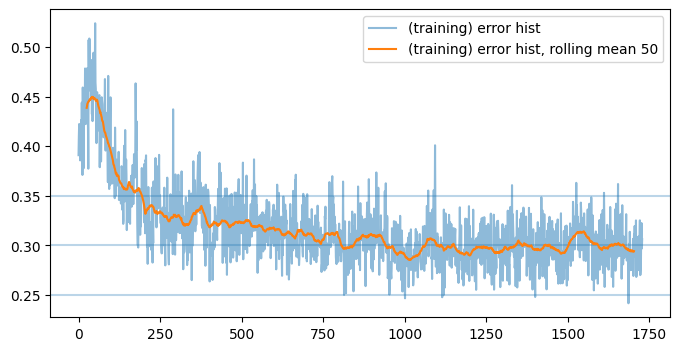

batches:  tensor(1751, dtype=torch.int32)
batches:  tensor(1752, dtype=torch.int32)
batches:  tensor(1753, dtype=torch.int32)
batches:  tensor(1754, dtype=torch.int32)
batches:  tensor(1755, dtype=torch.int32)
batches:  tensor(1756, dtype=torch.int32)
batches:  tensor(1757, dtype=torch.int32)
batches:  tensor(1758, dtype=torch.int32)
batches:  tensor(1759, dtype=torch.int32)
batches:  tensor(1760, dtype=torch.int32)


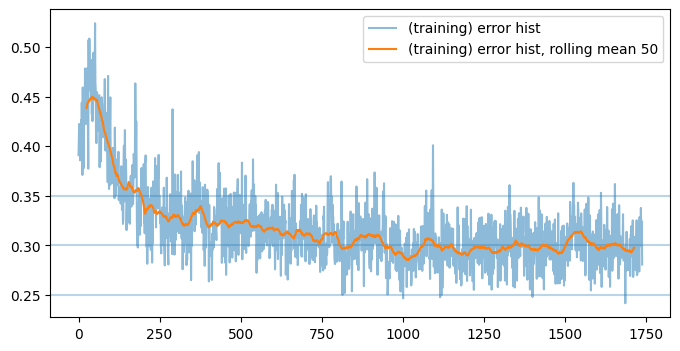

batches:  tensor(1761, dtype=torch.int32)
batches:  tensor(1762, dtype=torch.int32)
batches:  tensor(1763, dtype=torch.int32)
batches:  tensor(1764, dtype=torch.int32)
batches:  tensor(1765, dtype=torch.int32)
batches:  tensor(1766, dtype=torch.int32)
batches:  tensor(1767, dtype=torch.int32)
batches:  tensor(1768, dtype=torch.int32)
batches:  tensor(1769, dtype=torch.int32)
batches:  tensor(1770, dtype=torch.int32)


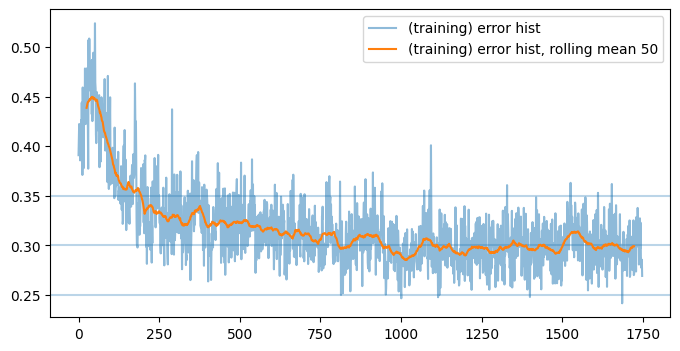

batches:  tensor(1771, dtype=torch.int32)
batches:  tensor(1772, dtype=torch.int32)
batches:  tensor(1773, dtype=torch.int32)
batches:  tensor(1774, dtype=torch.int32)
batches:  tensor(1775, dtype=torch.int32)
batches:  tensor(1776, dtype=torch.int32)
batches:  tensor(1777, dtype=torch.int32)
batches:  tensor(1778, dtype=torch.int32)
batches:  tensor(1779, dtype=torch.int32)
batches:  tensor(1781, dtype=torch.int32)
batches:  tensor(1782, dtype=torch.int32)
batches:  tensor(1783, dtype=torch.int32)
batches:  tensor(1784, dtype=torch.int32)
batches:  tensor(1786, dtype=torch.int32)
batches:  tensor(1787, dtype=torch.int32)
batches:  tensor(1788, dtype=torch.int32)
batches:  tensor(1789, dtype=torch.int32)
batches:  tensor(1790, dtype=torch.int32)


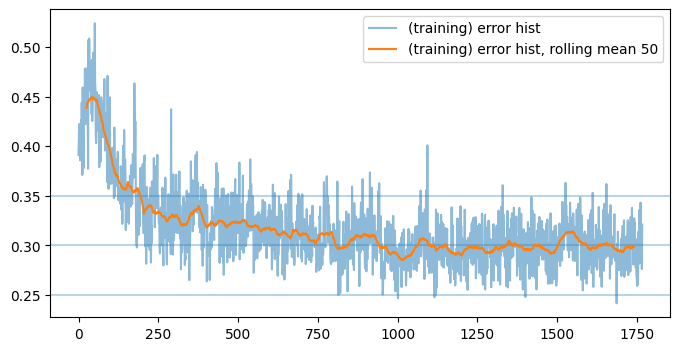

batches:  tensor(1791, dtype=torch.int32)
batches:  tensor(1792, dtype=torch.int32)
batches:  tensor(1793, dtype=torch.int32)
batches:  tensor(1794, dtype=torch.int32)
batches:  tensor(1795, dtype=torch.int32)
batches:  tensor(1796, dtype=torch.int32)
batches:  tensor(1797, dtype=torch.int32)
batches:  tensor(1798, dtype=torch.int32)
batches:  tensor(1799, dtype=torch.int32)
batches:  tensor(1800, dtype=torch.int32)


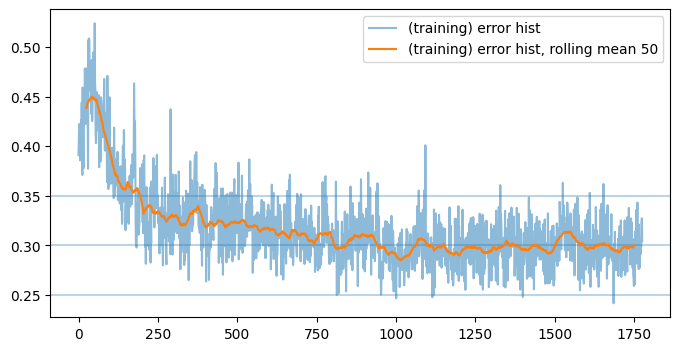

batches:  tensor(1801, dtype=torch.int32)
batches:  tensor(1802, dtype=torch.int32)
batches:  tensor(1803, dtype=torch.int32)
batches:  tensor(1804, dtype=torch.int32)
batches:  tensor(1805, dtype=torch.int32)
batches:  tensor(1806, dtype=torch.int32)
batches:  tensor(1807, dtype=torch.int32)
batches:  tensor(1808, dtype=torch.int32)
batches:  tensor(1809, dtype=torch.int32)
batches:  tensor(1810, dtype=torch.int32)


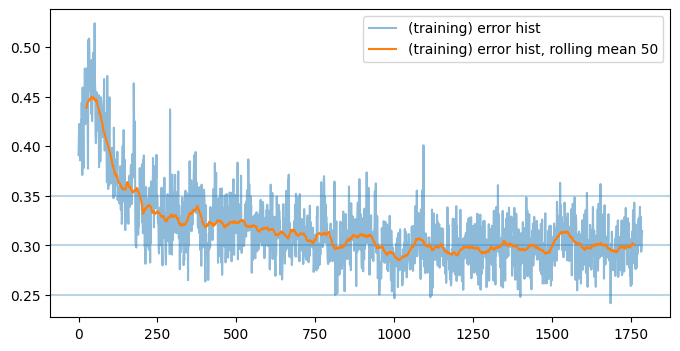

batches:  tensor(1811, dtype=torch.int32)
batches:  tensor(1812, dtype=torch.int32)
batches:  tensor(1813, dtype=torch.int32)
batches:  tensor(1814, dtype=torch.int32)
batches:  tensor(1815, dtype=torch.int32)
batches:  tensor(1816, dtype=torch.int32)
batches:  tensor(1817, dtype=torch.int32)
batches:  tensor(1819, dtype=torch.int32)
batches:  tensor(1820, dtype=torch.int32)


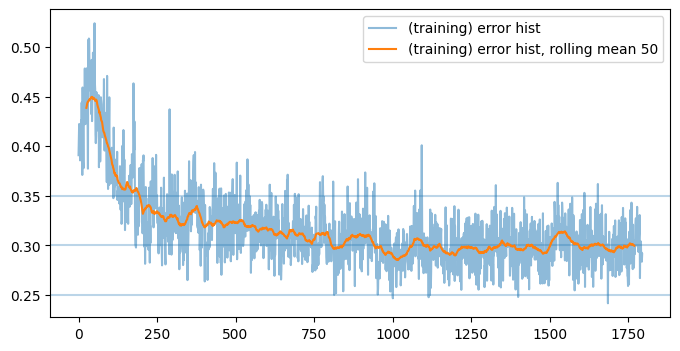

batches:  tensor(1821, dtype=torch.int32)
batches:  tensor(1822, dtype=torch.int32)
batches:  tensor(1824, dtype=torch.int32)
batches:  tensor(1825, dtype=torch.int32)
batches:  tensor(1826, dtype=torch.int32)
batches:  tensor(1827, dtype=torch.int32)
batches:  tensor(1828, dtype=torch.int32)
batches:  tensor(1829, dtype=torch.int32)
batches:  tensor(1830, dtype=torch.int32)


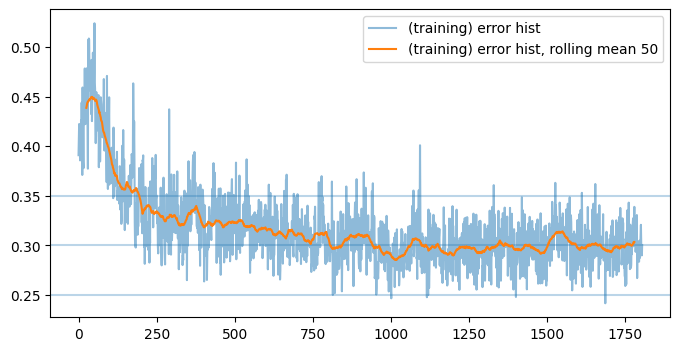

batches:  tensor(1831, dtype=torch.int32)
batches:  tensor(1832, dtype=torch.int32)
batches:  tensor(1833, dtype=torch.int32)
batches:  tensor(1834, dtype=torch.int32)
batches:  tensor(1835, dtype=torch.int32)
batches:  tensor(1836, dtype=torch.int32)
batches:  tensor(1837, dtype=torch.int32)
batches:  tensor(1838, dtype=torch.int32)
batches:  tensor(1840, dtype=torch.int32)


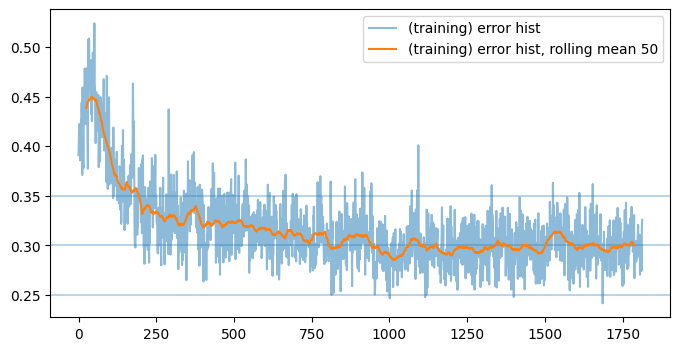

batches:  tensor(1841, dtype=torch.int32)
batches:  tensor(1842, dtype=torch.int32)
batches:  tensor(1843, dtype=torch.int32)
batches:  tensor(1845, dtype=torch.int32)
batches:  tensor(1846, dtype=torch.int32)
batches:  tensor(1847, dtype=torch.int32)
batches:  tensor(1848, dtype=torch.int32)
batches:  tensor(1850, dtype=torch.int32)


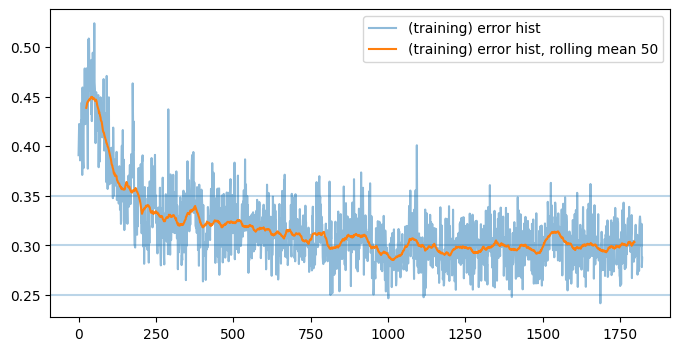

batches:  tensor(1851, dtype=torch.int32)
batches:  tensor(1852, dtype=torch.int32)
batches:  tensor(1853, dtype=torch.int32)
batches:  tensor(1854, dtype=torch.int32)
batches:  tensor(1855, dtype=torch.int32)
batches:  tensor(1856, dtype=torch.int32)
batches:  tensor(1857, dtype=torch.int32)
batches:  tensor(1858, dtype=torch.int32)
batches:  tensor(1859, dtype=torch.int32)
batches:  tensor(1860, dtype=torch.int32)


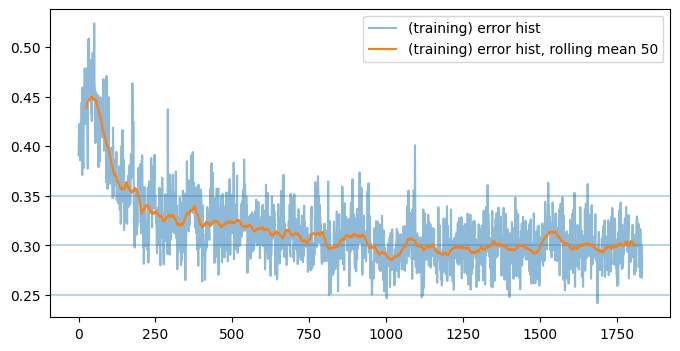

batches:  tensor(1861, dtype=torch.int32)
batches:  tensor(1862, dtype=torch.int32)
batches:  tensor(1863, dtype=torch.int32)
batches:  tensor(1864, dtype=torch.int32)
batches:  tensor(1865, dtype=torch.int32)
batches:  tensor(1866, dtype=torch.int32)
batches:  tensor(1867, dtype=torch.int32)
batches:  tensor(1868, dtype=torch.int32)
batches:  tensor(1869, dtype=torch.int32)
batches:  tensor(1870, dtype=torch.int32)


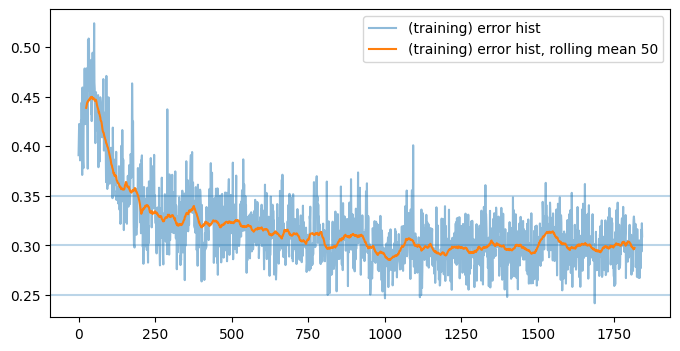

batches:  tensor(1871, dtype=torch.int32)
batches:  tensor(1872, dtype=torch.int32)
batches:  tensor(1873, dtype=torch.int32)
batches:  tensor(1874, dtype=torch.int32)
batches:  tensor(1875, dtype=torch.int32)
batches:  tensor(1876, dtype=torch.int32)
batches:  tensor(1877, dtype=torch.int32)
batches:  tensor(1878, dtype=torch.int32)
batches:  tensor(1879, dtype=torch.int32)
batches:  tensor(1880, dtype=torch.int32)


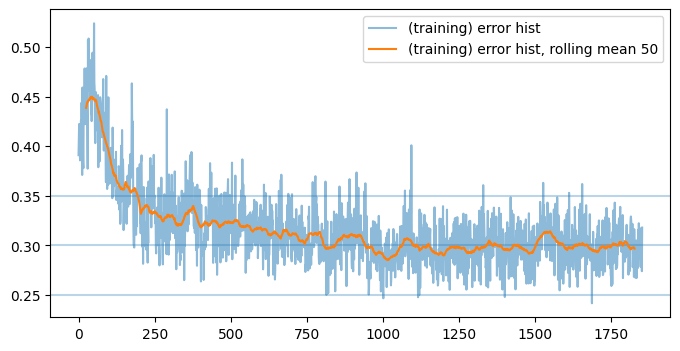

batches:  tensor(1881, dtype=torch.int32)
batches:  tensor(1882, dtype=torch.int32)
batches:  tensor(1883, dtype=torch.int32)
batches:  tensor(1884, dtype=torch.int32)
batches:  tensor(1885, dtype=torch.int32)
batches:  tensor(1886, dtype=torch.int32)
batches:  tensor(1887, dtype=torch.int32)
batches:  tensor(1888, dtype=torch.int32)
batches:  tensor(1889, dtype=torch.int32)
batches:  tensor(1890, dtype=torch.int32)


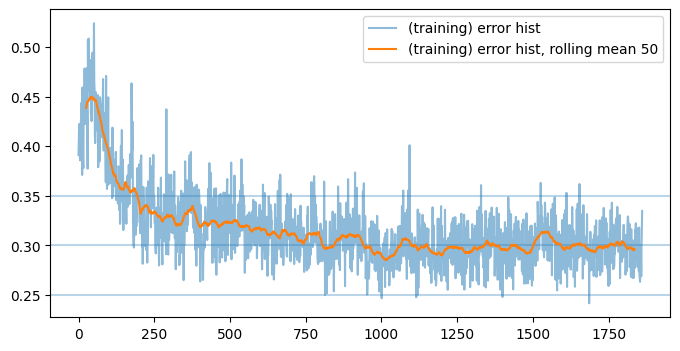

batches:  tensor(1891, dtype=torch.int32)
batches:  tensor(1892, dtype=torch.int32)
batches:  tensor(1893, dtype=torch.int32)
batches:  tensor(1894, dtype=torch.int32)
batches:  tensor(1895, dtype=torch.int32)
batches:  tensor(1896, dtype=torch.int32)
batches:  tensor(1897, dtype=torch.int32)
batches:  tensor(1898, dtype=torch.int32)
batches:  tensor(1899, dtype=torch.int32)
batches:  tensor(1900, dtype=torch.int32)


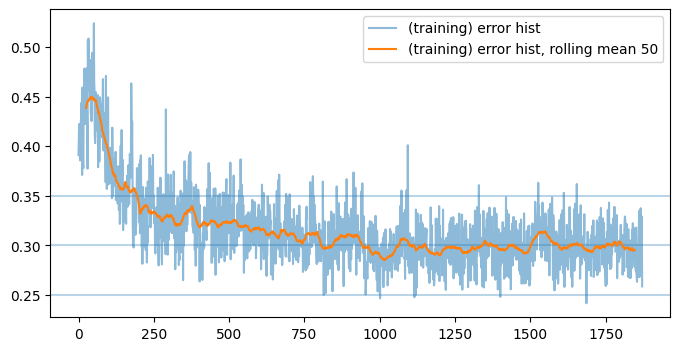

batches:  tensor(1901, dtype=torch.int32)
batches:  tensor(1902, dtype=torch.int32)
batches:  tensor(1903, dtype=torch.int32)
batches:  tensor(1904, dtype=torch.int32)
batches:  tensor(1905, dtype=torch.int32)
batches:  tensor(1906, dtype=torch.int32)
batches:  tensor(1907, dtype=torch.int32)
batches:  tensor(1908, dtype=torch.int32)
batches:  tensor(1909, dtype=torch.int32)
batches:  tensor(1910, dtype=torch.int32)


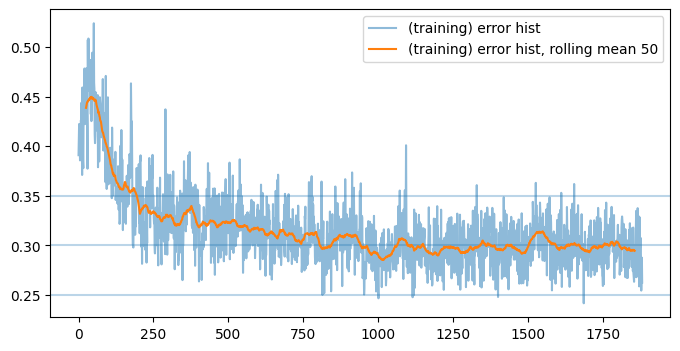

batches:  tensor(1911, dtype=torch.int32)
batches:  tensor(1912, dtype=torch.int32)
batches:  tensor(1913, dtype=torch.int32)
batches:  tensor(1914, dtype=torch.int32)
batches:  tensor(1915, dtype=torch.int32)
batches:  tensor(1916, dtype=torch.int32)
batches:  tensor(1917, dtype=torch.int32)
batches:  tensor(1918, dtype=torch.int32)
batches:  tensor(1919, dtype=torch.int32)
batches:  tensor(1920, dtype=torch.int32)


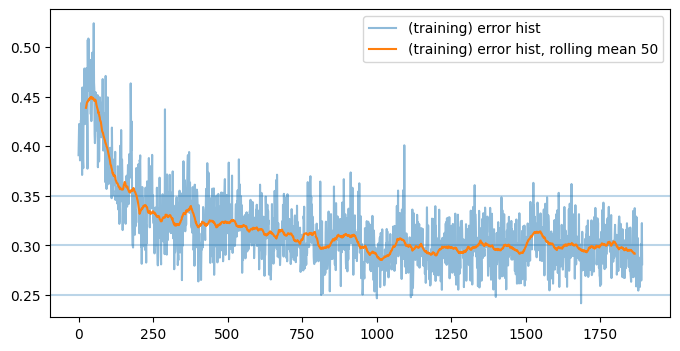

batches:  tensor(1921, dtype=torch.int32)
batches:  tensor(1922, dtype=torch.int32)
batches:  tensor(1923, dtype=torch.int32)
batches:  tensor(1924, dtype=torch.int32)
batches:  tensor(1925, dtype=torch.int32)
batches:  tensor(1926, dtype=torch.int32)
batches:  tensor(1927, dtype=torch.int32)
batches:  tensor(1928, dtype=torch.int32)
batches:  tensor(1929, dtype=torch.int32)
batches:  tensor(1930, dtype=torch.int32)


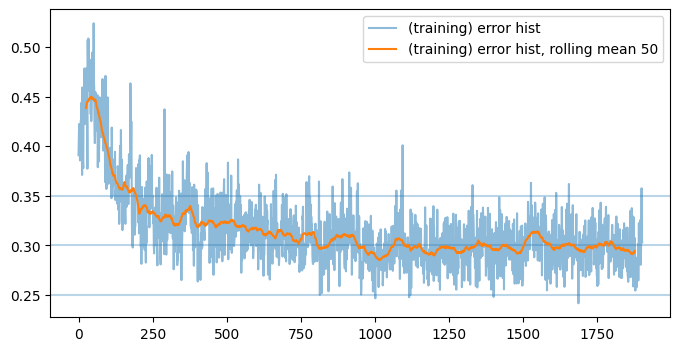

batches:  tensor(1932, dtype=torch.int32)
batches:  tensor(1933, dtype=torch.int32)
batches:  tensor(1934, dtype=torch.int32)
batches:  tensor(1936, dtype=torch.int32)
batches:  tensor(1937, dtype=torch.int32)
batches:  tensor(1938, dtype=torch.int32)
batches:  tensor(1939, dtype=torch.int32)
batches:  tensor(1940, dtype=torch.int32)


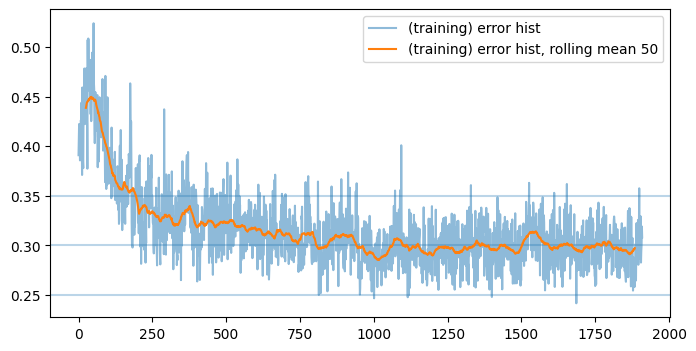

batches:  tensor(1941, dtype=torch.int32)
batches:  tensor(1942, dtype=torch.int32)
batches:  tensor(1943, dtype=torch.int32)
batches:  tensor(1944, dtype=torch.int32)
batches:  tensor(1945, dtype=torch.int32)
batches:  tensor(1946, dtype=torch.int32)
batches:  tensor(1947, dtype=torch.int32)
batches:  tensor(1948, dtype=torch.int32)
batches:  tensor(1949, dtype=torch.int32)
batches:  tensor(1950, dtype=torch.int32)


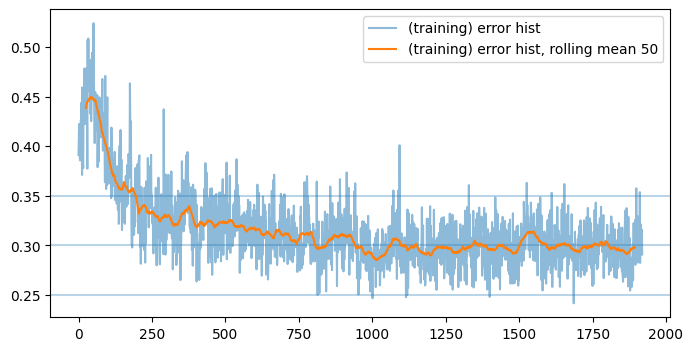

batches:  tensor(1951, dtype=torch.int32)
batches:  tensor(1952, dtype=torch.int32)
batches:  tensor(1953, dtype=torch.int32)
batches:  tensor(1954, dtype=torch.int32)
batches:  tensor(1955, dtype=torch.int32)
batches:  tensor(1956, dtype=torch.int32)
batches:  tensor(1957, dtype=torch.int32)
batches:  tensor(1958, dtype=torch.int32)
batches:  tensor(1959, dtype=torch.int32)
batches:  tensor(1960, dtype=torch.int32)


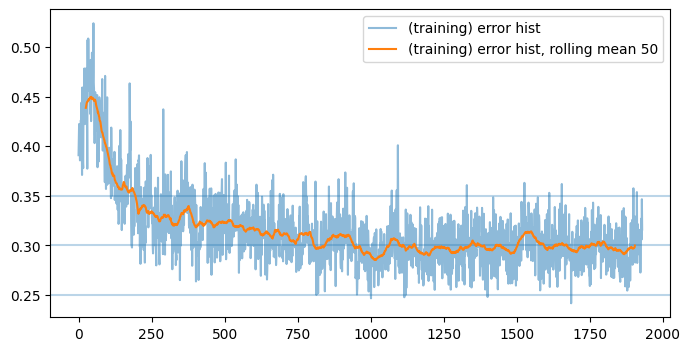

batches:  tensor(1961, dtype=torch.int32)
batches:  tensor(1962, dtype=torch.int32)
batches:  tensor(1963, dtype=torch.int32)
batches:  tensor(1964, dtype=torch.int32)
batches:  tensor(1965, dtype=torch.int32)
batches:  tensor(1966, dtype=torch.int32)
batches:  tensor(1967, dtype=torch.int32)
batches:  tensor(1968, dtype=torch.int32)
batches:  tensor(1969, dtype=torch.int32)
batches:  tensor(1970, dtype=torch.int32)


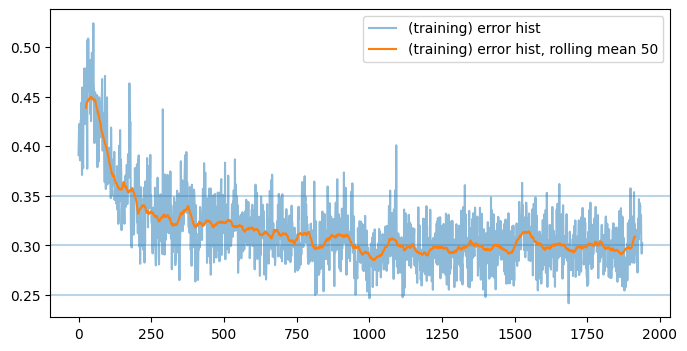

batches:  tensor(1971, dtype=torch.int32)
batches:  tensor(1972, dtype=torch.int32)
batches:  tensor(1973, dtype=torch.int32)
batches:  tensor(1974, dtype=torch.int32)
batches:  tensor(1975, dtype=torch.int32)
batches:  tensor(1976, dtype=torch.int32)
batches:  tensor(1977, dtype=torch.int32)
batches:  tensor(1978, dtype=torch.int32)
batches:  tensor(1979, dtype=torch.int32)
batches:  tensor(1980, dtype=torch.int32)


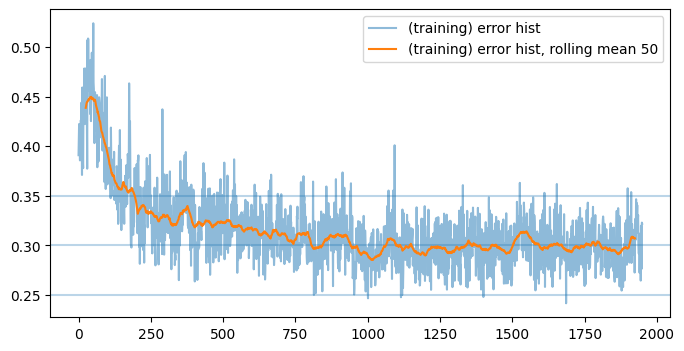

batches:  tensor(1981, dtype=torch.int32)
batches:  tensor(1982, dtype=torch.int32)
batches:  tensor(1983, dtype=torch.int32)
batches:  tensor(1984, dtype=torch.int32)
batches:  tensor(1985, dtype=torch.int32)
batches:  tensor(1986, dtype=torch.int32)
batches:  tensor(1987, dtype=torch.int32)
batches:  tensor(1988, dtype=torch.int32)
batches:  tensor(1989, dtype=torch.int32)
batches:  tensor(1990, dtype=torch.int32)


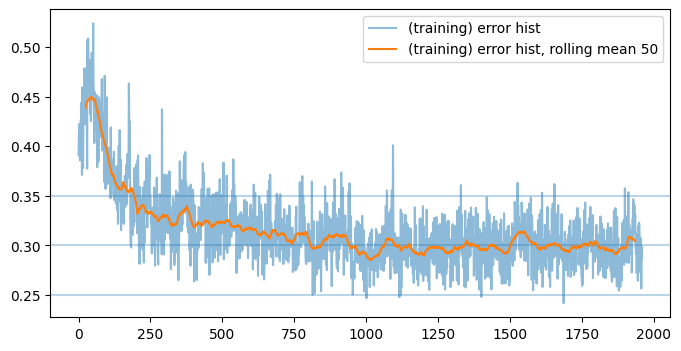

batches:  tensor(1991, dtype=torch.int32)
batches:  tensor(1992, dtype=torch.int32)
batches:  tensor(1993, dtype=torch.int32)
batches:  tensor(1994, dtype=torch.int32)
batches:  tensor(1995, dtype=torch.int32)
batches:  tensor(1996, dtype=torch.int32)
batches:  tensor(1997, dtype=torch.int32)
batches:  tensor(1998, dtype=torch.int32)
batches:  tensor(1999, dtype=torch.int32)
batches:  tensor(2000, dtype=torch.int32)


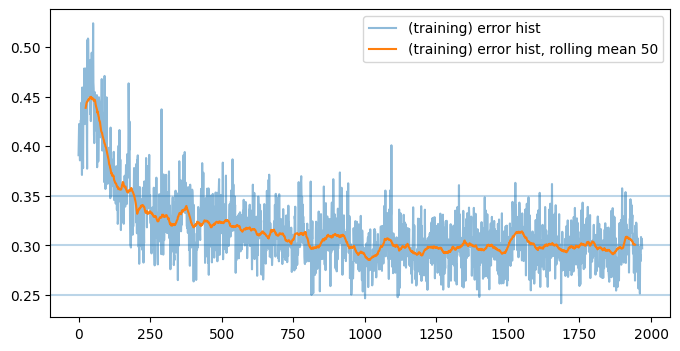

KeyboardInterrupt: 

In [4]:
lr0 = 1.5e-3
a = 250
n_batches = 100
n_replay = 20
weight_decay = 1e-7

av_window = 50 # window of averaging for error visual

while True:

    # wait for new data
    while True:
        try:
            with open('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v25/stats', 'rb') as f:
                stats = torch.load(f)
        except:
            time.sleep(0.05)
            continue
        if stats[0] - 1 > latest_batch_index:
            newest_batch = stats[0] - 1
            break
        else:
            time.sleep(0.05)

    # load all new data
    inputs = []
    labels = []
    for index in range(latest_batch_index + 1, newest_batch + 1):
        inputs.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v25/inputs_{}'.format(index)))
        labels.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v25/labels_{}'.format(index)))

    inputs_tens = torch.cat(inputs).float() # bool -> float
    labels_tens = torch.cat(labels)

    # get error of new data (without backprop)
    out = model(inputs_tens)
    out = out.view(out.shape[0])
    loss = criterion(out, labels_tens)
    error_hist.append(loss.item())

    # load additional older data to replay
    if latest_batch_index > 5:
        # samples from exp distribution, more recent -> more likely
        decay_rate = 0.02
        prob =  np.exp(-decay_rate * np.arange(latest_batch_index)) 
        prob = prob/sum(prob)
        num_samples = n_replay
        samples = np.random.choice(np.arange(latest_batch_index, 0, -1), size=num_samples, p=prob)
        for index in samples:
            inputs.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v25/inputs_{}'.format(index)))
            labels.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v25/labels_{}'.format(index)))

    inputs_tens = torch.cat(inputs).float() # bool -> float
    labels_tens = torch.cat(labels)

    # print('training batch ', newest_batch)
    t0 = time.time()

    # training step
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=lr0 * a / (a + newest_batch), weight_decay=weight_decay)

    # shuffle data and make mini batches
    indices = torch.randperm(len(inputs_tens))
    inputs_tens = inputs_tens[indices]
    labels_tens = labels_tens[indices]

    batch_size = len(inputs_tens) // n_batches

    inputs_loader = inputs_tens.split(batch_size)
    labels_loader = labels_tens.split(batch_size)

    for inputs, labels in zip(inputs_loader, labels_loader):

        out = model(inputs)
        out = out.view(out.shape[0])
        loss = criterion(out, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # print('training done ({}s)'.format(time.time() - t0))

    if newest_batch % 1 == 0 and newest_batch > 0:

        print('batches: ', newest_batch)
    
    torch.save(error_hist, './error_hist MC v25')

    if newest_batch % 10 == 0 and newest_batch > 0:


        plt.figure(figsize=(8, 4))

        plt.axhline(0.35, xmin=0, xmax=1000, alpha=0.3)
        plt.axhline(0.30, xmin=0, xmax=1000, alpha=0.3)
        plt.axhline(0.25, xmin=0, xmax=1000, alpha=0.3)

        plt.plot(error_hist, label='(training) error hist', alpha=0.5)
        plt.plot(range(av_window//2, len(error_hist) - av_window//2), [np.mean(error_hist[i:(i+av_window)]) for i in range(len(error_hist) - av_window)], label='(training) error hist, rolling mean '+str(av_window))
        plt.legend()

        plt.show()

        torch.save(model.state_dict(), './Model Saves MC v25/model_{}_batches'.format(newest_batch))

    latest_batch_index = newest_batch